<a href="https://colab.research.google.com/github/nazary1212/4010_Assignment/blob/main/4010project.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#**4010 Project - Forecasting Monthly U.S. State Construction Permits**

##**Data Preprocessing**


In [2]:
import pandas as pd
import numpy as np
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import mean_squared_error
import matplotlib.pyplot as plt

In [3]:
from google.colab import files
uploaded = files.upload()

df = pd.read_csv("construction_permits.csv")

# Look at structure
df.head()

# Check info
df.info()

# Check for missing or bad values
df.replace(["", "NA", "NaN"], pd.NA, inplace=True)
print(df.isnull().sum())


Saving construction_permits.csv to construction_permits.csv
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10747 entries, 0 to 10746
Data columns (total 13 columns):
 #   Column                       Non-Null Count  Dtype 
---  ------                       --------------  ----- 
 0   Name                         10747 non-null  object
 1   Number of Permits.1 unit     10747 non-null  int64 
 2   Number of Permits.2 units    10747 non-null  int64 
 3   Number of Permits.3-4 units  10747 non-null  int64 
 4   Number of Permits.5+ units   10747 non-null  int64 
 5   Period.full                  10747 non-null  object
 6   Period.month                 10747 non-null  int64 
 7   Period.month name            10747 non-null  object
 8   Period.year                  10747 non-null  int64 
 9   Valuations.1 unit            10747 non-null  int64 
 10  Valuations.2 units           10747 non-null  int64 
 11  Valuations.3-4 units         10747 non-null  int64 
 12  Valuations.5+ units         

In [4]:
df['Period.full'].head(20)


,Period.full
0,Jun.03
1,Jun.03
2,Jun.03
3,Jun.03
4,Jun.03
5,Jun.03
6,Jun.03
7,Jun.03
8,Jun.03
9,Jun.03


In [5]:
# Remove the dot from the month abbreviation
df['Period.full'] = df['Period.full'].str.replace('.', '', regex=False)

# Now convert to datetime
df['Period.full'] = pd.to_datetime(df['Period.full'], format='%b%y', errors='coerce')

print(df['Period.full'].head(10))




0   2003-06-01
1   2003-06-01
2   2003-06-01
3   2003-06-01
4   2003-06-01
5   2003-06-01
6   2003-06-01
7   2003-06-01
8   2003-06-01
9   2003-06-01
Name: Period.full, dtype: datetime64[ns]


In [6]:
df_state_monthly = (
    df.groupby(['Name', 'Period.full'])[['Number of Permits.1 unit',
                                         'Number of Permits.2 units',
                                         'Number of Permits.3-4 units',
                                         'Number of Permits.5+ units']].sum()
    .reset_index()
)


In [7]:
df_state_monthly['total_permits'] = df_state_monthly[
    ['Number of Permits.1 unit', 'Number of Permits.2 units',
     'Number of Permits.3-4 units', 'Number of Permits.5+ units']
].sum(axis=1)



In [8]:
df_state_monthly.head()


,Name,Period.full,Number of Permits.1 unit,Number of Permits.2 units,Number of Permits.3-4 units,Number of Permits.5+ units,total_permits
0,Alabama,2003-06-01,1864,16,15,398,2293
1,Alabama,2003-07-01,1943,6,0,173,2122
2,Alabama,2003-08-01,1984,34,9,274,2301
3,Alabama,2003-09-01,1800,20,16,468,2304
4,Alabama,2003-10-01,1751,16,0,436,2203


##**Total Permits**


 RNN for Alabama


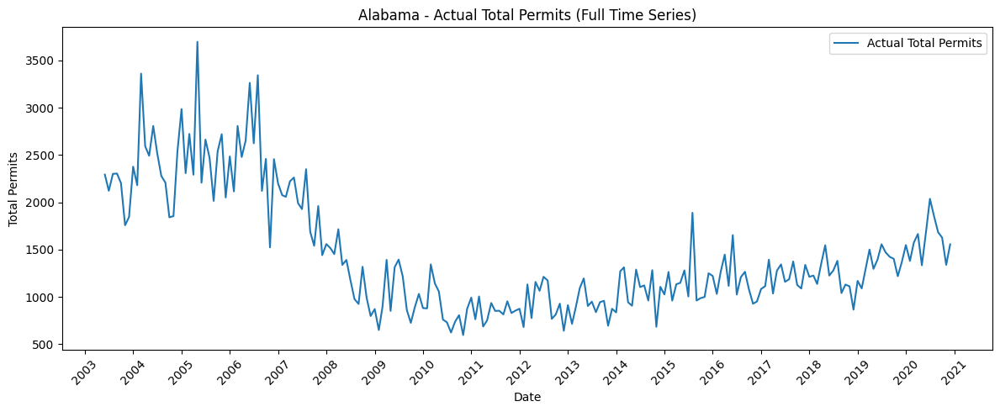

/usr/local/lib/python3.12/dist-packages/keras/src/layers/rnn/rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 352ms/step


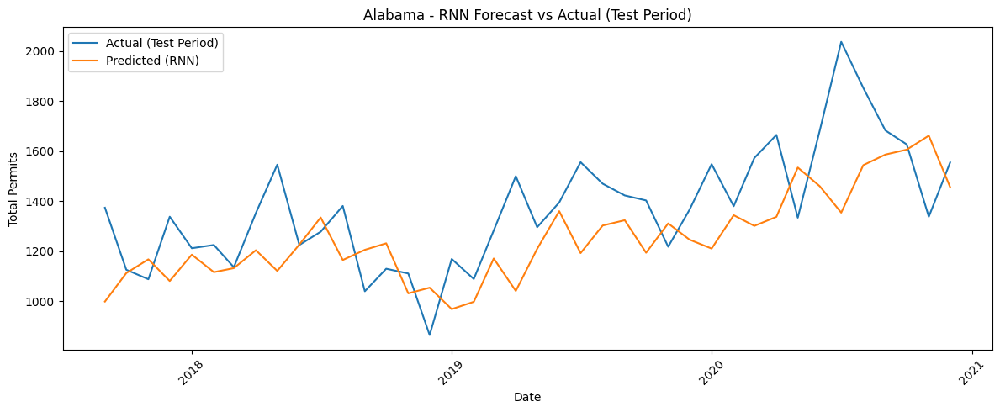


 RNN for Alaska


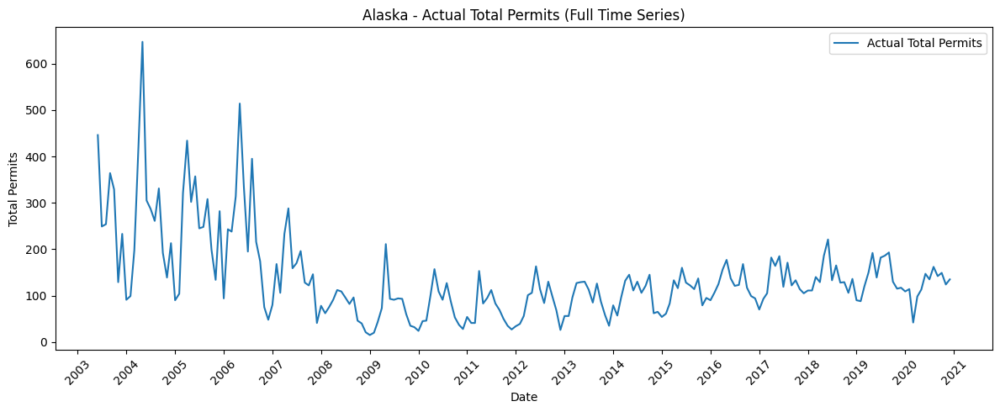

/usr/local/lib/python3.12/dist-packages/keras/src/layers/rnn/rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 316ms/step


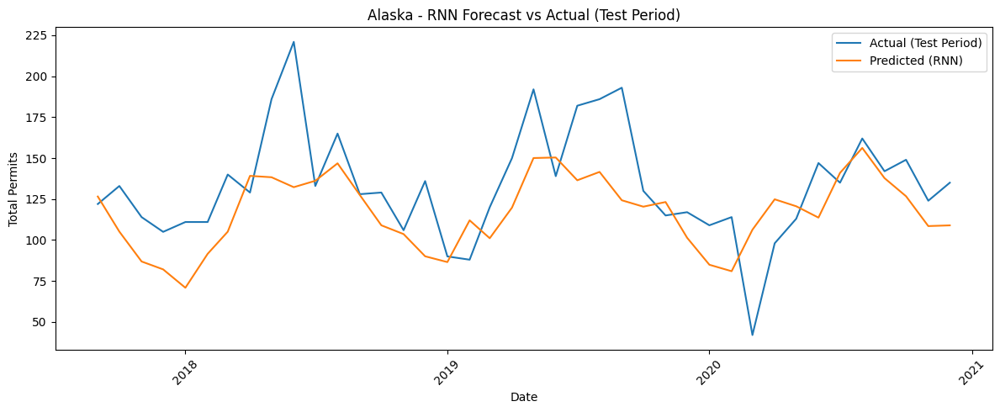


 RNN for Arizona


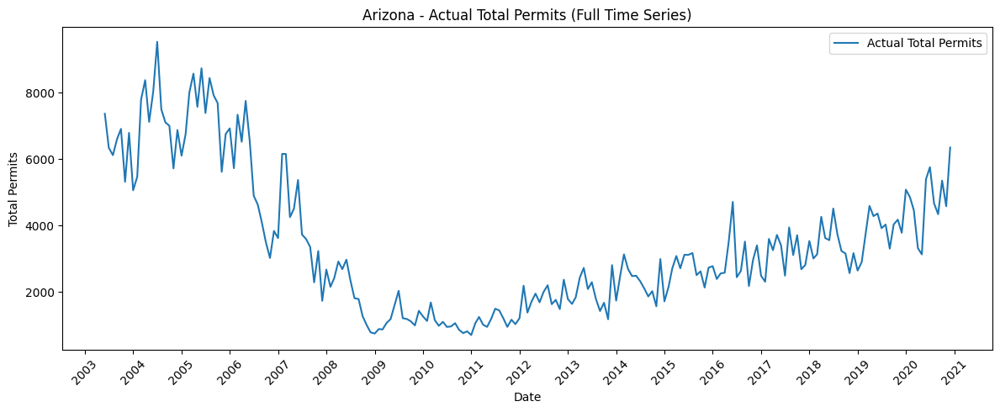

/usr/local/lib/python3.12/dist-packages/keras/src/layers/rnn/rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


1/2 ━━━━━━━━━━━━━━━━━━━━ 0s 293ms/step

2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 304ms/step


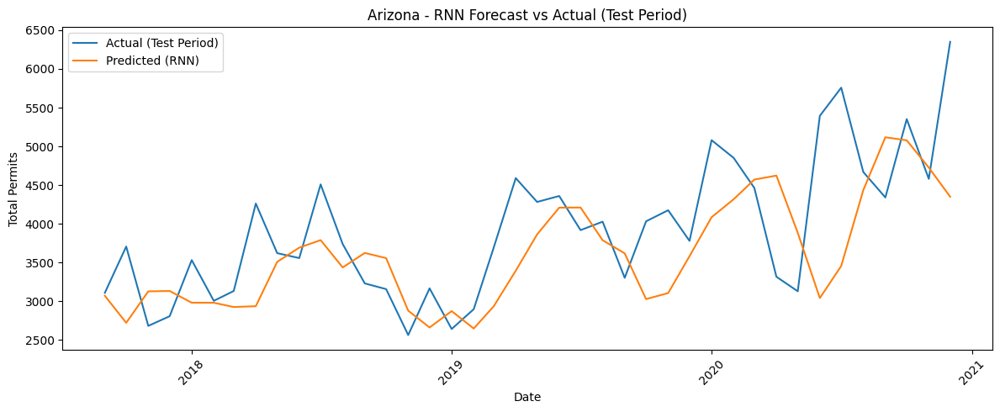


 RNN for Arkansas


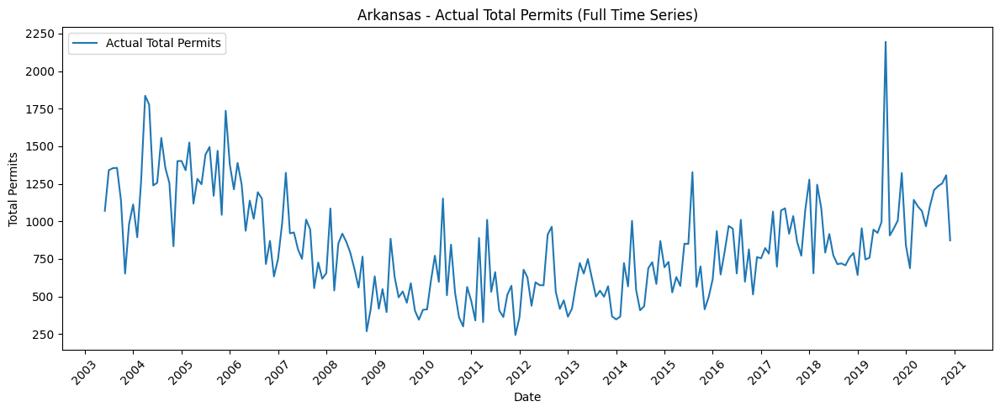

/usr/local/lib/python3.12/dist-packages/keras/src/layers/rnn/rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 314ms/step


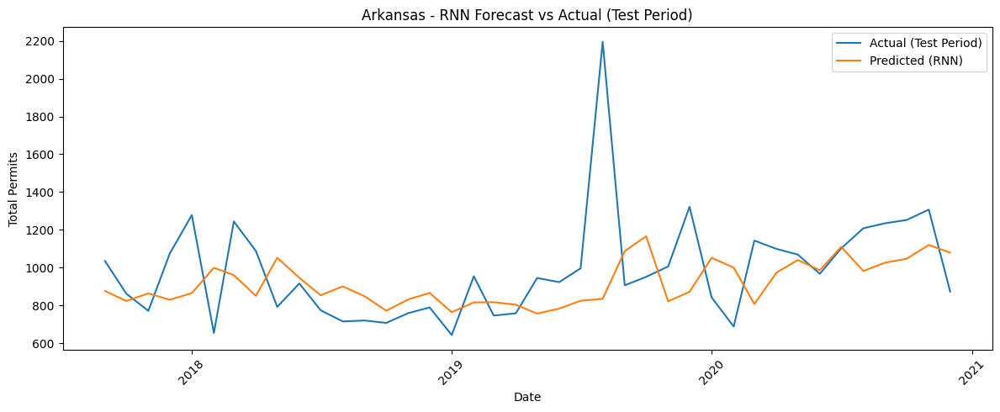


 RNN for California


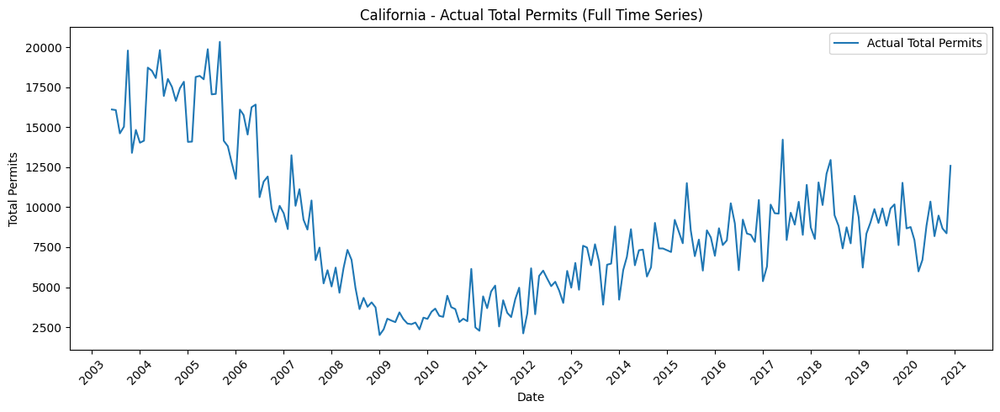

/usr/local/lib/python3.12/dist-packages/keras/src/layers/rnn/rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 305ms/step


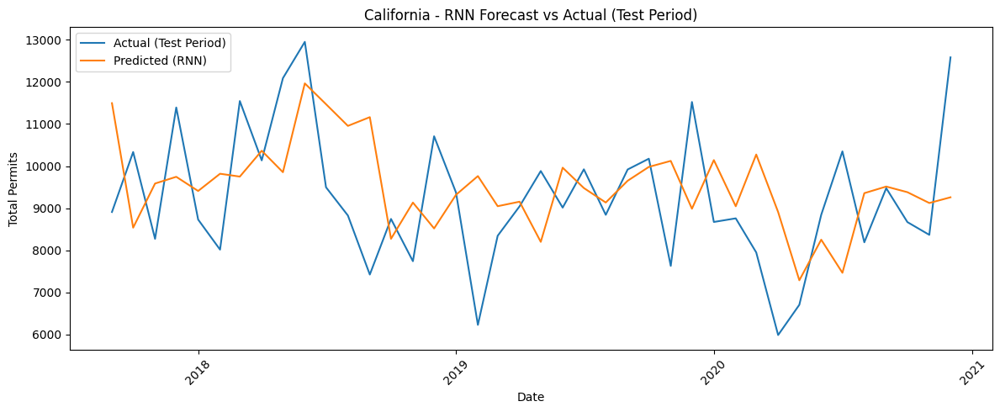


 RNN for Colorado


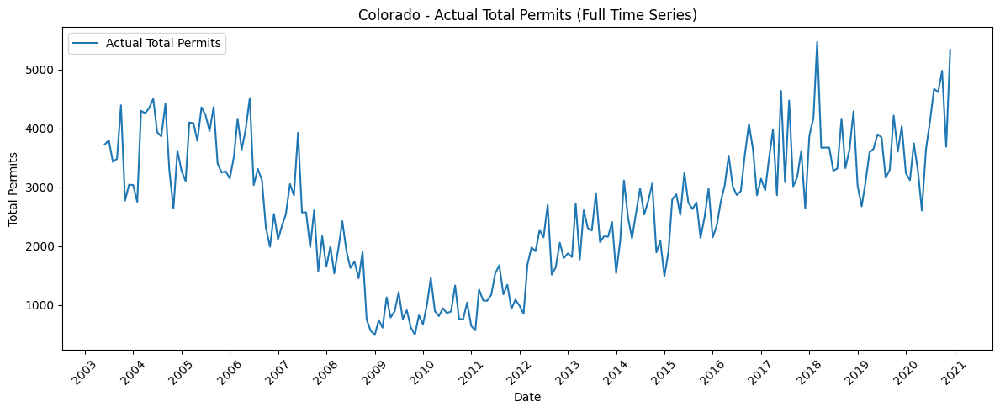

/usr/local/lib/python3.12/dist-packages/keras/src/layers/rnn/rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 310ms/step


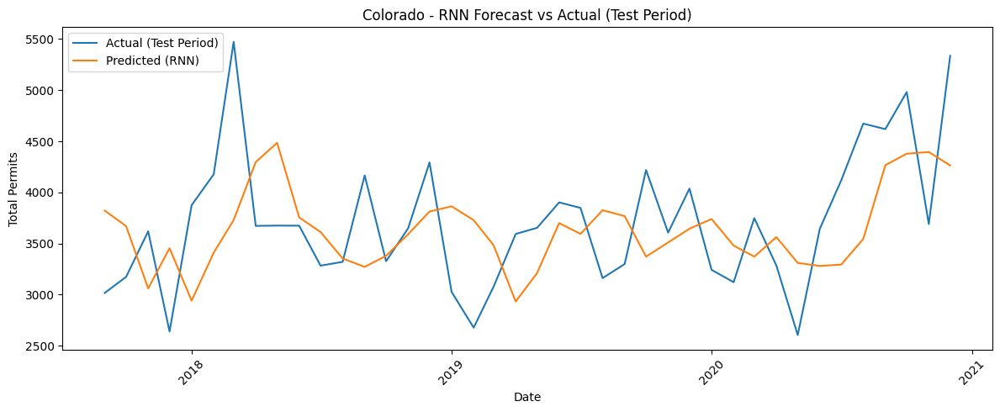


 RNN for Connecticut


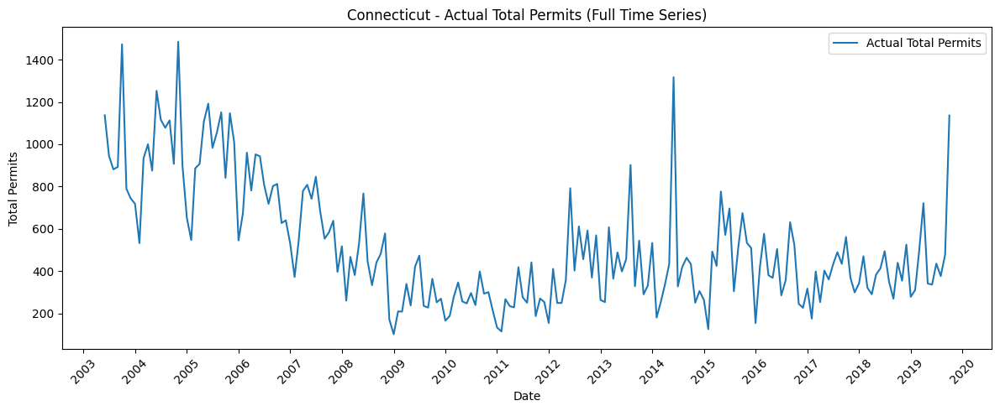

/usr/local/lib/python3.12/dist-packages/keras/src/layers/rnn/rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 379ms/step


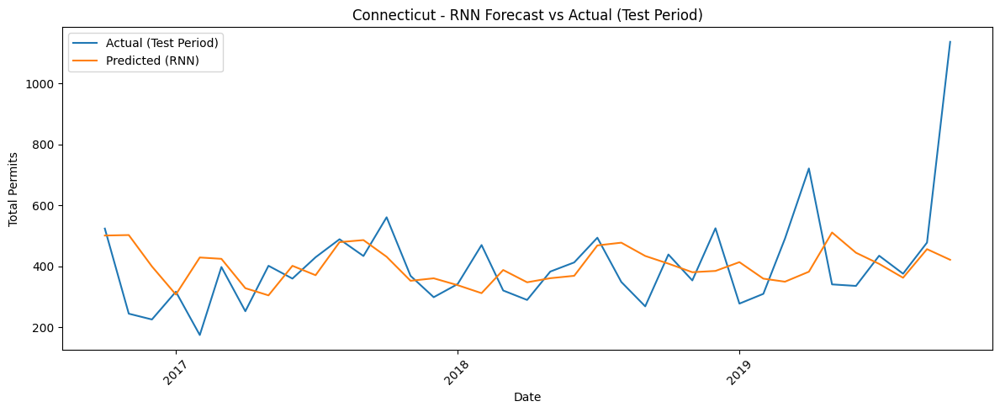


 RNN for Delaware


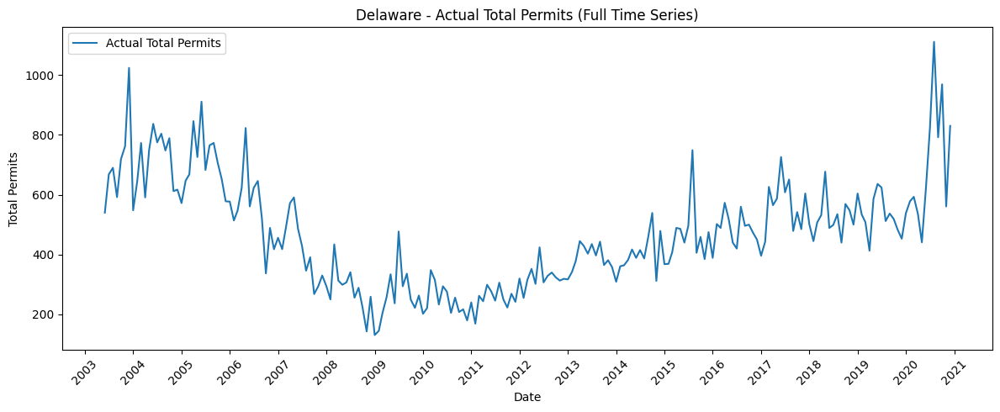

/usr/local/lib/python3.12/dist-packages/keras/src/layers/rnn/rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 305ms/step


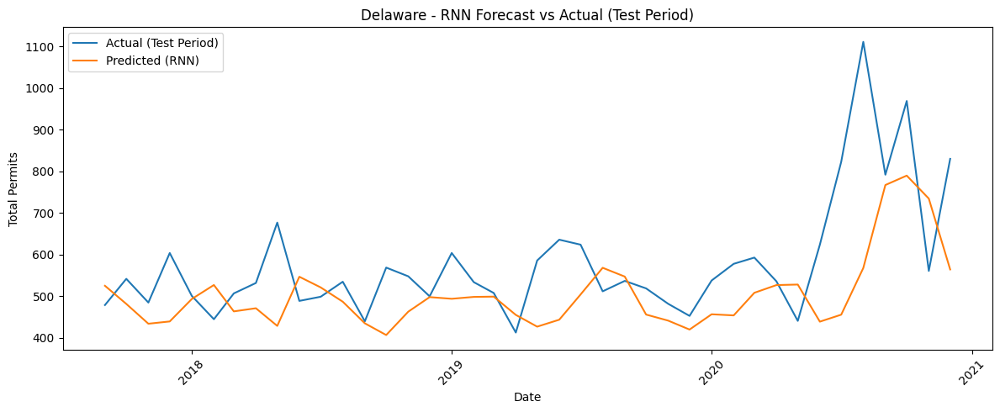


 RNN for District of Columbia


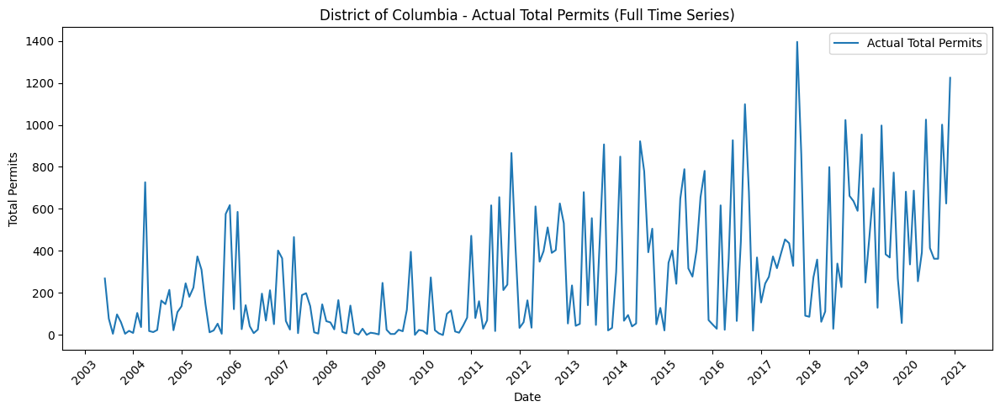

/usr/local/lib/python3.12/dist-packages/keras/src/layers/rnn/rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 308ms/step


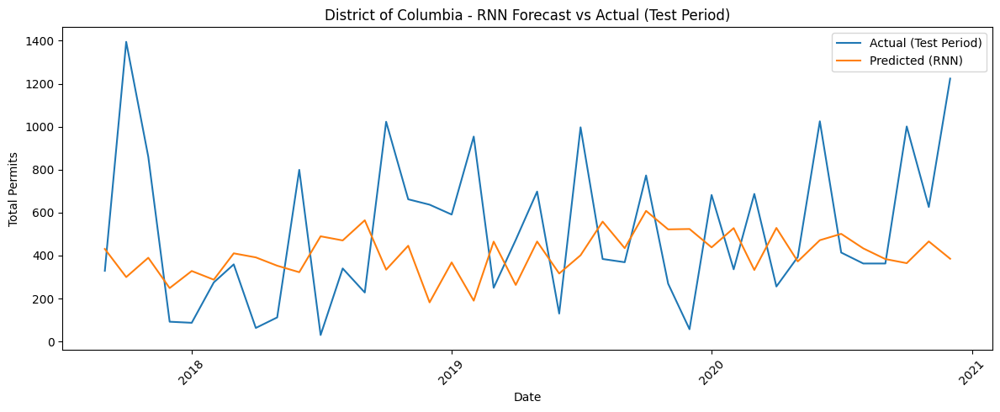


 RNN for Florida


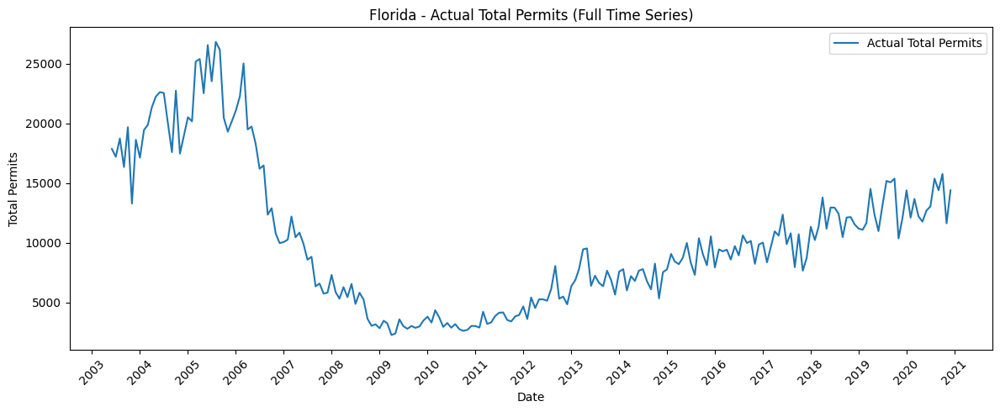

/usr/local/lib/python3.12/dist-packages/keras/src/layers/rnn/rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 308ms/step


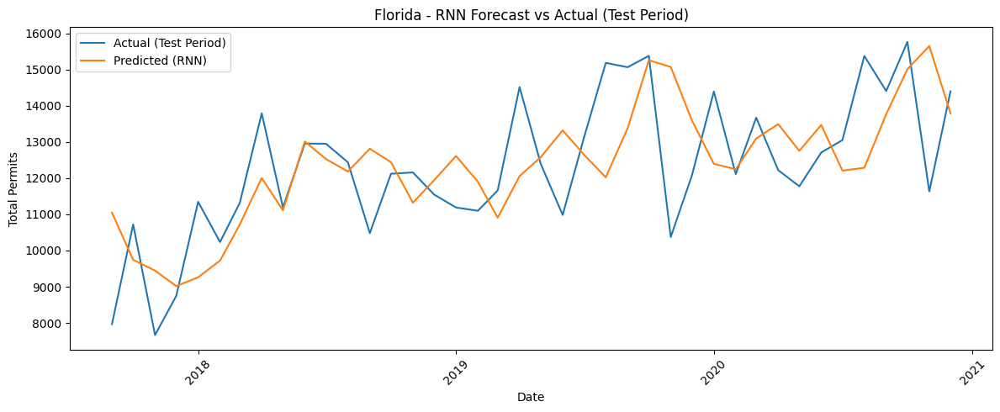


 RNN for Georgia


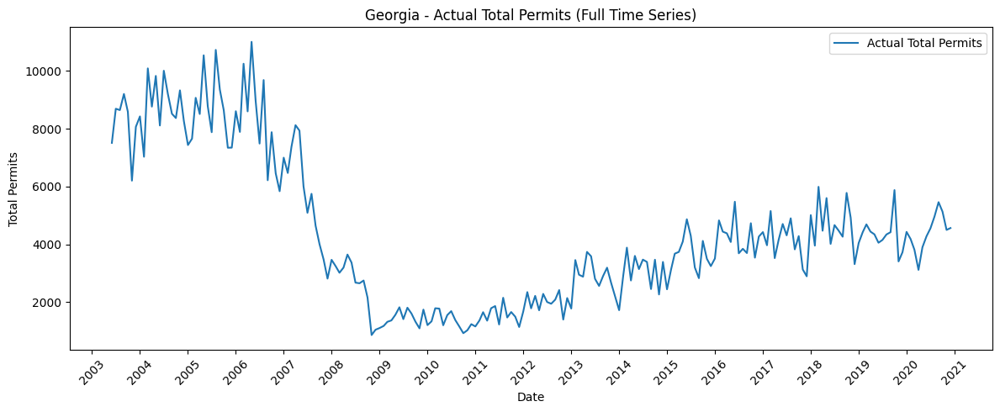

/usr/local/lib/python3.12/dist-packages/keras/src/layers/rnn/rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 330ms/step


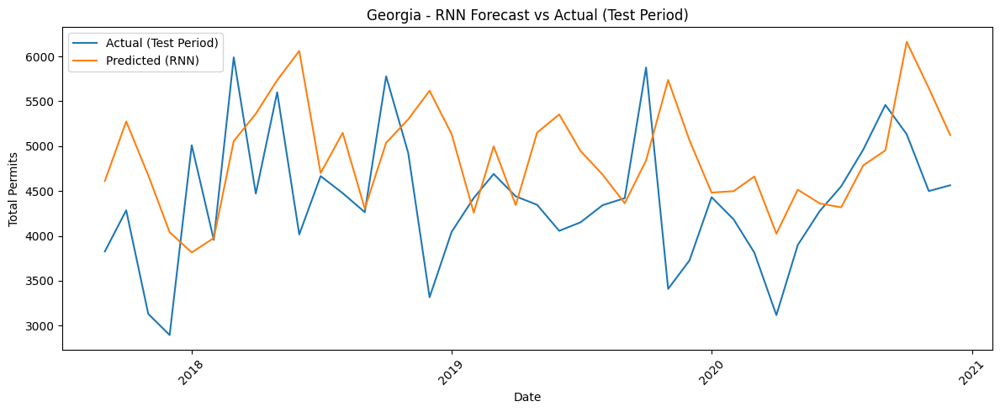


 RNN for Hawaii


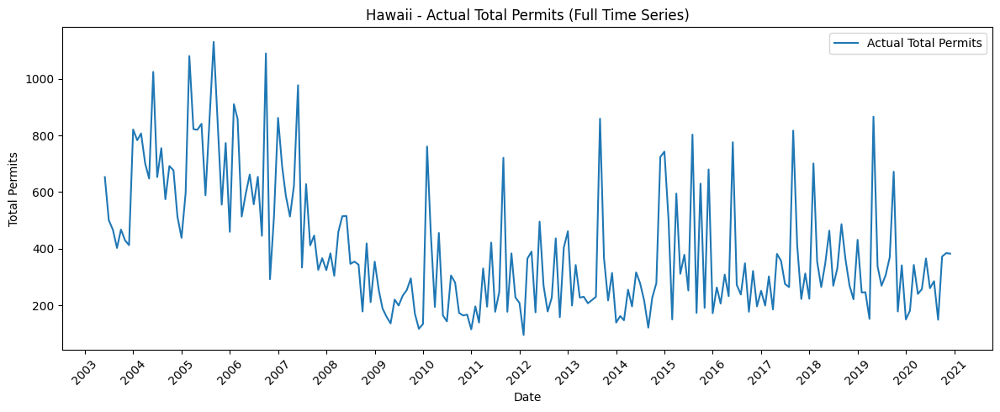

/usr/local/lib/python3.12/dist-packages/keras/src/layers/rnn/rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 318ms/step


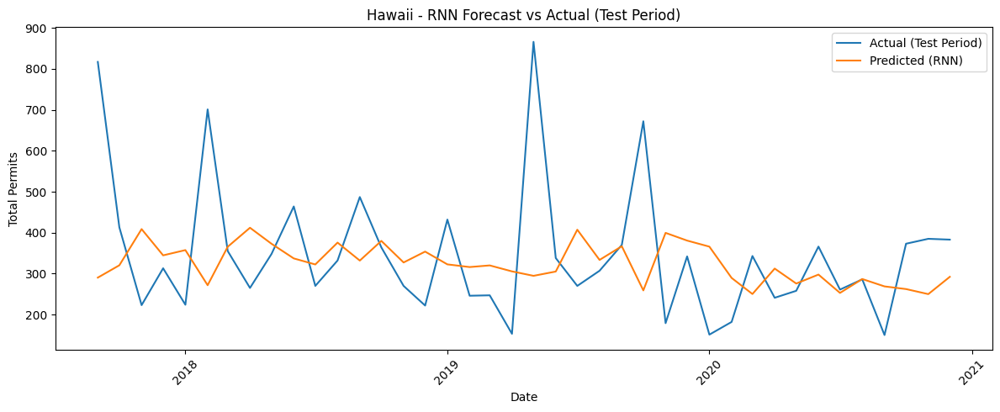


 RNN for Idaho


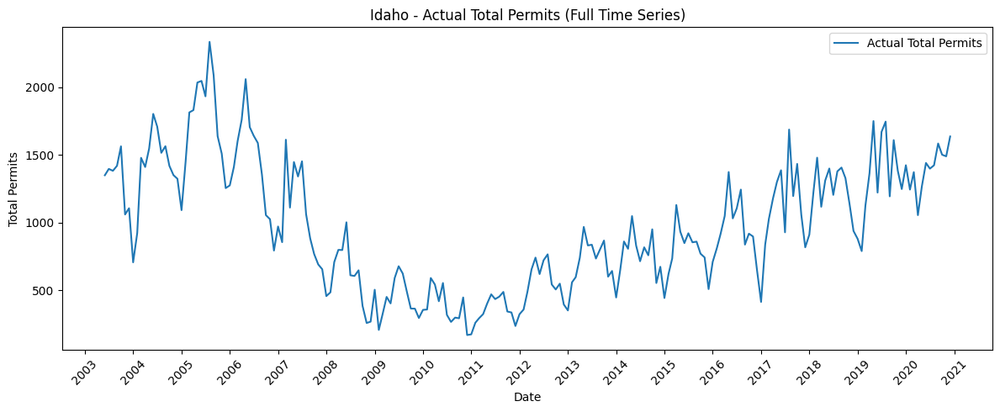

/usr/local/lib/python3.12/dist-packages/keras/src/layers/rnn/rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 462ms/step


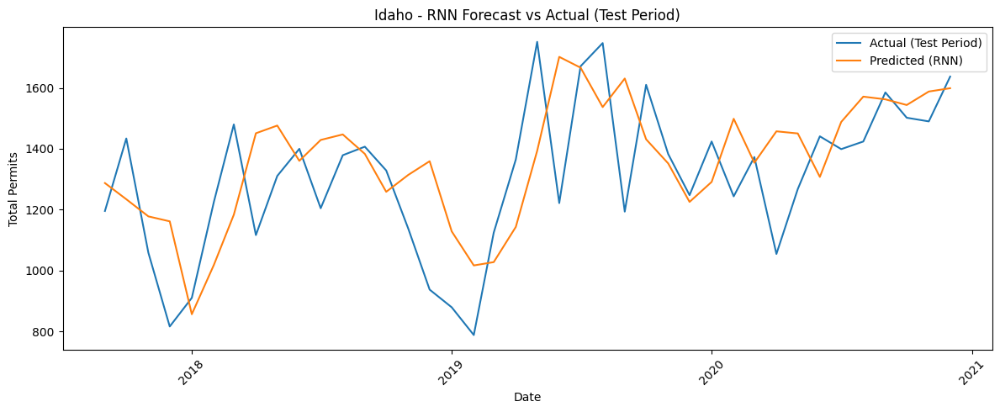


 RNN for Illinois


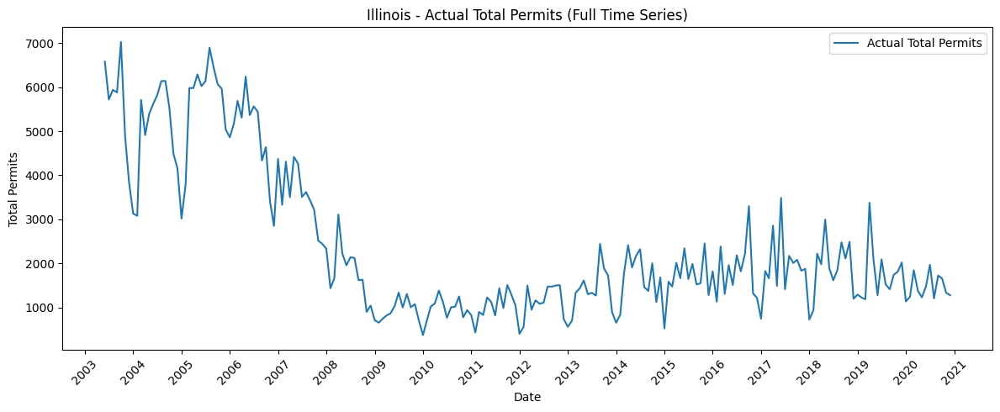

/usr/local/lib/python3.12/dist-packages/keras/src/layers/rnn/rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 306ms/step


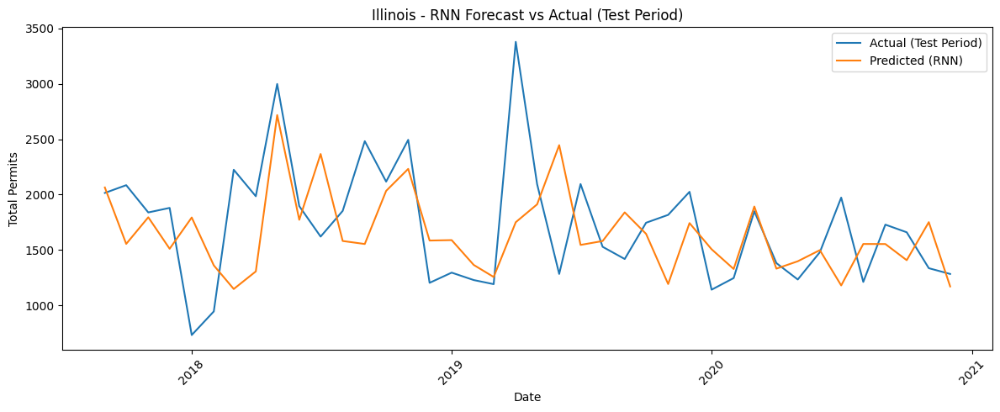


 RNN for Indiana


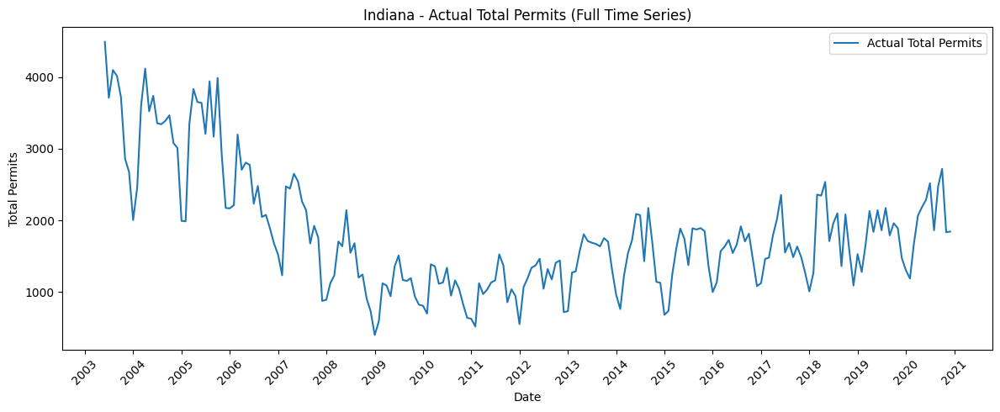

/usr/local/lib/python3.12/dist-packages/keras/src/layers/rnn/rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 316ms/step


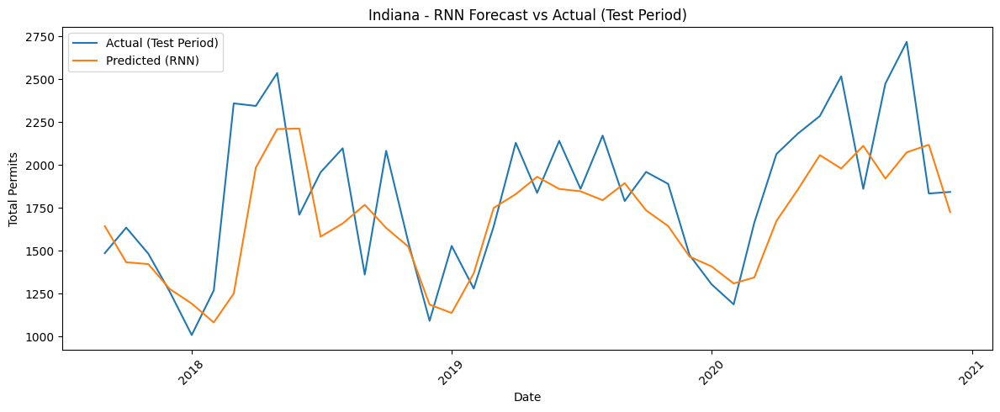


 RNN for Iowa


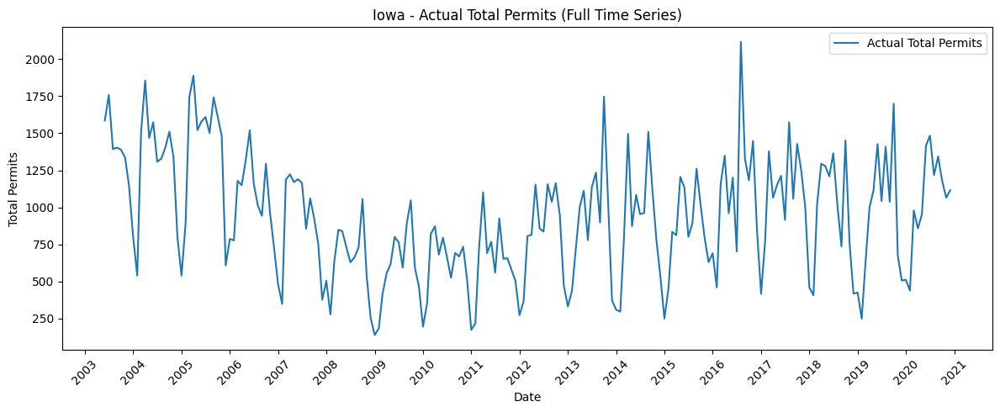

/usr/local/lib/python3.12/dist-packages/keras/src/layers/rnn/rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 317ms/step


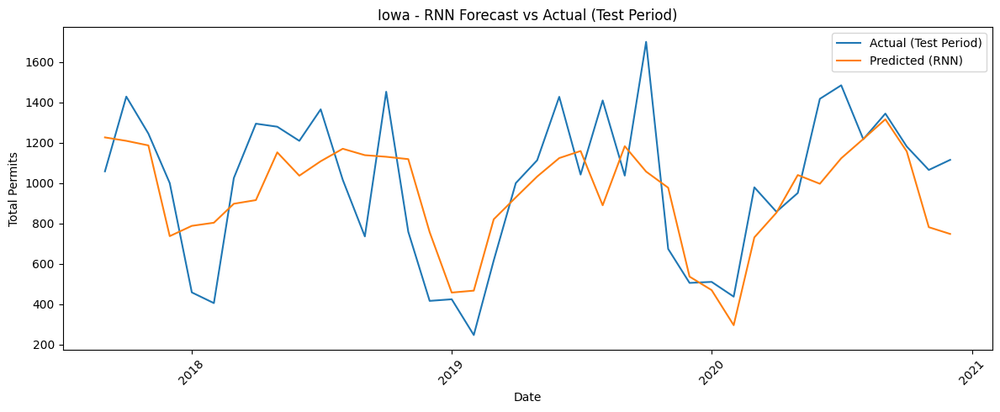


 RNN for Kansas


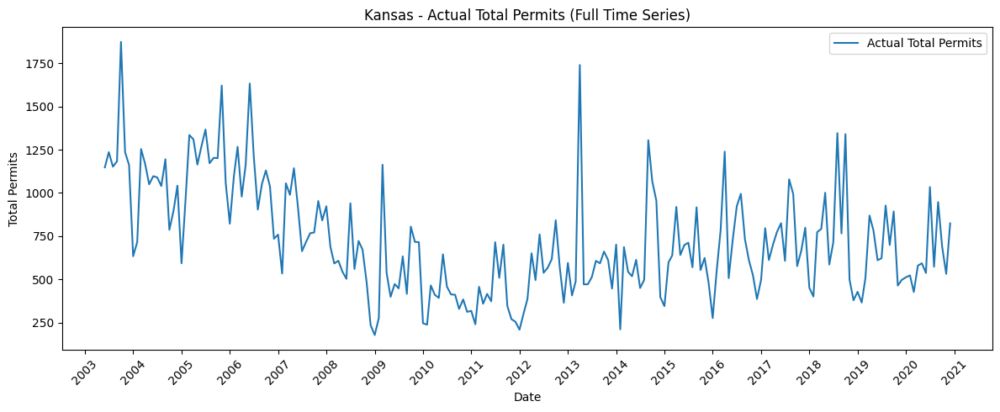

/usr/local/lib/python3.12/dist-packages/keras/src/layers/rnn/rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 317ms/step


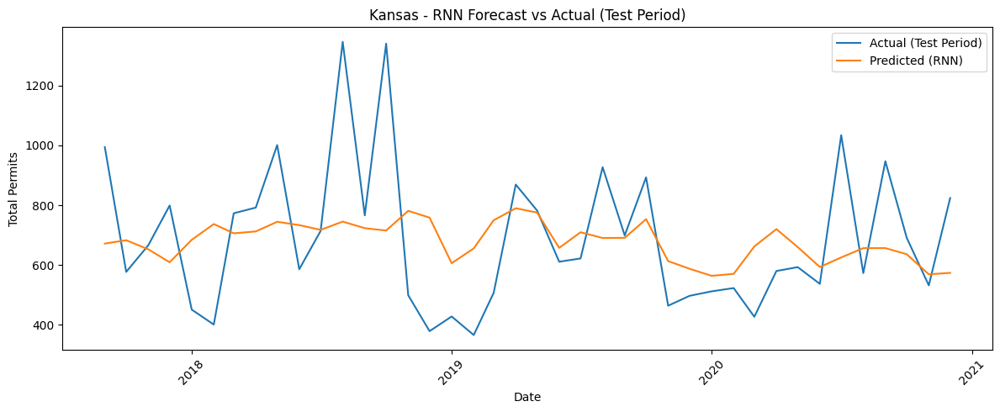


 RNN for Kentucky


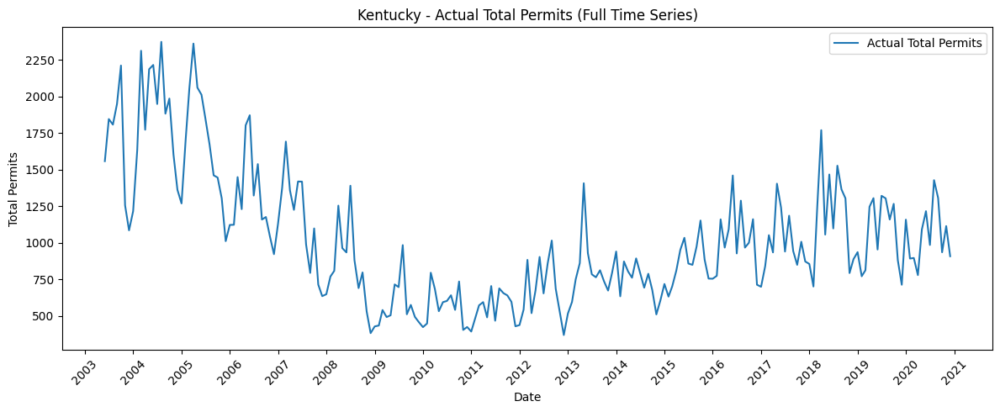

/usr/local/lib/python3.12/dist-packages/keras/src/layers/rnn/rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 435ms/step


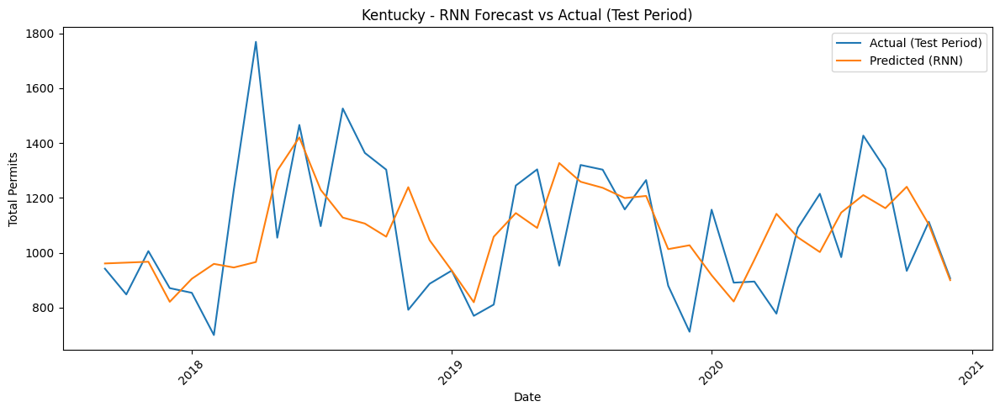


 RNN for Louisiana


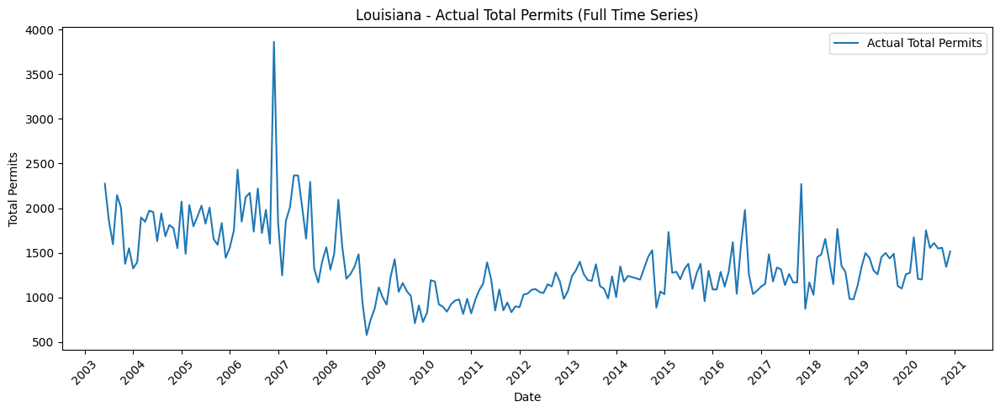

/usr/local/lib/python3.12/dist-packages/keras/src/layers/rnn/rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 335ms/step


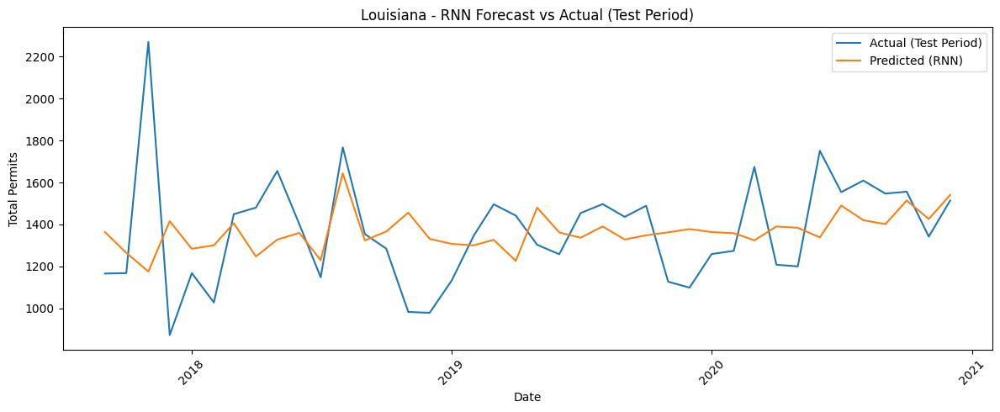


 RNN for Maine


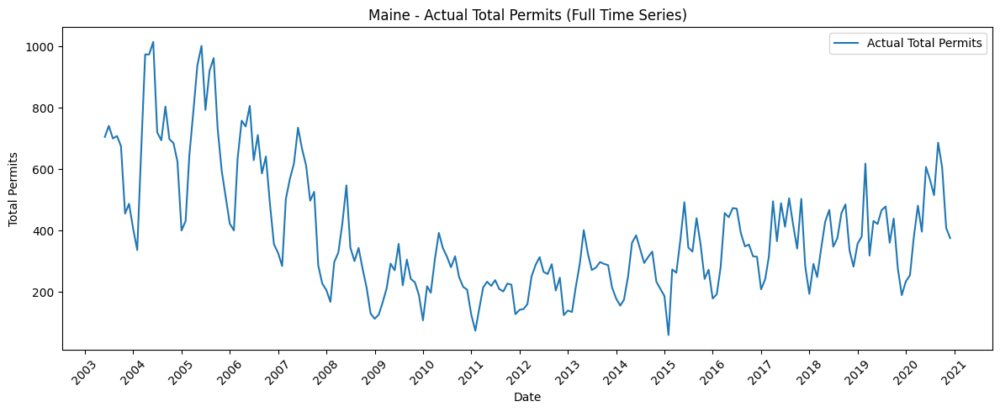

/usr/local/lib/python3.12/dist-packages/keras/src/layers/rnn/rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 319ms/step


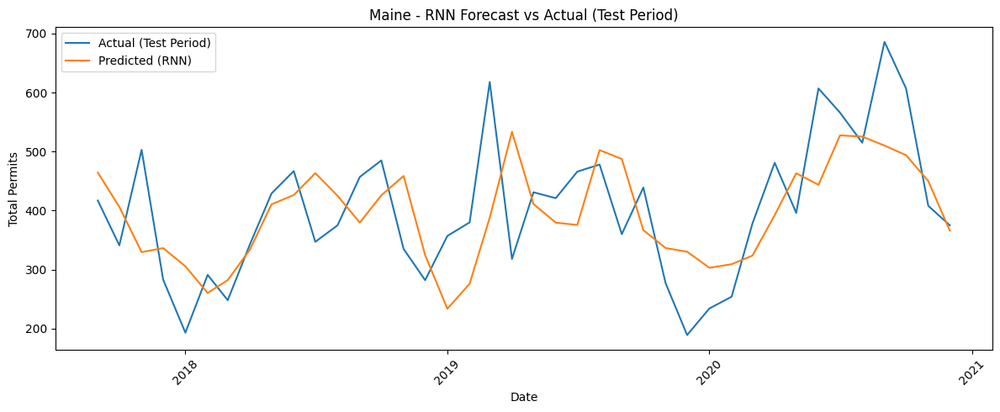


 RNN for Maryland


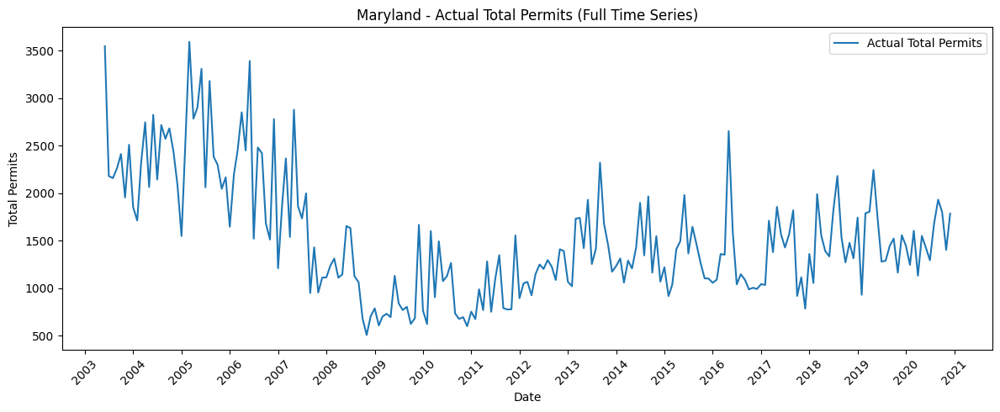

/usr/local/lib/python3.12/dist-packages/keras/src/layers/rnn/rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 307ms/step


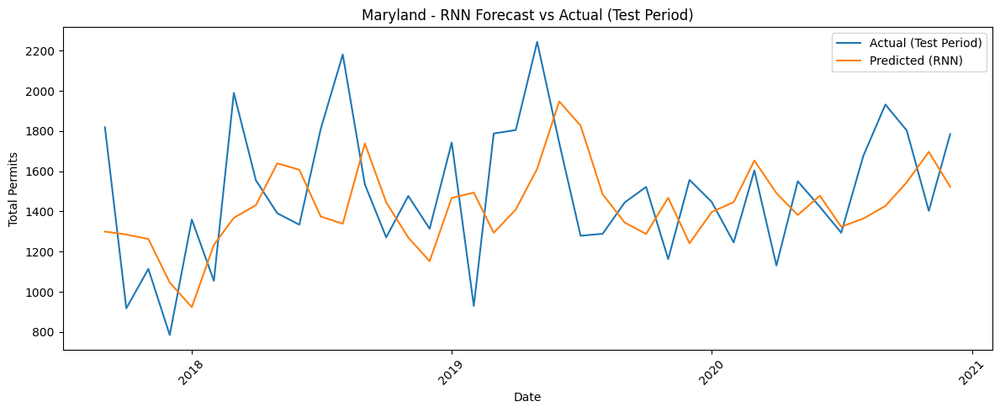


 RNN for Massachusetts


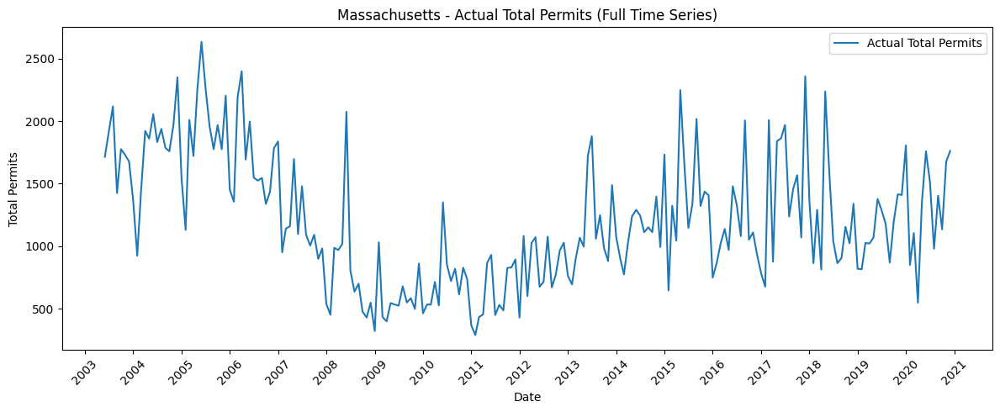

/usr/local/lib/python3.12/dist-packages/keras/src/layers/rnn/rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 322ms/step


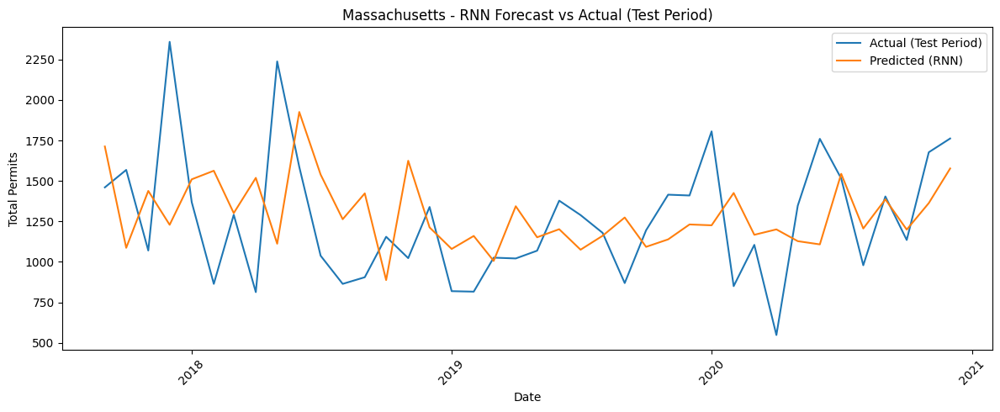


 RNN for Michigan


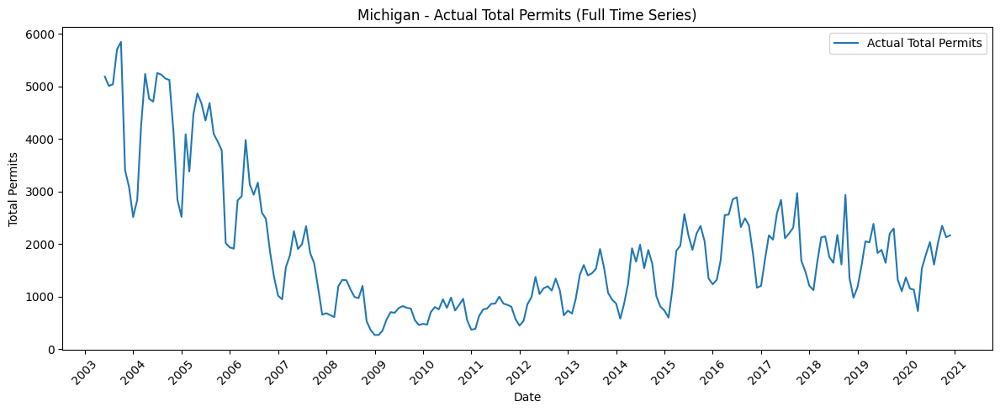

/usr/local/lib/python3.12/dist-packages/keras/src/layers/rnn/rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 470ms/step


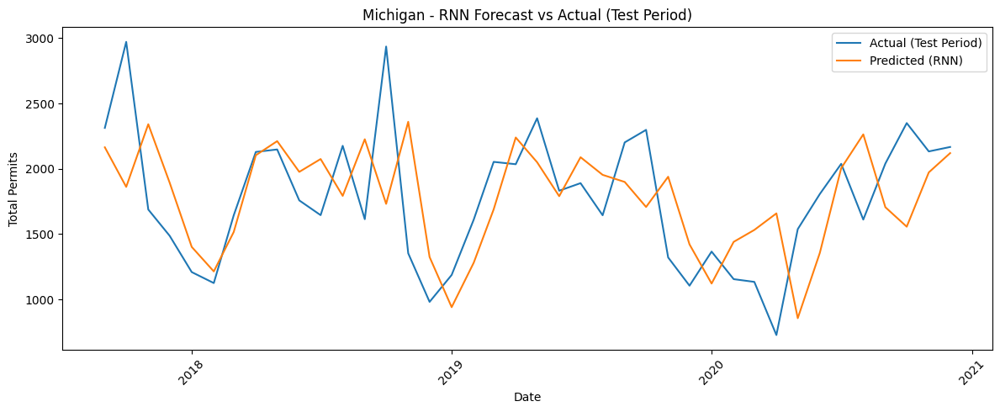


 RNN for Minnesota


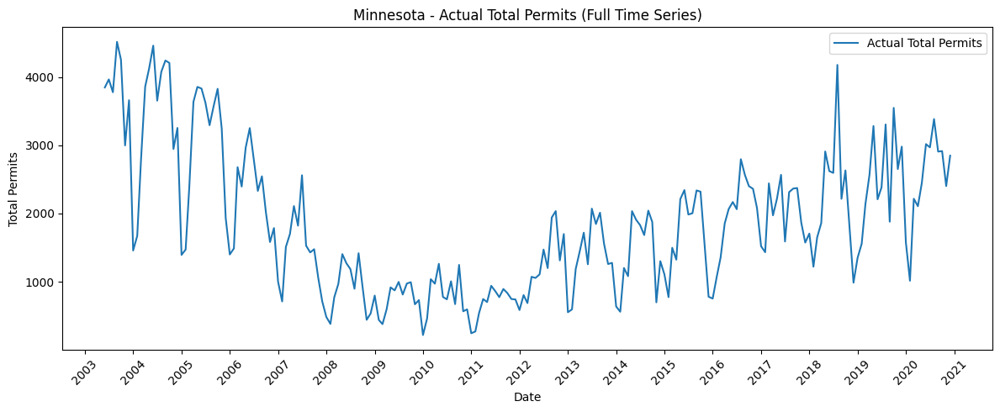

/usr/local/lib/python3.12/dist-packages/keras/src/layers/rnn/rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 337ms/step


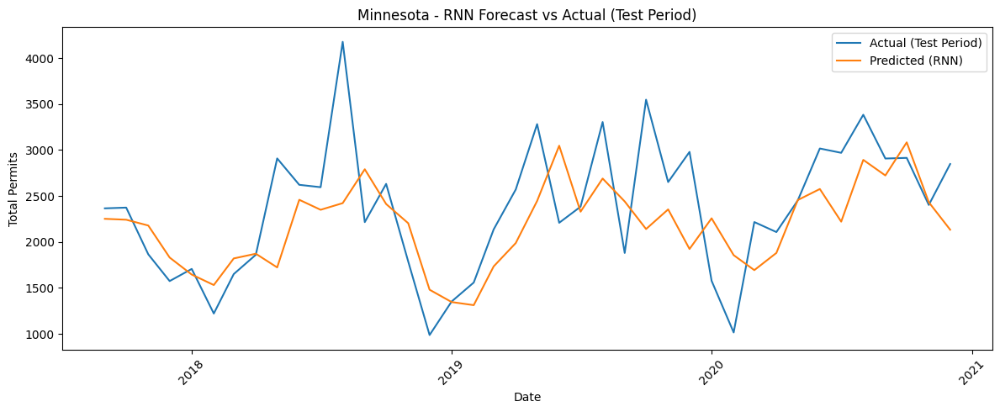


 RNN for Mississippi


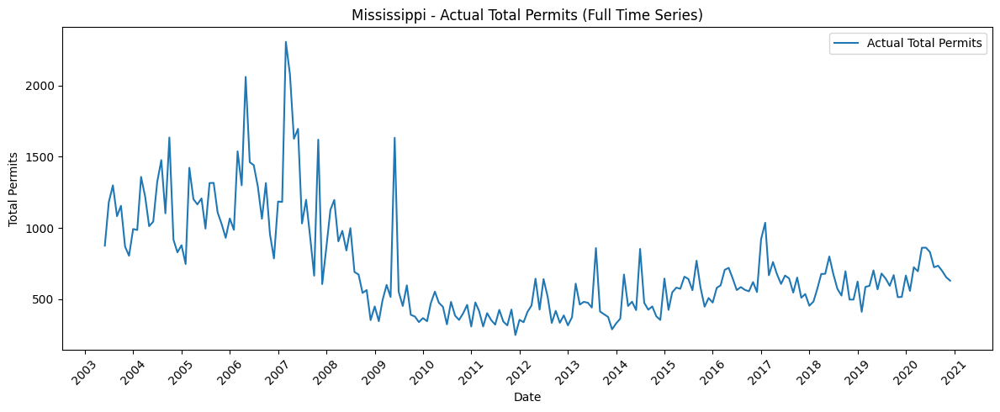

/usr/local/lib/python3.12/dist-packages/keras/src/layers/rnn/rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 337ms/step


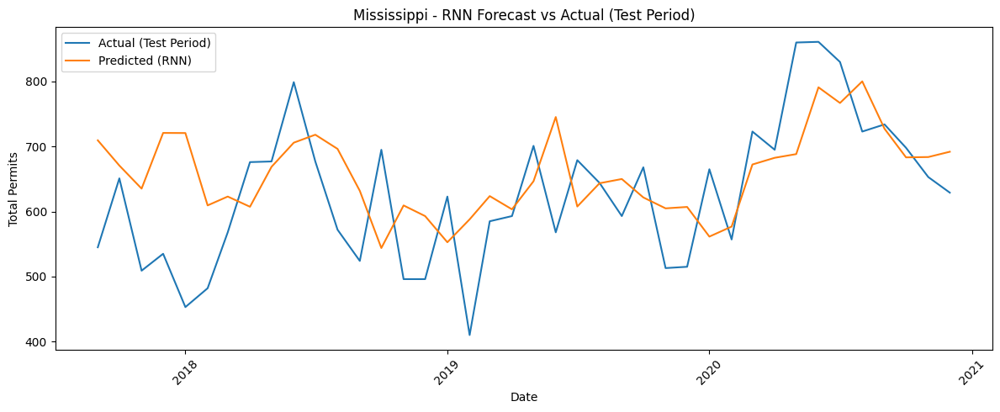


 RNN for Missouri


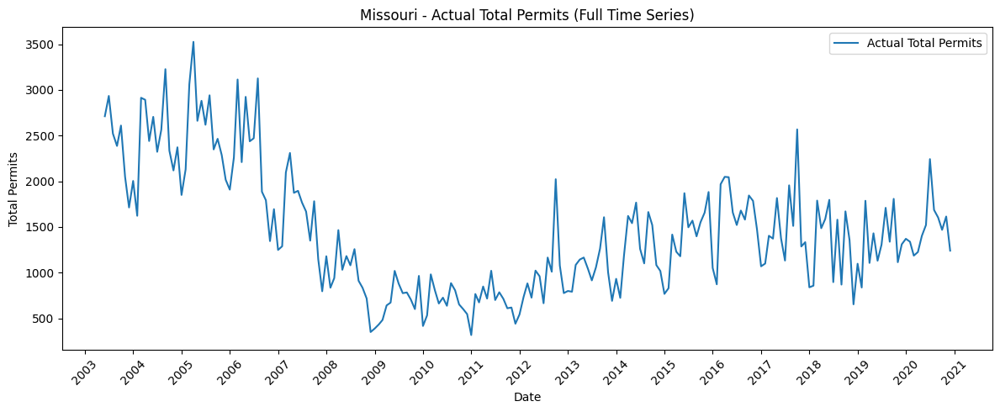

/usr/local/lib/python3.12/dist-packages/keras/src/layers/rnn/rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 332ms/step


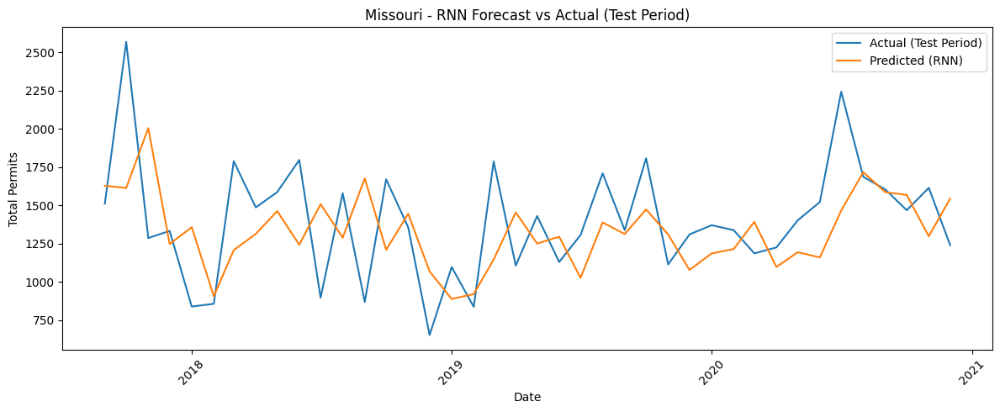


 RNN for Montana


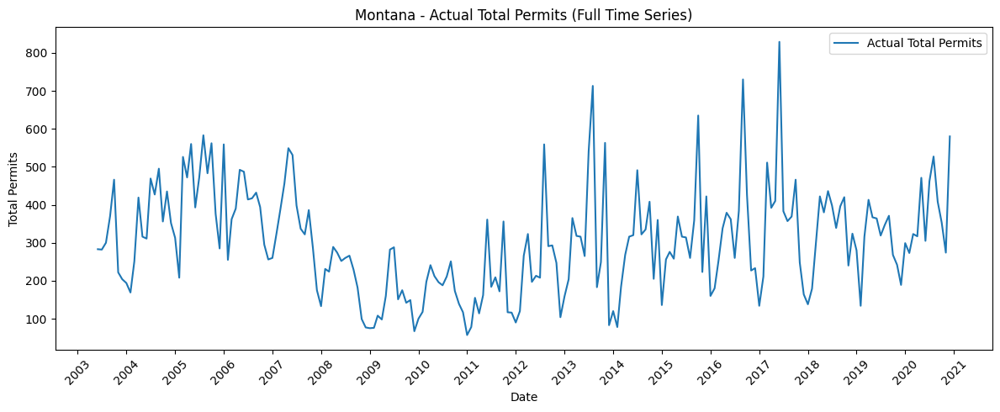

/usr/local/lib/python3.12/dist-packages/keras/src/layers/rnn/rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 316ms/step


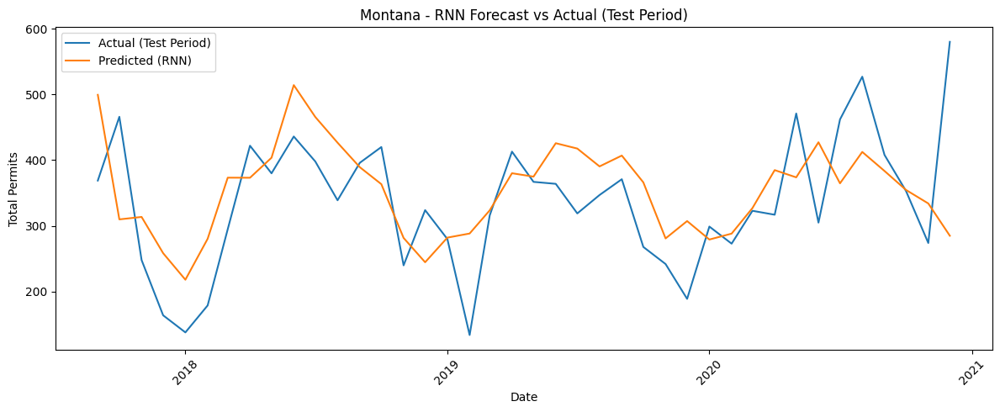


 RNN for Nebraska


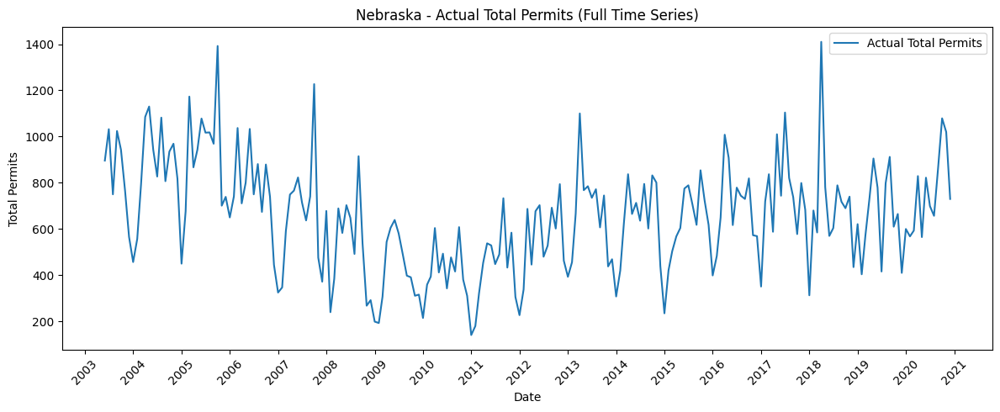

/usr/local/lib/python3.12/dist-packages/keras/src/layers/rnn/rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 324ms/step


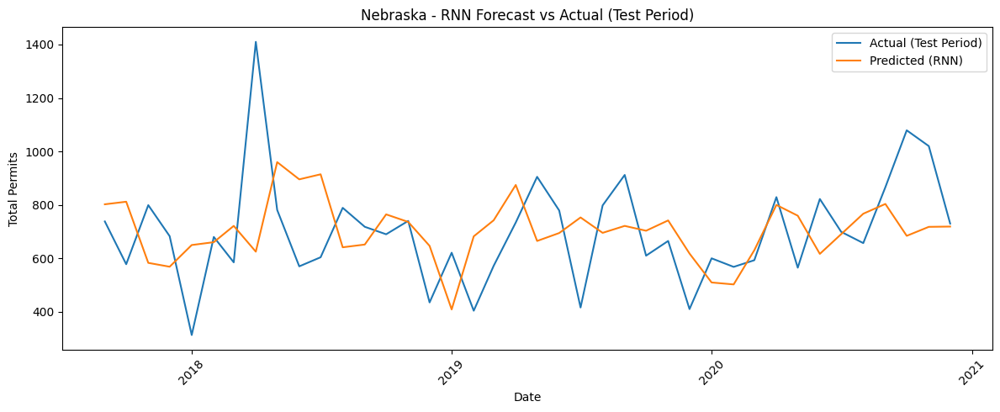


 RNN for Nevada


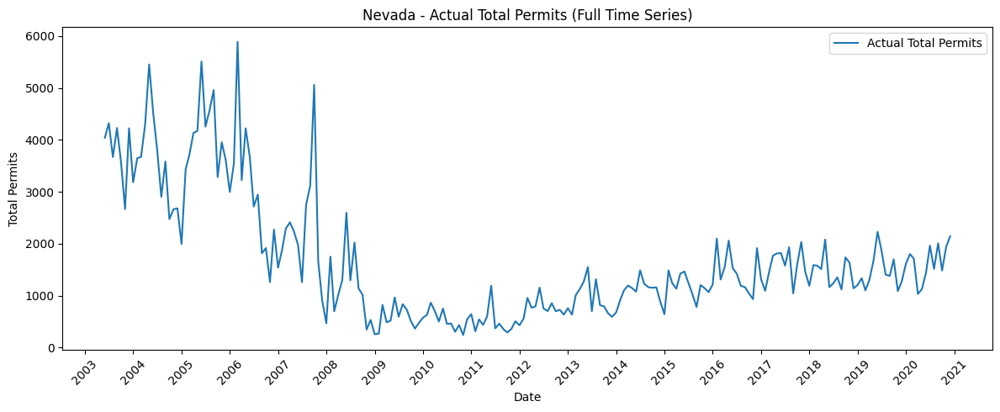

/usr/local/lib/python3.12/dist-packages/keras/src/layers/rnn/rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 320ms/step


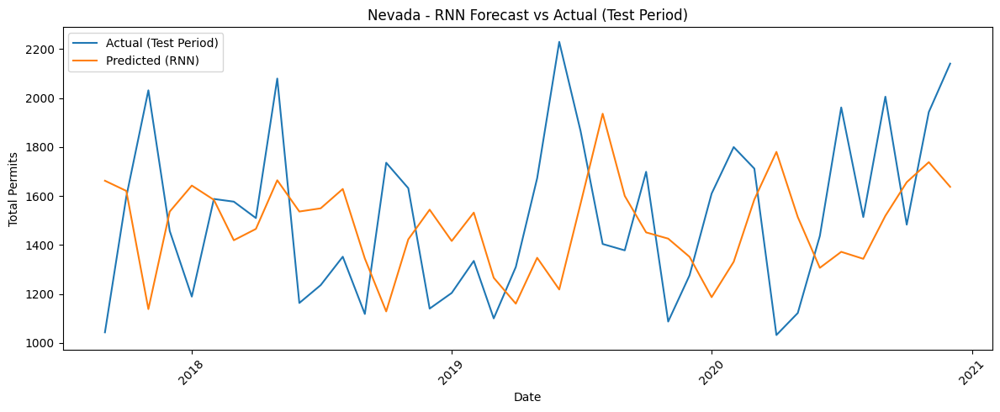


 RNN for New Hampshire


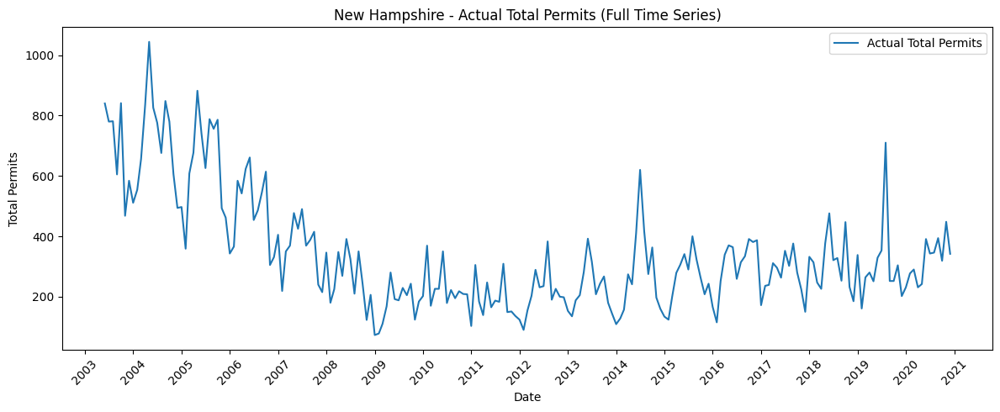

/usr/local/lib/python3.12/dist-packages/keras/src/layers/rnn/rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 366ms/step


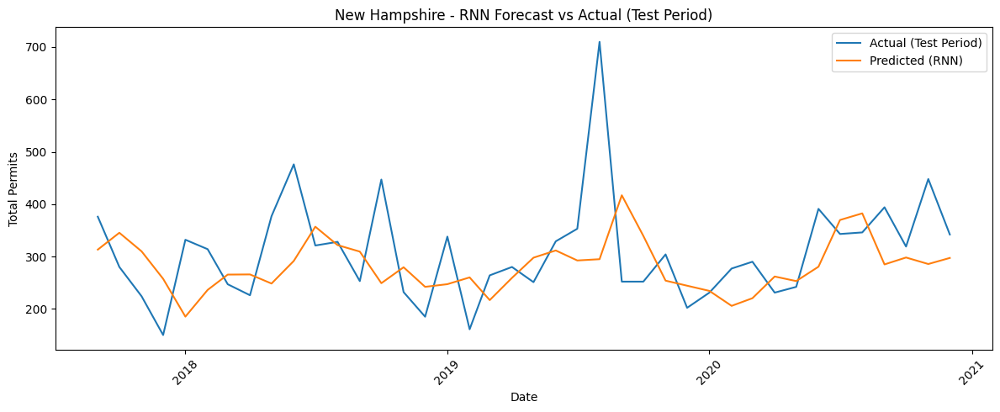


 RNN for New Jersey


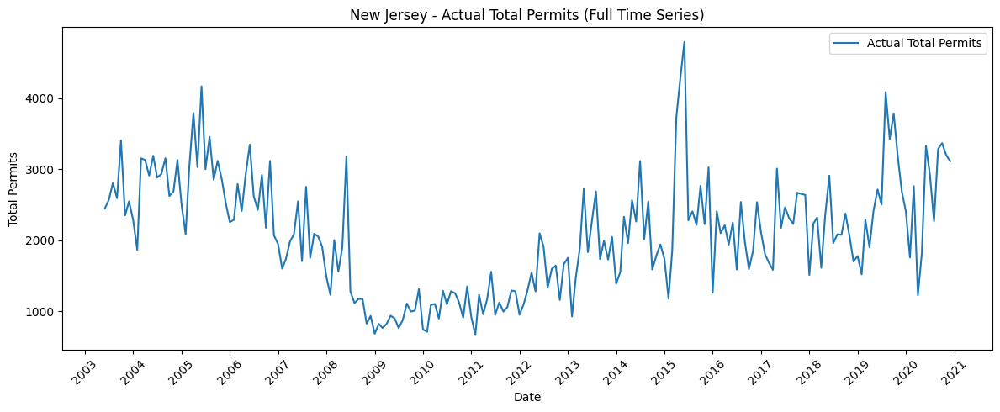

/usr/local/lib/python3.12/dist-packages/keras/src/layers/rnn/rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 334ms/step


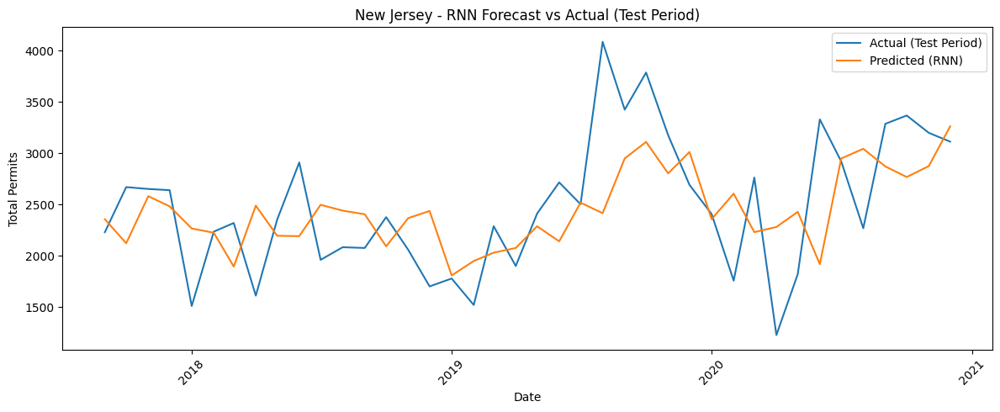


 RNN for New Mexico


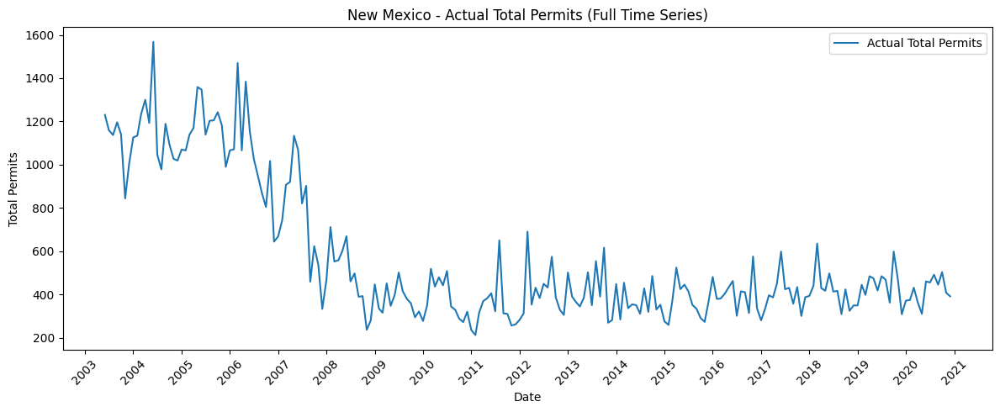

/usr/local/lib/python3.12/dist-packages/keras/src/layers/rnn/rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 332ms/step


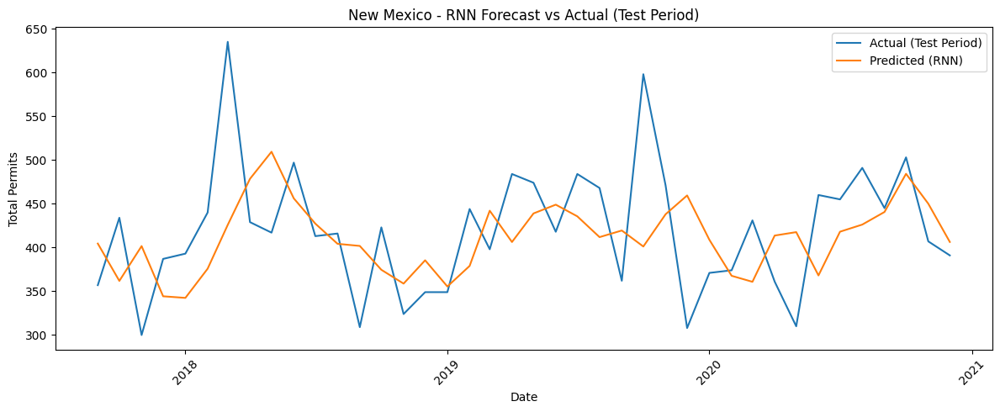


 RNN for New York


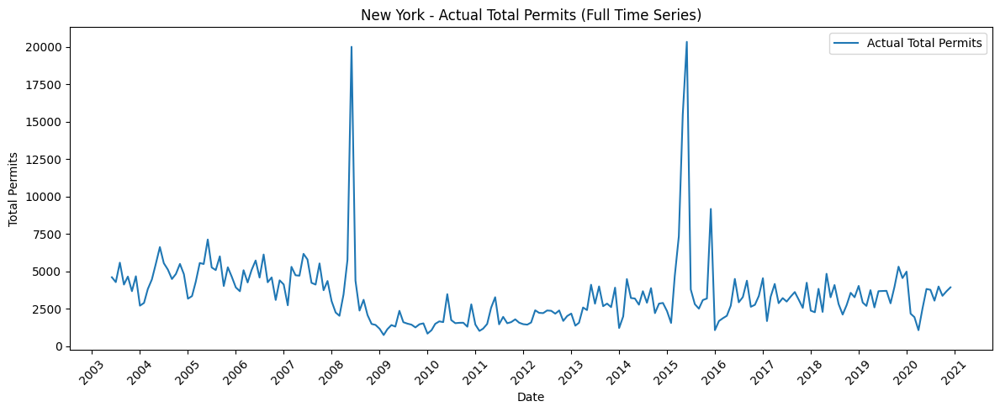

/usr/local/lib/python3.12/dist-packages/keras/src/layers/rnn/rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 376ms/step


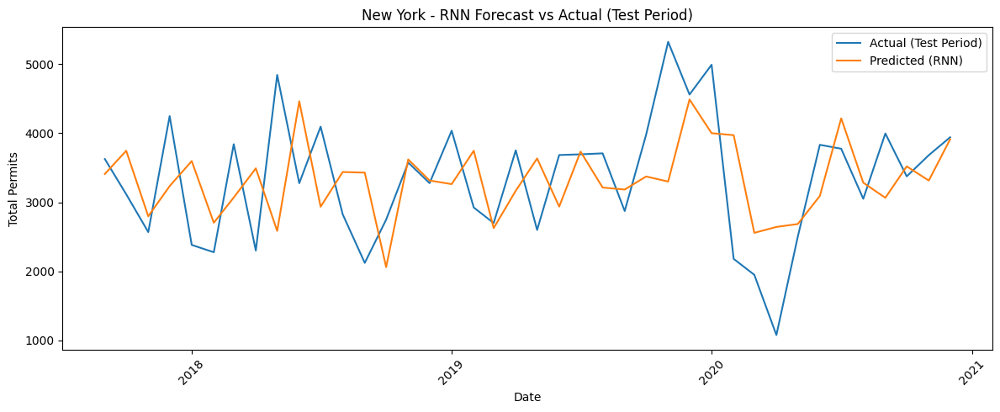


 RNN for North Carolina


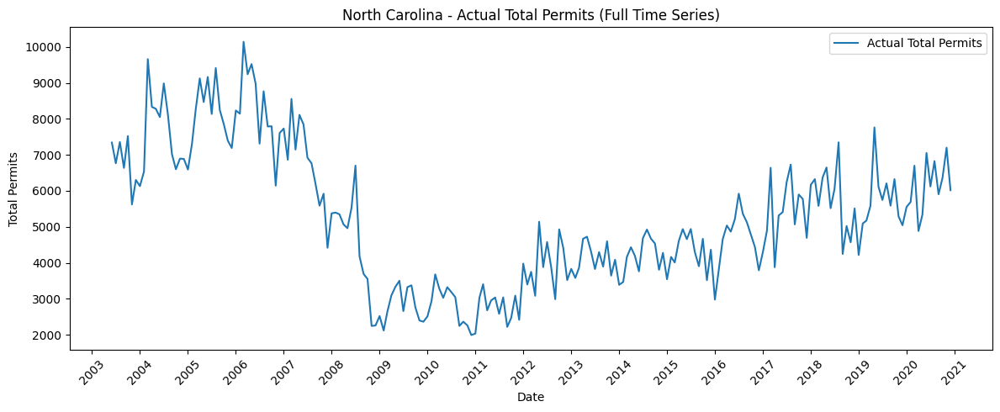

/usr/local/lib/python3.12/dist-packages/keras/src/layers/rnn/rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 328ms/step


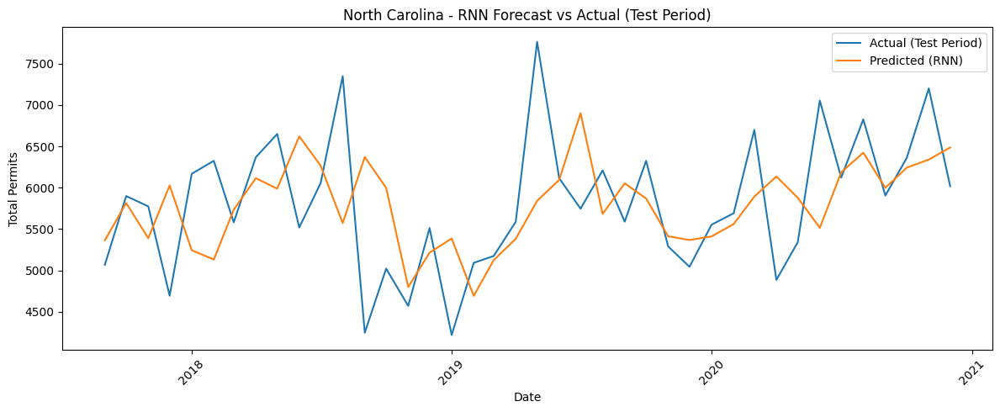


 RNN for North Dakota


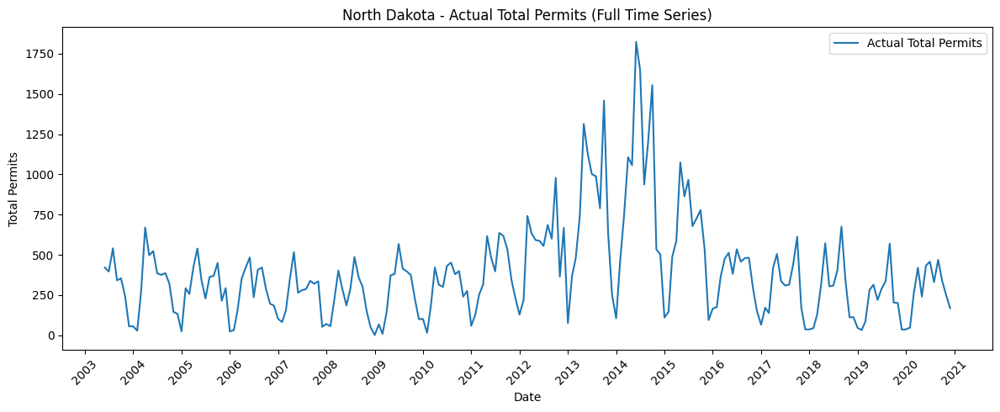

/usr/local/lib/python3.12/dist-packages/keras/src/layers/rnn/rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 452ms/step


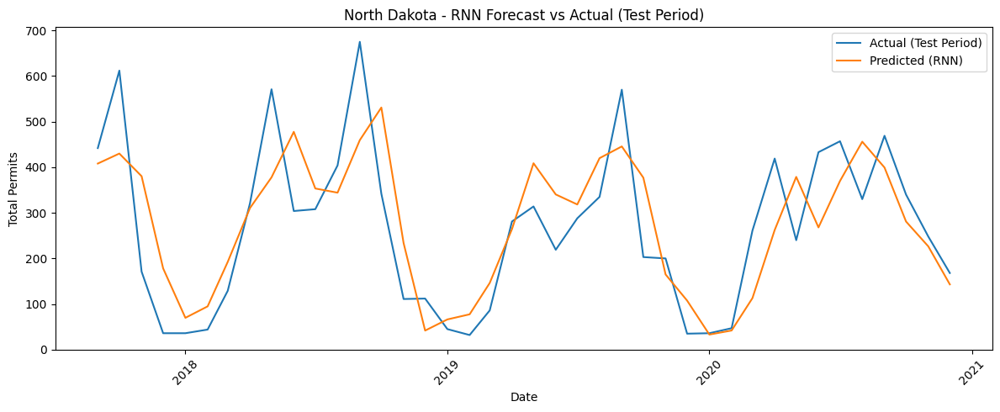


 RNN for Ohio


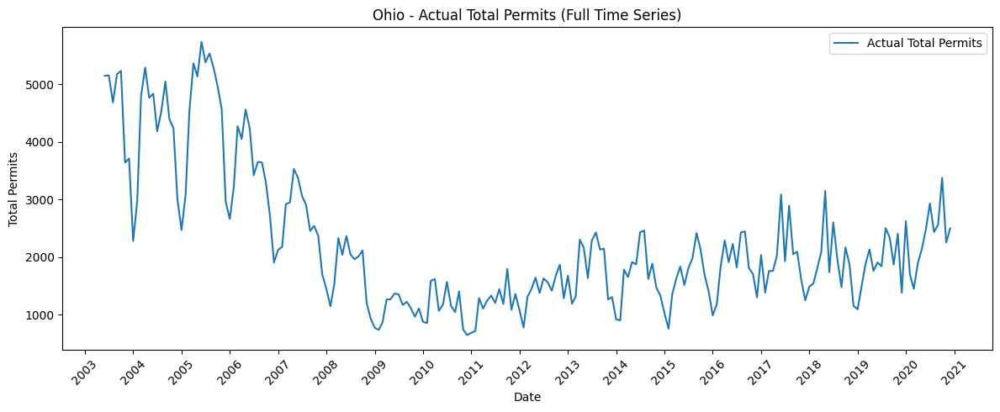

/usr/local/lib/python3.12/dist-packages/keras/src/layers/rnn/rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 343ms/step


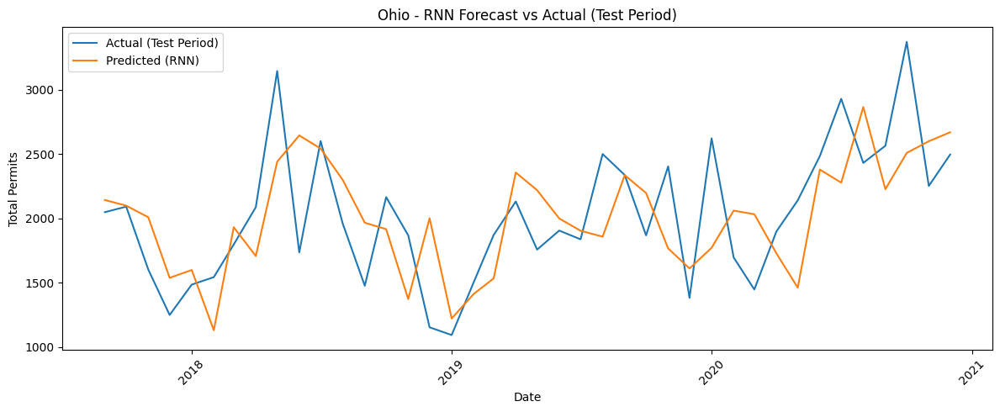


 RNN for Oklahoma


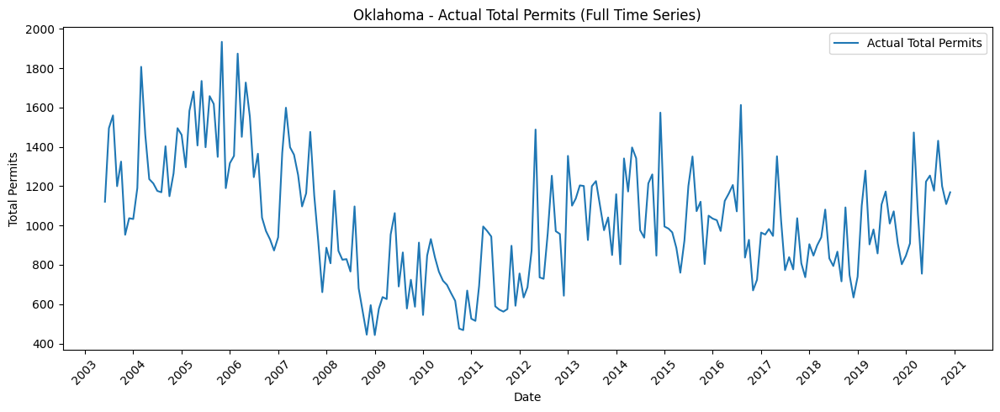

/usr/local/lib/python3.12/dist-packages/keras/src/layers/rnn/rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 328ms/step


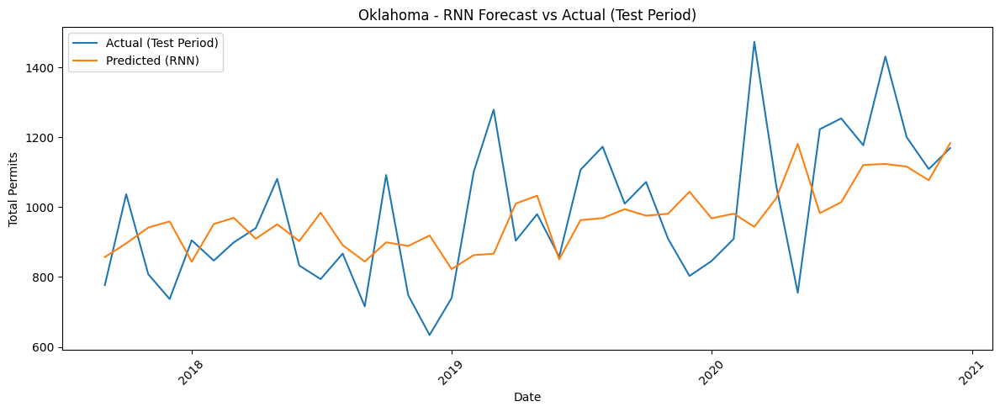


 RNN for Oregon


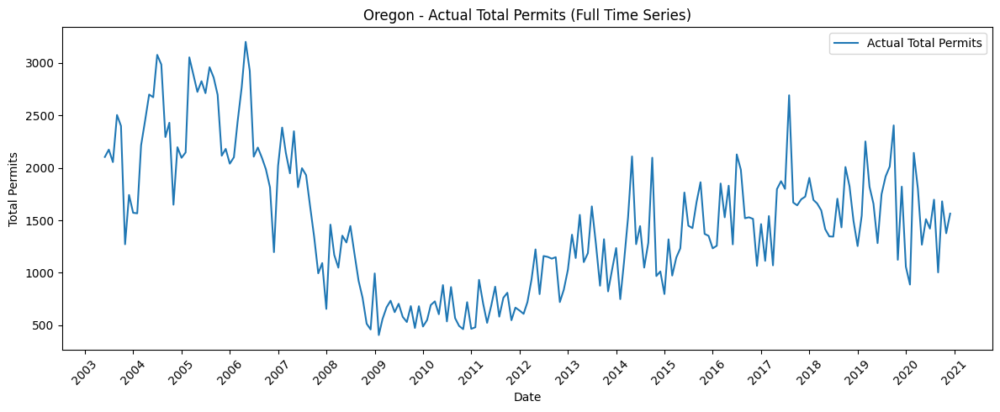

/usr/local/lib/python3.12/dist-packages/keras/src/layers/rnn/rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 325ms/step


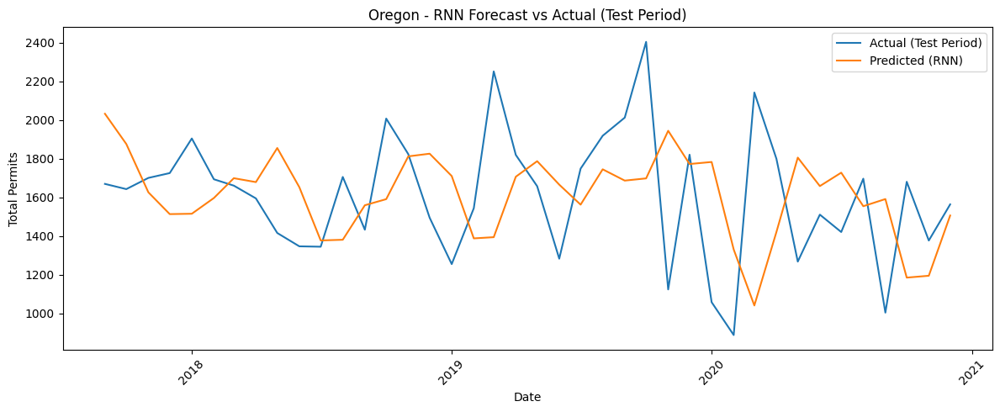


 RNN for Pennsylvania


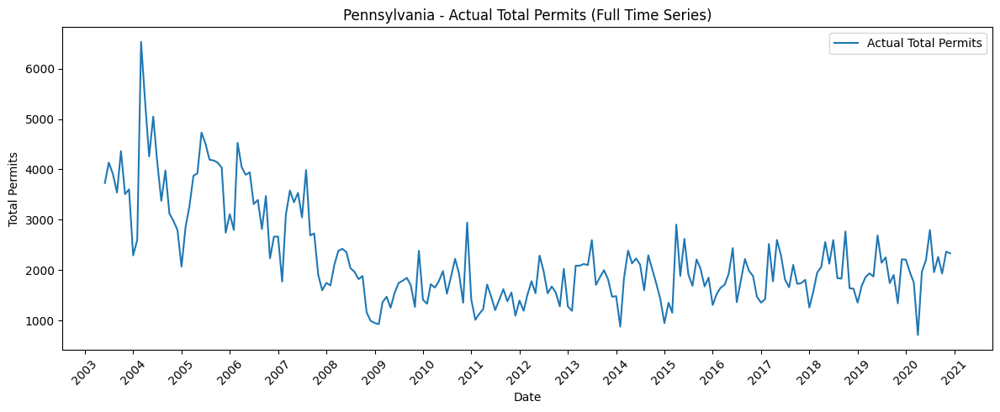

/usr/local/lib/python3.12/dist-packages/keras/src/layers/rnn/rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 345ms/step


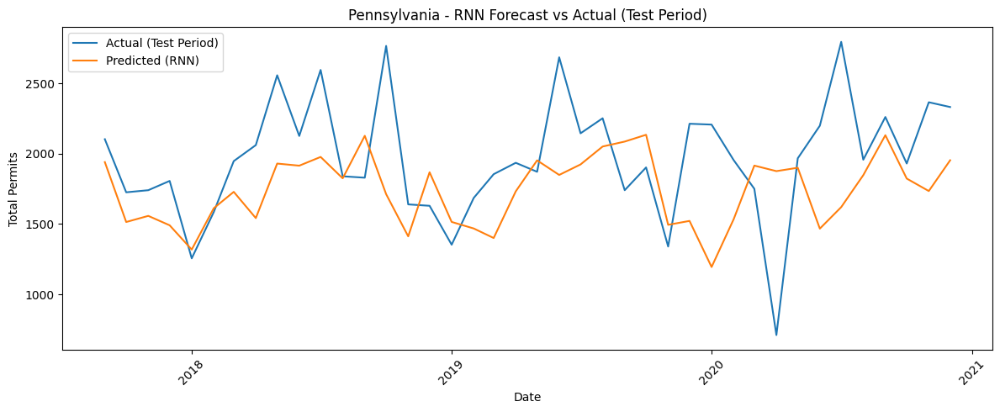


 RNN for Rhode Island


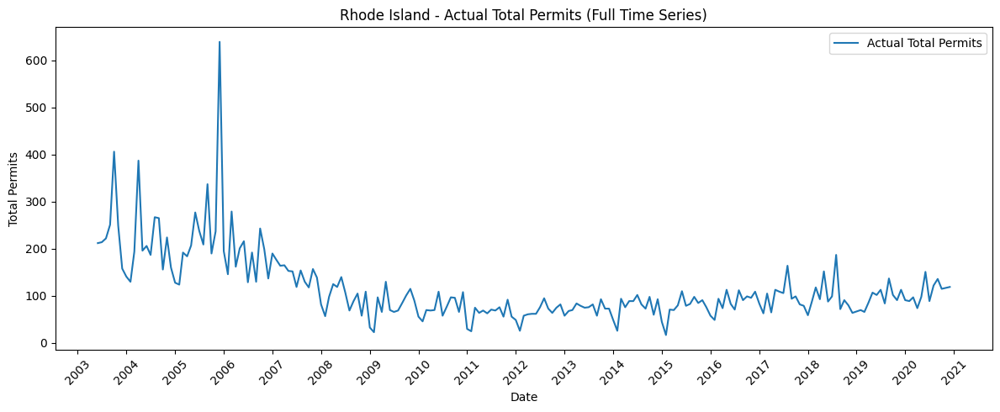

/usr/local/lib/python3.12/dist-packages/keras/src/layers/rnn/rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 474ms/step


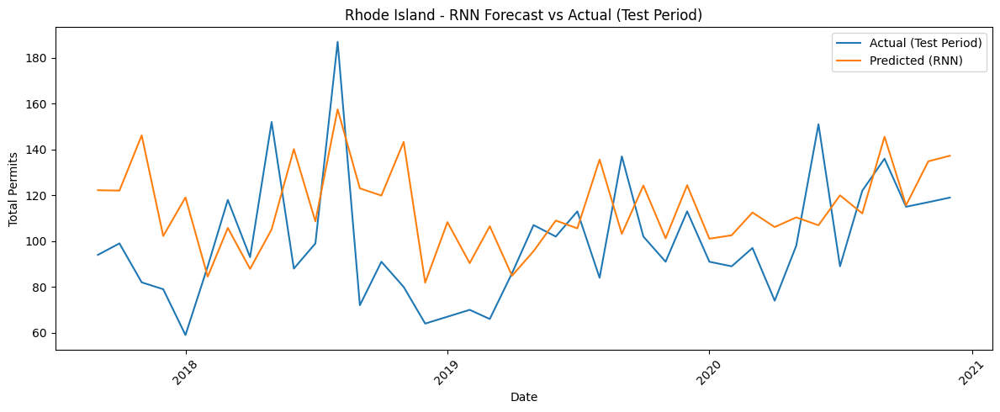


 RNN for South Carolina


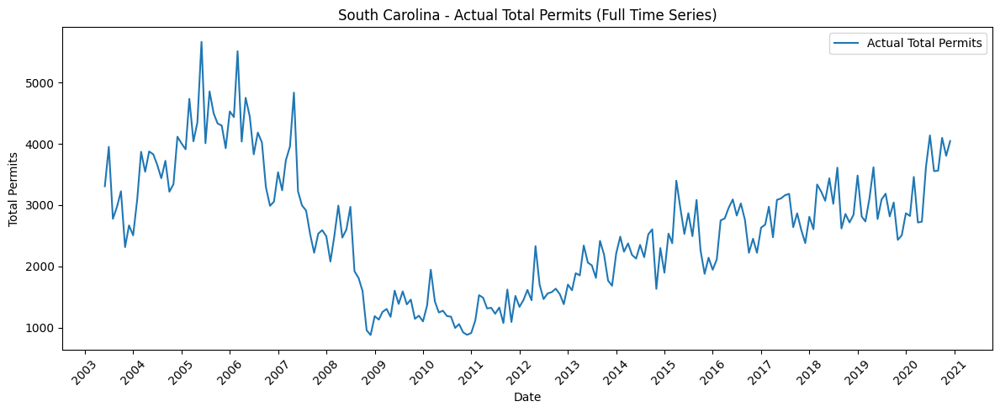

/usr/local/lib/python3.12/dist-packages/keras/src/layers/rnn/rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 346ms/step


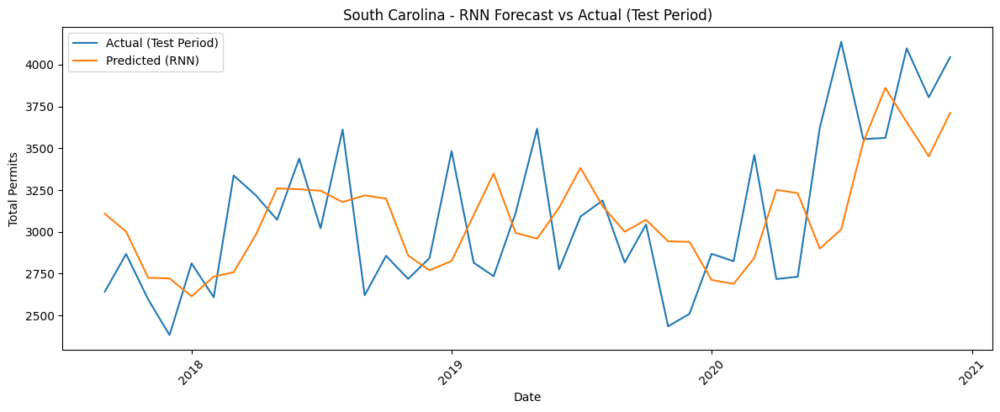


 RNN for South Dakota


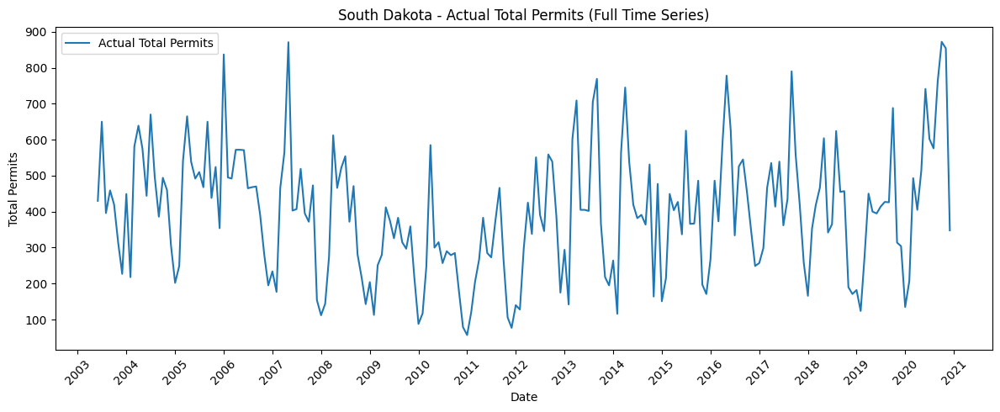

/usr/local/lib/python3.12/dist-packages/keras/src/layers/rnn/rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 364ms/step


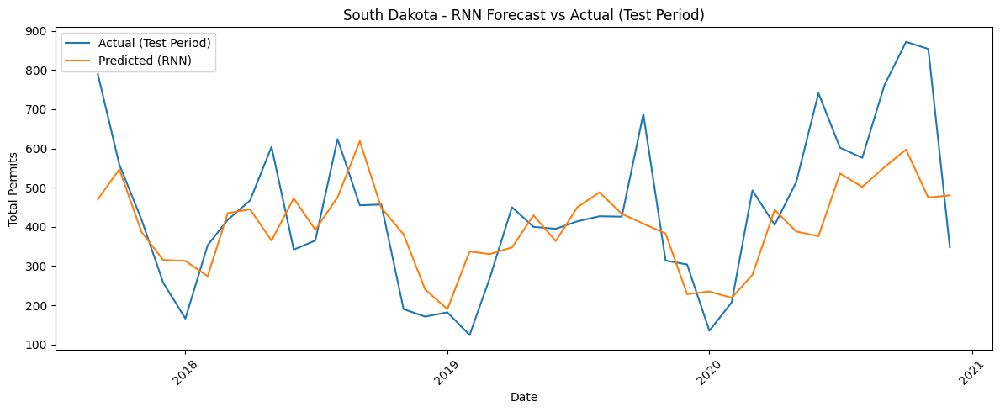


 RNN for Tennessee


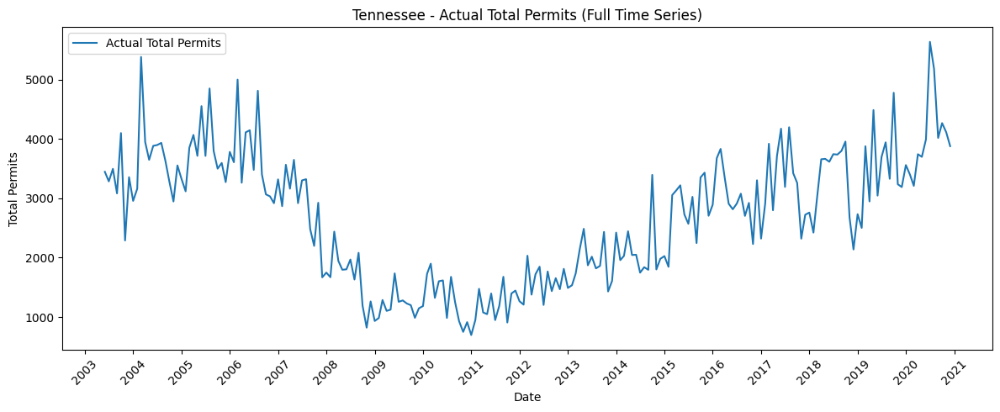

/usr/local/lib/python3.12/dist-packages/keras/src/layers/rnn/rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 350ms/step


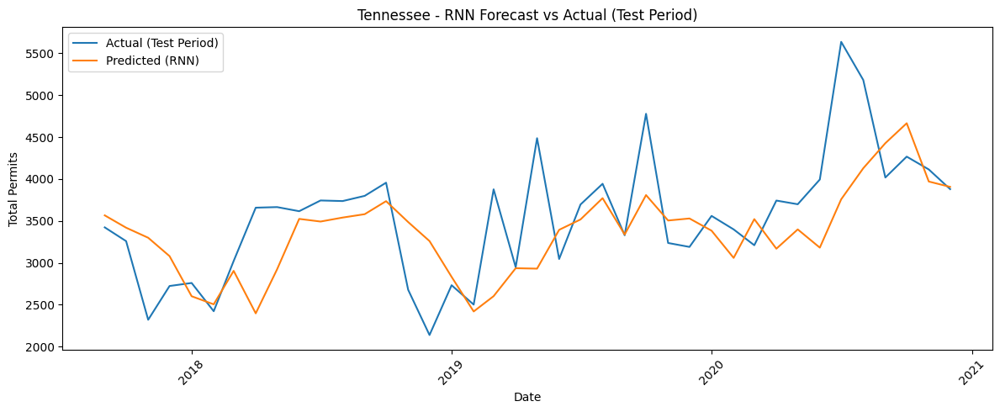


 RNN for Texas


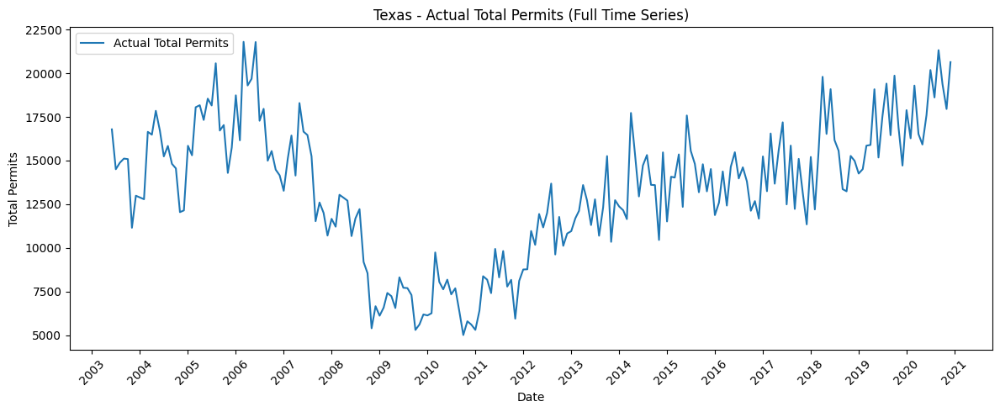

/usr/local/lib/python3.12/dist-packages/keras/src/layers/rnn/rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 360ms/step


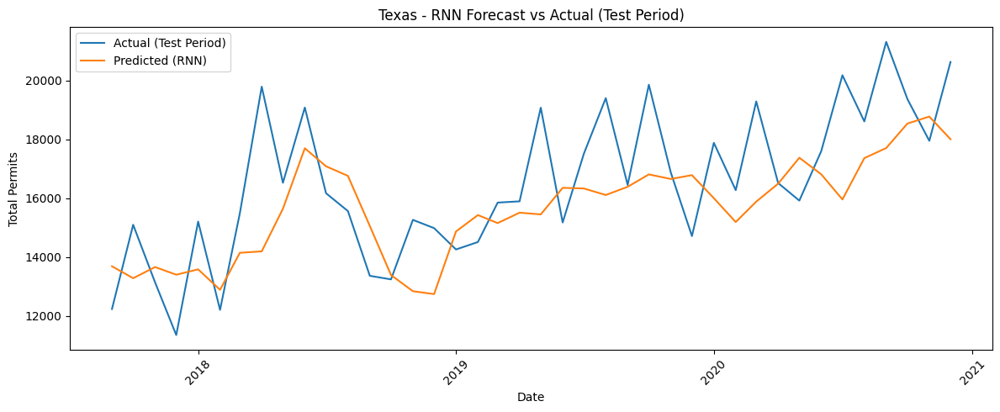


 RNN for Utah


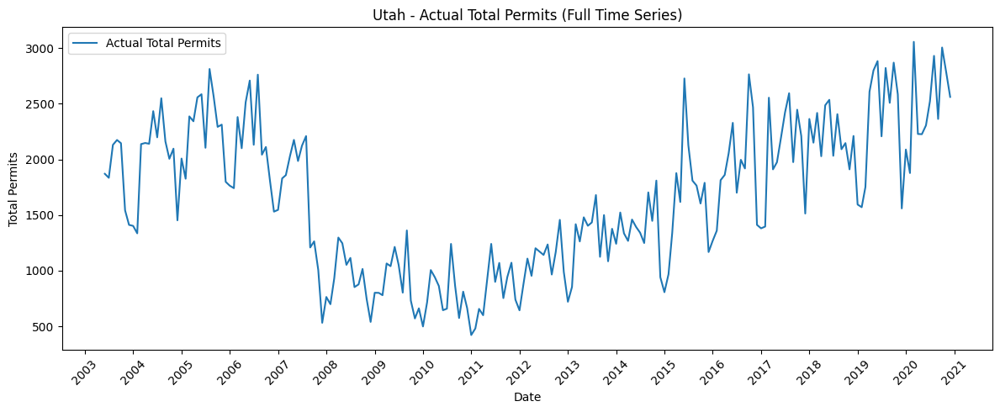

/usr/local/lib/python3.12/dist-packages/keras/src/layers/rnn/rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 339ms/step


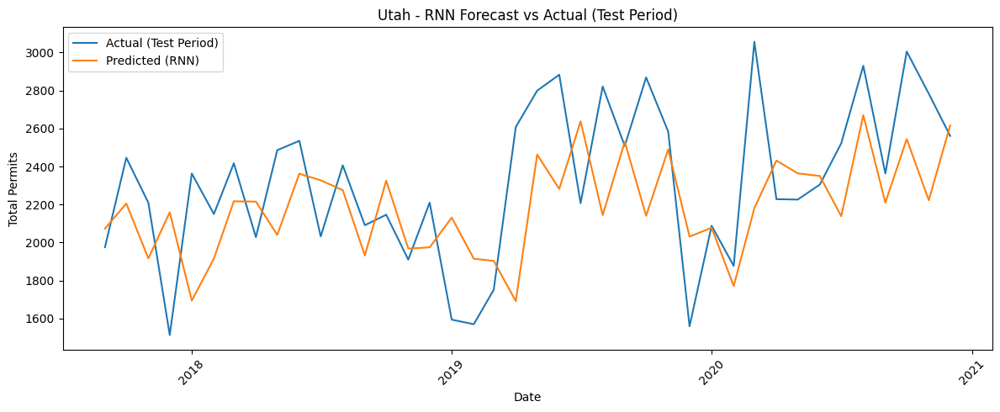


 RNN for Vermont


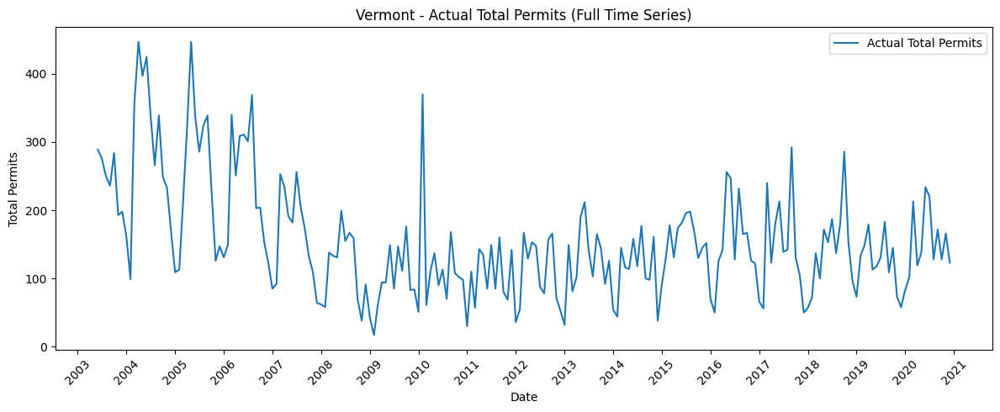

/usr/local/lib/python3.12/dist-packages/keras/src/layers/rnn/rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 335ms/step


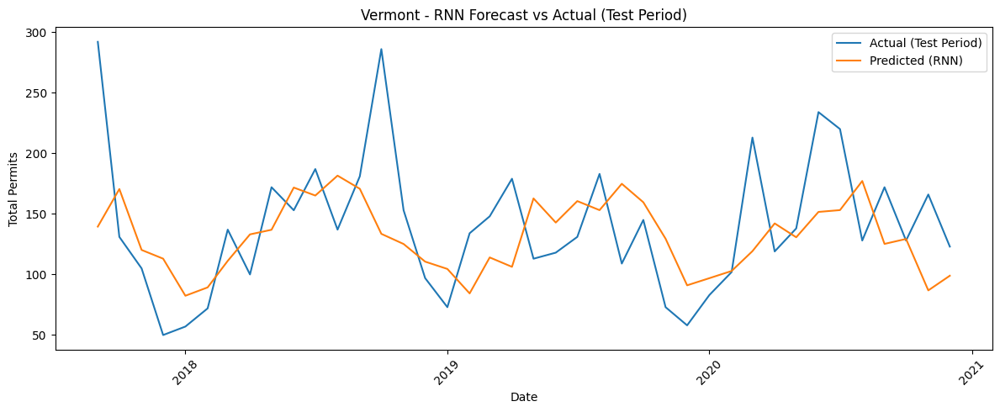


 RNN for Virginia


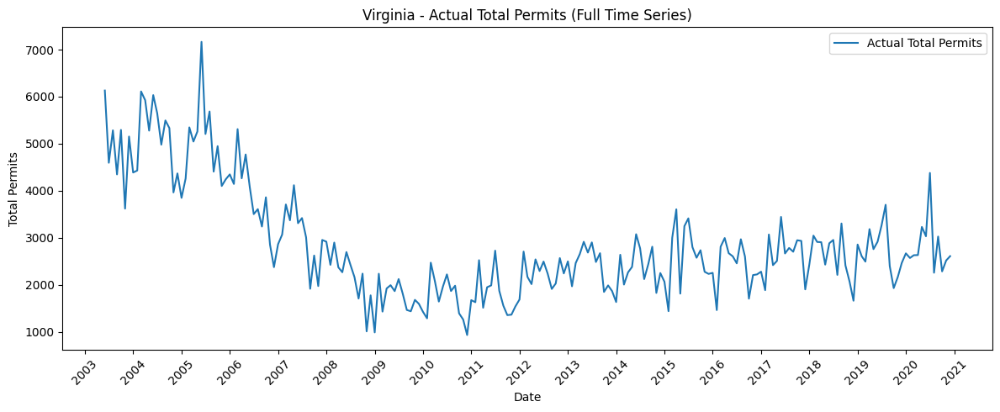

/usr/local/lib/python3.12/dist-packages/keras/src/layers/rnn/rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 331ms/step


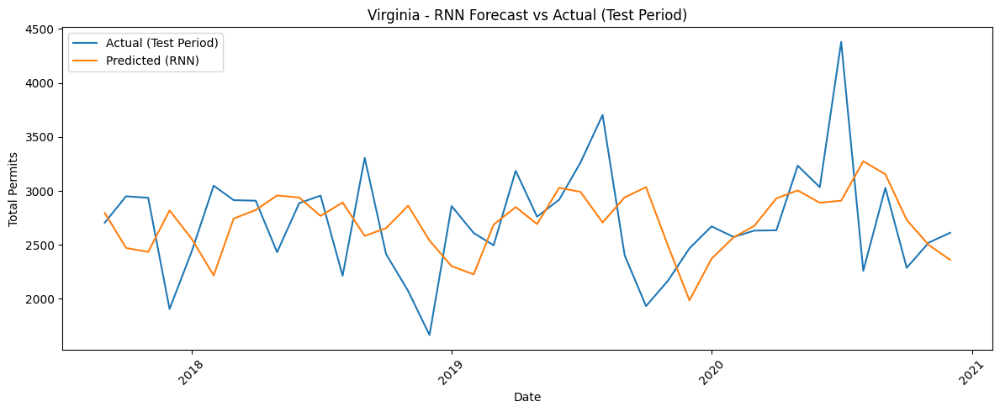


 RNN for Washington


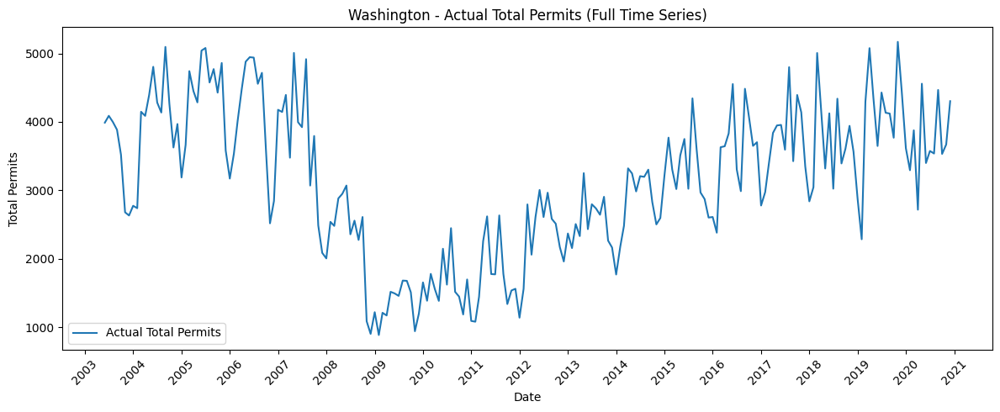

/usr/local/lib/python3.12/dist-packages/keras/src/layers/rnn/rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 373ms/step


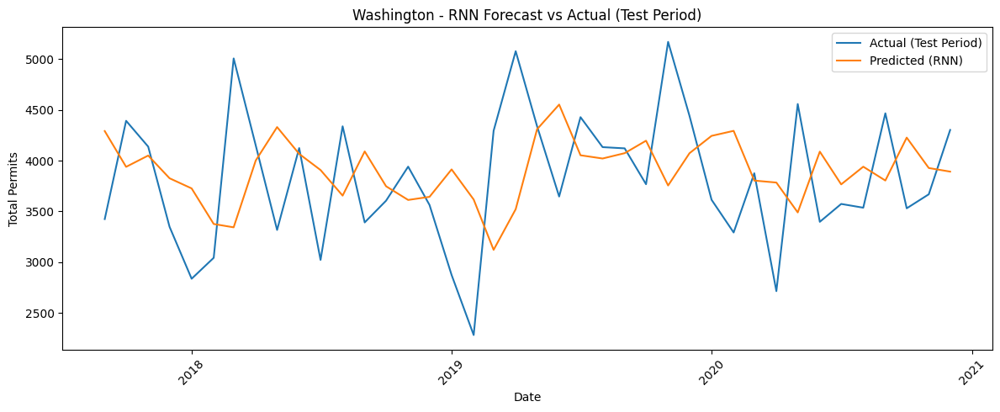


 RNN for West Virginia


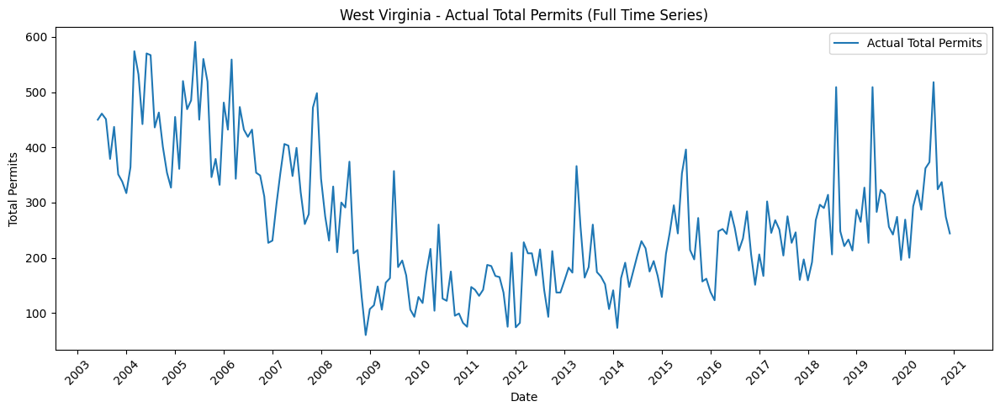

/usr/local/lib/python3.12/dist-packages/keras/src/layers/rnn/rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 339ms/step


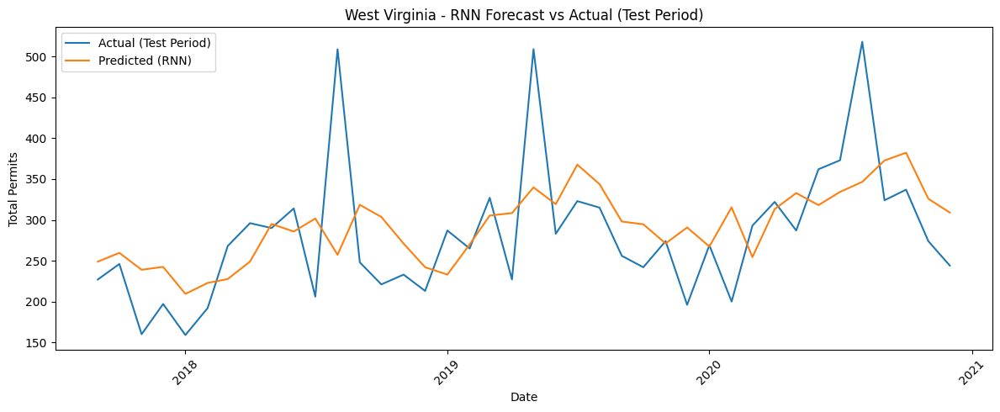


 RNN for Wisconsin


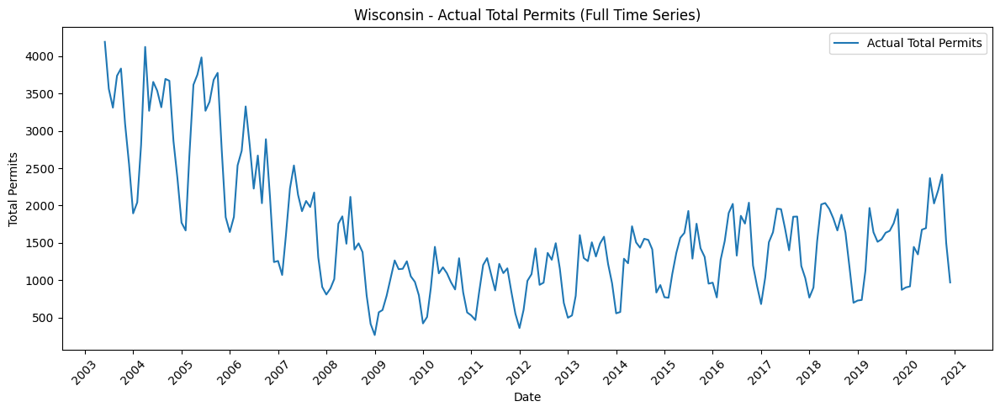

/usr/local/lib/python3.12/dist-packages/keras/src/layers/rnn/rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 342ms/step


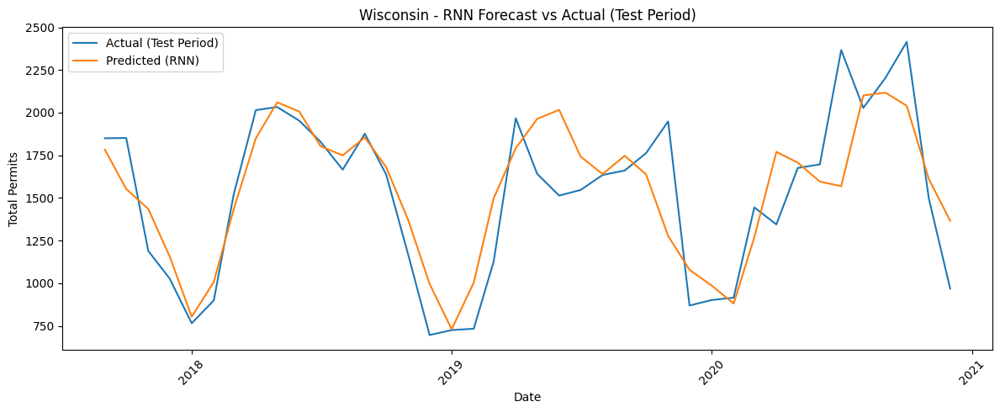


 RNN for Wyoming


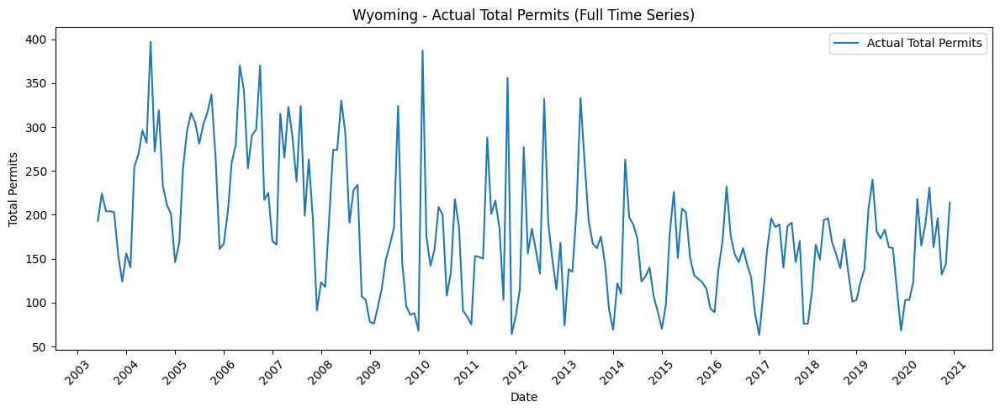

/usr/local/lib/python3.12/dist-packages/keras/src/layers/rnn/rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 336ms/step


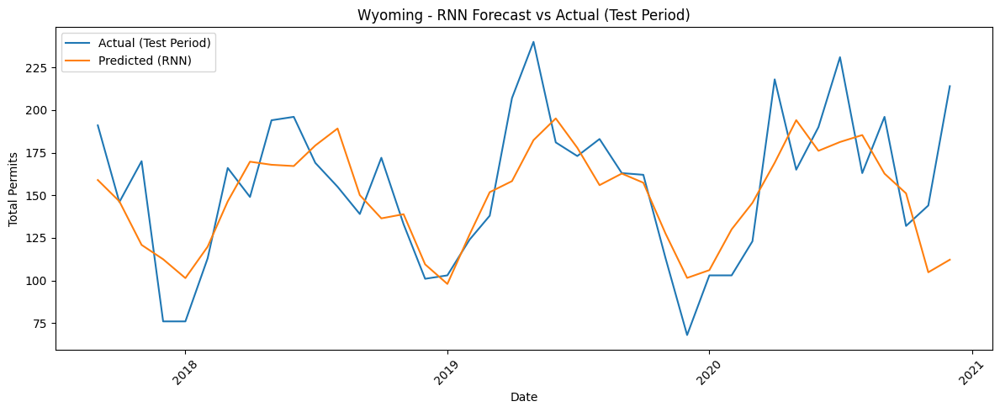

                   state     rmse_rnn
0                Alabama   231.718544
1                 Alaska    31.812202
2                Arizona   845.702664
3               Arkansas   293.251253
4             California  1768.844548
5               Colorado   673.425561
6            Connecticut   165.650535
7               Delaware   148.688447
8   District of Columbia   394.961494
9                Florida  1703.146456
10               Georgia   958.648859
11                Hawaii   184.007952
12                 Idaho   215.742211
13              Illinois   534.689668
14               Indiana   346.243922
15                  Iowa   266.375171
16                Kansas   229.280874
17              Kentucky   235.870250
18             Louisiana   271.961612
19                 Maine    97.110681
20              Maryland   350.220384
21         Massachusetts   437.129254
22              Michigan   494.960153
23             Minnesota   603.983217
24           Mississippi   102.414930
25          

In [9]:
import pandas as pd
import numpy as np
!pip install tensorflow
import tensorflow as tf
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import mean_squared_error
import matplotlib.pyplot as plt
import matplotlib.dates as mdates


# Parameters
n_steps = 12


def create_sequences(data, n_steps=12):
    """
    Converts a 1D array into sequences of length n_steps for RNNs.
    """
    X, y = [], []
    for i in range(len(data) - n_steps):
        X.append(data[i:i+n_steps])
        y.append(data[i+n_steps])
    return np.array(X), np.array(y)


states = df_state_monthly['Name'].unique()
results = []

for state in states:
    print(f"\n RNN for {state}")

    state_data = df_state_monthly[df_state_monthly['Name'] == state].sort_values('Period.full').copy()
    state_data['Period.full'] = pd.to_datetime(state_data['Period.full'])

    # Plot full actual permits time series
    plt.figure(figsize=(12, 5))
    plt.plot(state_data['Period.full'], state_data['total_permits'], label='Actual Total Permits')
    plt.title(f'{state} - Actual Total Permits (Full Time Series)')
    plt.xlabel('Date')
    plt.ylabel('Total Permits')
    plt.legend()
    plt.gca().xaxis.set_major_locator(mdates.YearLocator())
    plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%Y'))
    plt.xticks(rotation=45)
    plt.tight_layout()
    plt.show()

    values = state_data['total_permits'].values.reshape(-1, 1)

    scaler = MinMaxScaler()
    scaled = scaler.fit_transform(values)

    X, y = create_sequences(scaled, n_steps)
    X = X.reshape((X.shape[0], X.shape[1], 1))

    split = int(len(X) * 0.8)
    X_train, X_test = X[:split], X[split:]
    y_train, y_test = y[:split], y[split:]

    model = tf.keras.Sequential([
        tf.keras.layers.SimpleRNN(64, activation='tanh', input_shape=(n_steps, 1)),
        tf.keras.layers.Dense(1)
    ])
    model.compile(optimizer='adam', loss='mse')

    model.fit(X_train, y_train, epochs=20, batch_size=16, verbose=0)

    y_pred = model.predict(X_test)
    y_pred_inv = scaler.inverse_transform(y_pred)
    y_test_inv = scaler.inverse_transform(y_test.reshape(-1, 1))

    rmse = np.sqrt(mean_squared_error(y_test_inv, y_pred_inv))
    results.append({'state': state, 'rmse_rnn': rmse})

    # Get dates for test set predictions (offset by n_steps)
    test_dates = state_data['Period.full'].values[split + n_steps:]
    test_dates = pd.to_datetime(test_dates)

    # Plot predicted vs actual for test period
    plt.figure(figsize=(12, 5))
    plt.plot(test_dates, y_test_inv, label='Actual (Test Period)')
    plt.plot(test_dates, y_pred_inv, label='Predicted (RNN)')
    plt.title(f'{state} - RNN Forecast vs Actual (Test Period)')
    plt.xlabel('Date')
    plt.ylabel('Total Permits')
    plt.legend()
    plt.gca().xaxis.set_major_locator(mdates.YearLocator())
    plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%Y'))
    plt.xticks(rotation=45)
    plt.tight_layout()
    plt.show()

results_df = pd.DataFrame(results)
print(results_df)


Top 3 states with lowest RMSE:
           state   rmse_rnn
39  Rhode Island  30.591255
50       Wyoming  31.549135
1         Alaska  31.812202

Top 3 states with highest RMSE:
         state     rmse_rnn
43       Texas  2043.790452
4   California  1768.844548
9      Florida  1703.146456

Average RMSE: 436.76
Median RMSE: 346.24


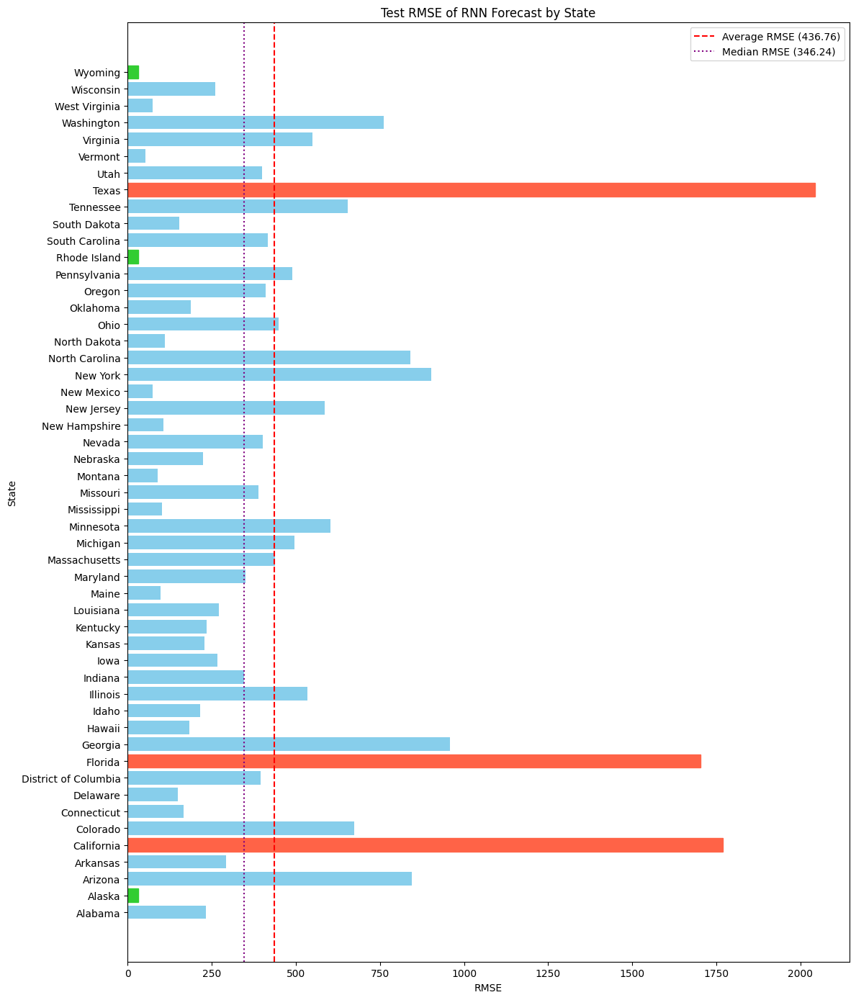

In [10]:
import pandas as pd
import matplotlib.pyplot as plt

# Assuming results_df is already defined, replace this with your actual DataFrame
# Example:
# results_df = pd.DataFrame(results)

# Top 3 lowest RMSEs
top3_lowest = results_df.nsmallest(3, 'rmse_rnn')
print("Top 3 states with lowest RMSE:")
print(top3_lowest)

# Top 3 highest RMSEs
top3_highest = results_df.nlargest(3, 'rmse_rnn')
print("\nTop 3 states with highest RMSE:")
print(top3_highest)

# Average and median RMSE
average_rmse = results_df['rmse_rnn'].mean()
median_rmse = results_df['rmse_rnn'].median()
print(f"\nAverage RMSE: {average_rmse:.2f}")
print(f"Median RMSE: {median_rmse:.2f}")

# Plot RMSE by State
plt.figure(figsize=(12, 14))  # Wider and much taller
bars = plt.barh(results_df['state'], results_df['rmse_rnn'], color='skyblue')
for bar, state in zip(bars, results_df['state']):
    if state in top3_lowest['state'].values:
        bar.set_color('limegreen')
    if state in top3_highest['state'].values:
        bar.set_color('tomato')

plt.axvline(average_rmse, color='red', linestyle='--', label=f'Average RMSE ({average_rmse:.2f})')
plt.axvline(median_rmse, color='purple', linestyle=':', label=f'Median RMSE ({median_rmse:.2f})')
plt.title('Test RMSE of RNN Forecast by State')
plt.xlabel('RMSE')
plt.ylabel('State')
plt.legend()
plt.tight_layout()
plt.show()



 RNN for Alabama (2009-2020)


/usr/local/lib/python3.12/dist-packages/keras/src/layers/rnn/rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 900ms/step


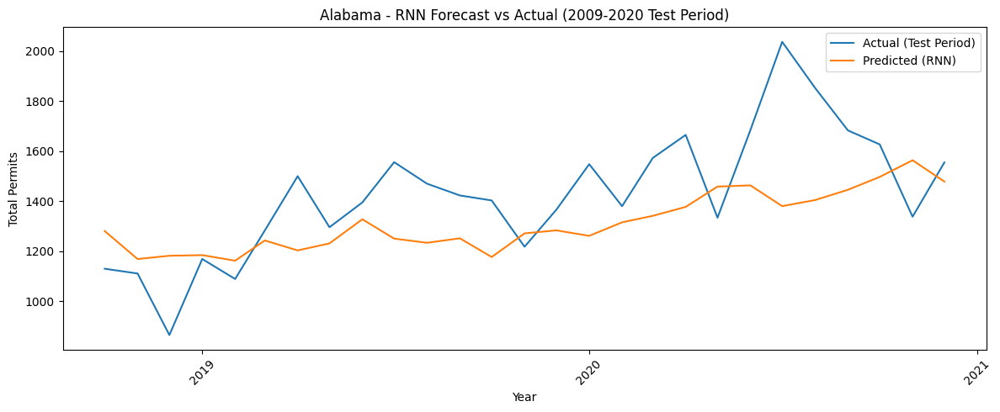


 RNN for Alaska (2009-2020)


/usr/local/lib/python3.12/dist-packages/keras/src/layers/rnn/rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 321ms/step


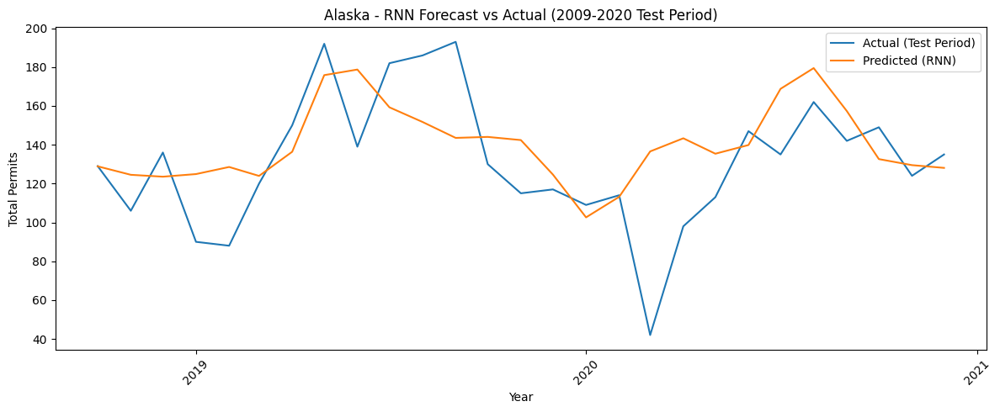


 RNN for Arizona (2009-2020)


/usr/local/lib/python3.12/dist-packages/keras/src/layers/rnn/rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 292ms/step


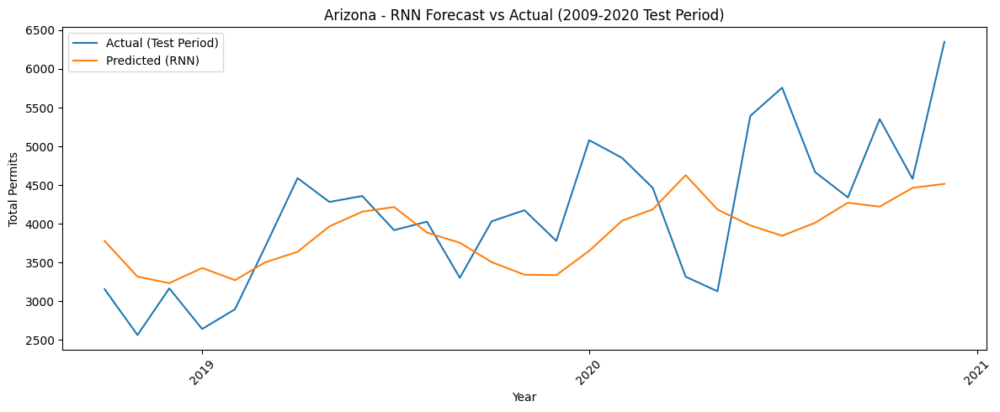


 RNN for Arkansas (2009-2020)


/usr/local/lib/python3.12/dist-packages/keras/src/layers/rnn/rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 311ms/step


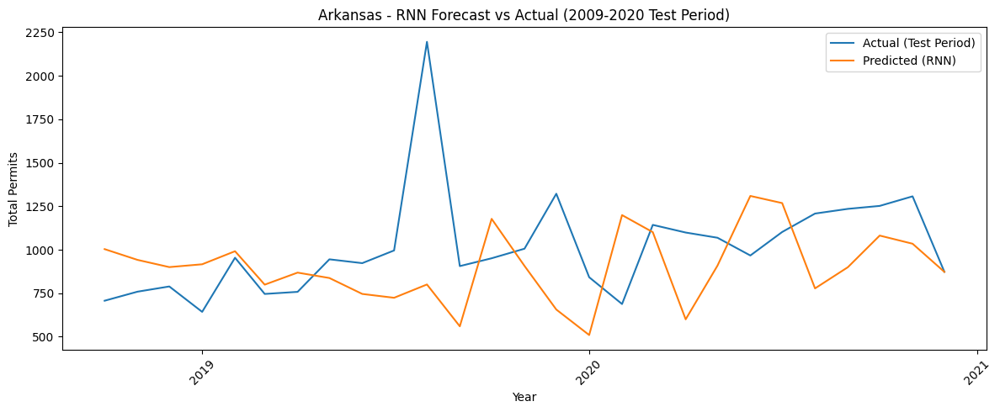


 RNN for California (2009-2020)


/usr/local/lib/python3.12/dist-packages/keras/src/layers/rnn/rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 295ms/step


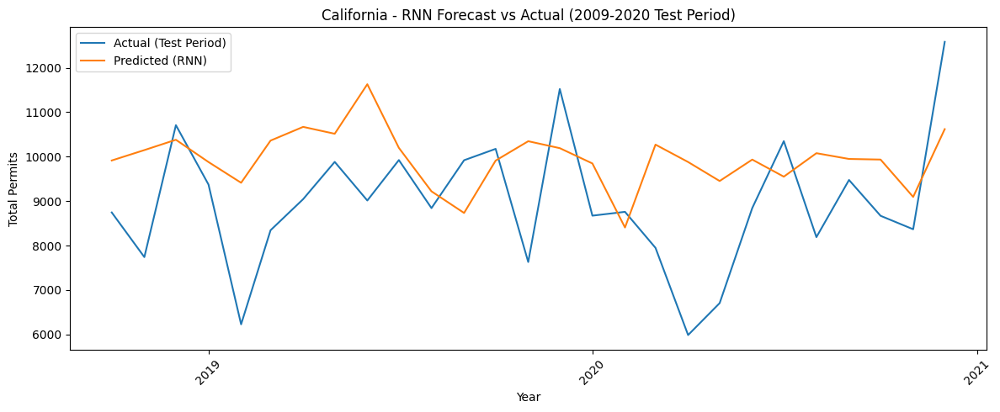


 RNN for Colorado (2009-2020)


/usr/local/lib/python3.12/dist-packages/keras/src/layers/rnn/rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 308ms/step


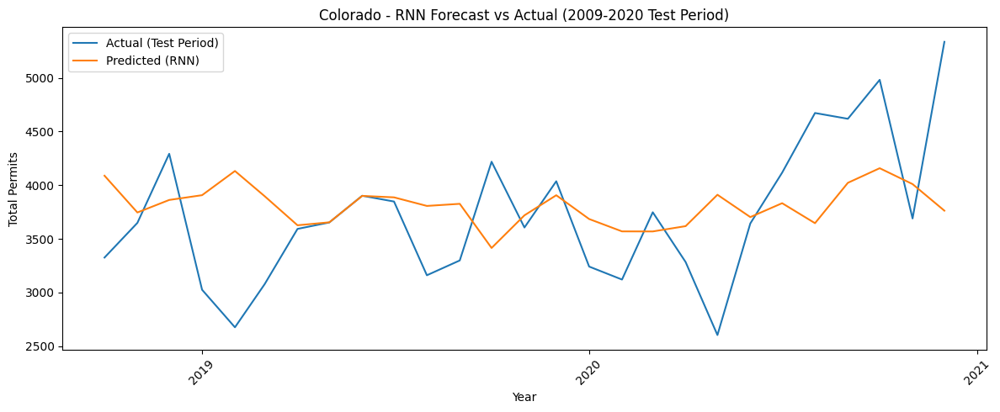


 RNN for Connecticut (2009-2020)


/usr/local/lib/python3.12/dist-packages/keras/src/layers/rnn/rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 399ms/step


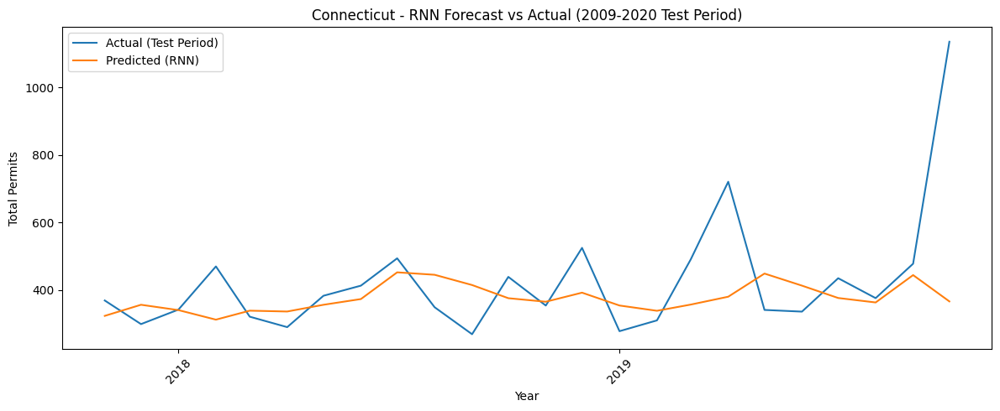


 RNN for Delaware (2009-2020)


/usr/local/lib/python3.12/dist-packages/keras/src/layers/rnn/rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 315ms/step


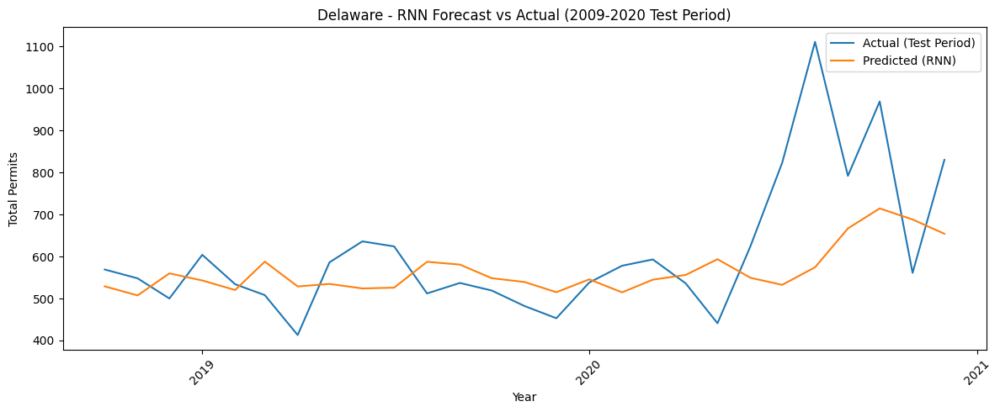


 RNN for District of Columbia (2009-2020)


/usr/local/lib/python3.12/dist-packages/keras/src/layers/rnn/rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 300ms/step


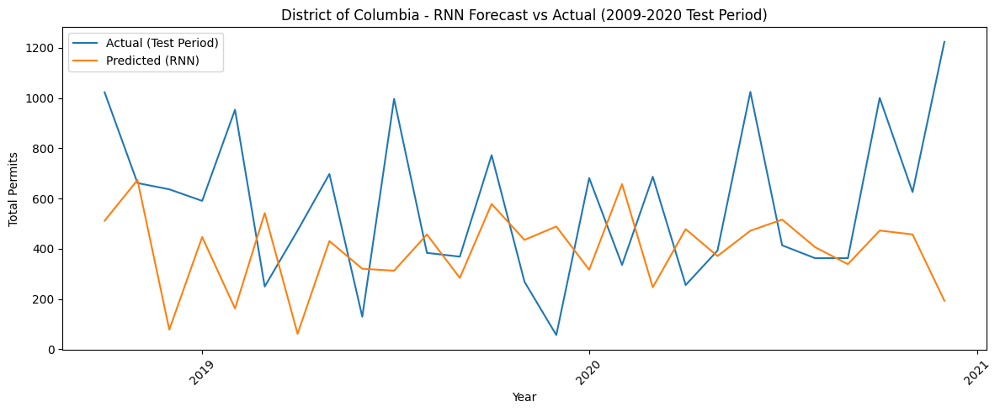


 RNN for Florida (2009-2020)


/usr/local/lib/python3.12/dist-packages/keras/src/layers/rnn/rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 365ms/step


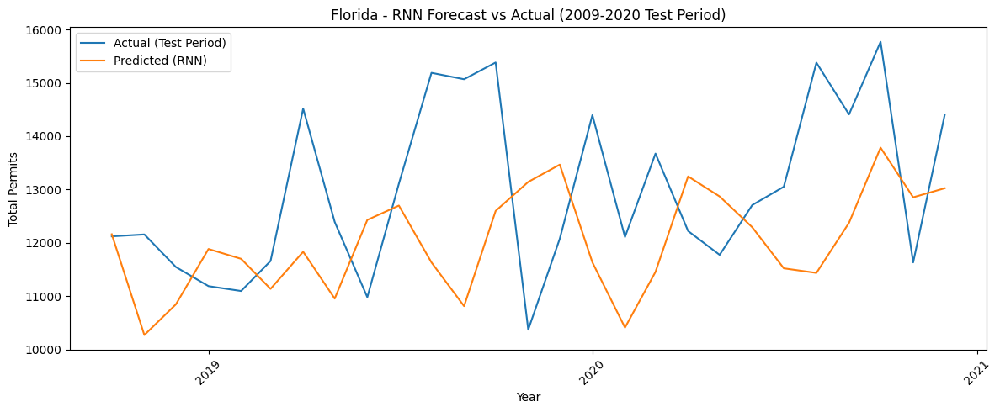


 RNN for Georgia (2009-2020)


/usr/local/lib/python3.12/dist-packages/keras/src/layers/rnn/rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 301ms/step


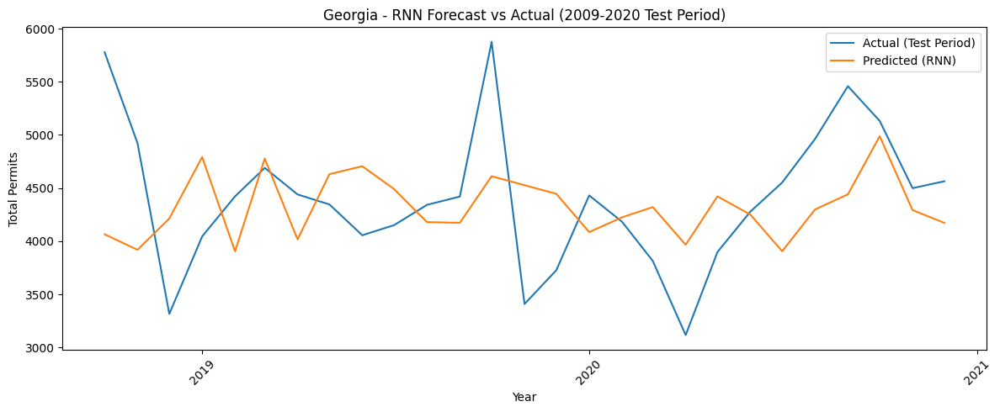


 RNN for Hawaii (2009-2020)


/usr/local/lib/python3.12/dist-packages/keras/src/layers/rnn/rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 306ms/step


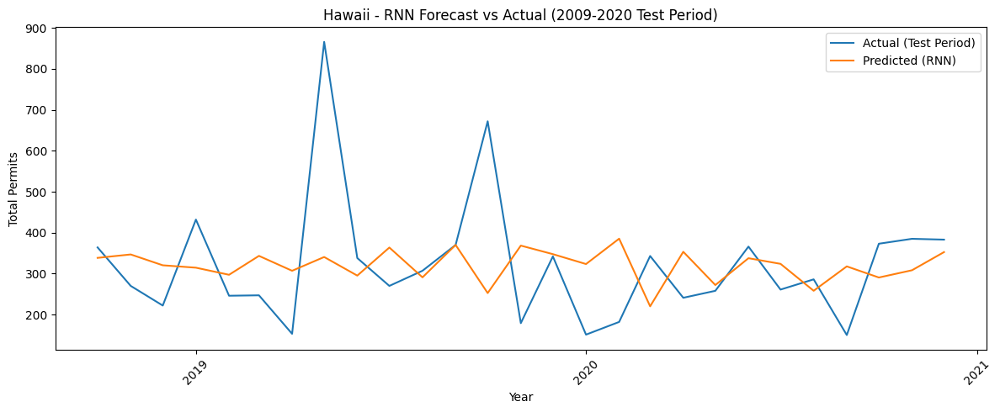


 RNN for Idaho (2009-2020)


/usr/local/lib/python3.12/dist-packages/keras/src/layers/rnn/rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 353ms/step


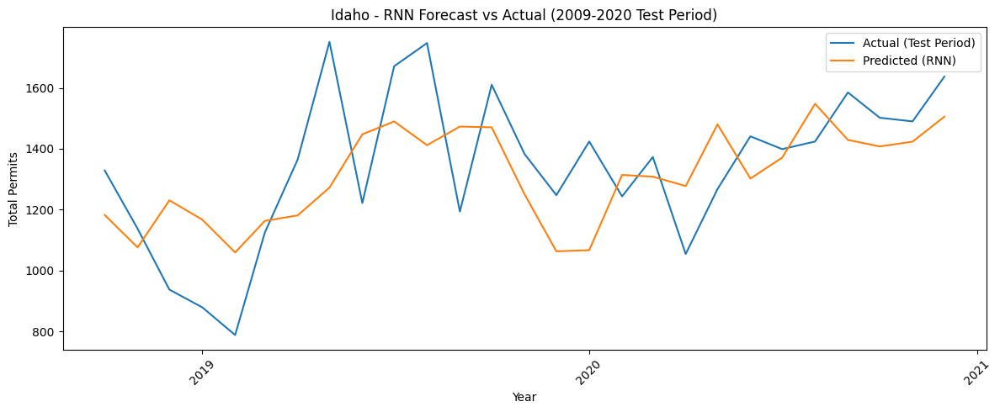


 RNN for Illinois (2009-2020)


/usr/local/lib/python3.12/dist-packages/keras/src/layers/rnn/rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 305ms/step


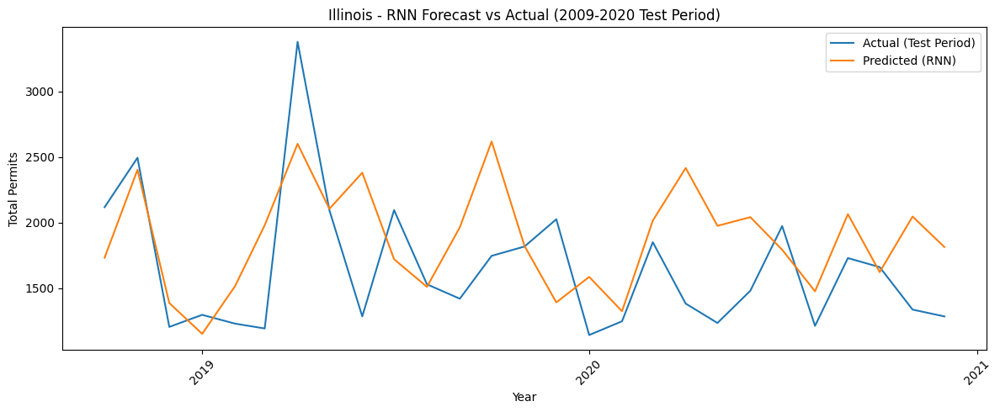


 RNN for Indiana (2009-2020)


/usr/local/lib/python3.12/dist-packages/keras/src/layers/rnn/rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 301ms/step


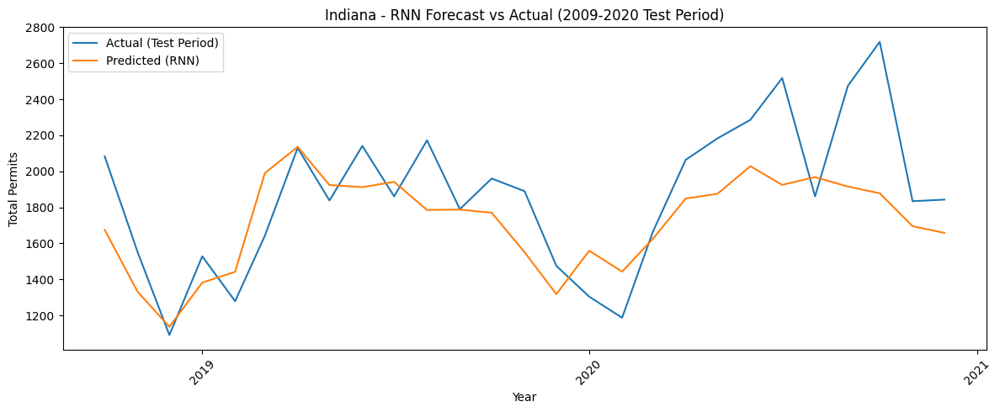


 RNN for Iowa (2009-2020)


/usr/local/lib/python3.12/dist-packages/keras/src/layers/rnn/rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 444ms/step


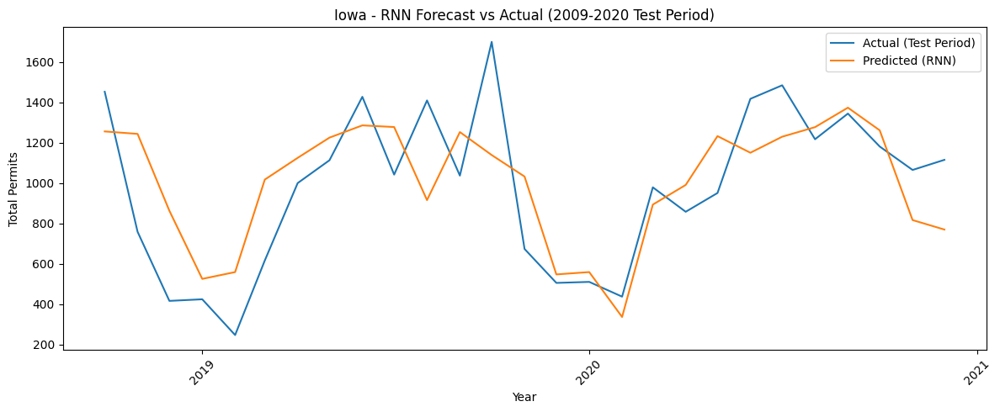


 RNN for Kansas (2009-2020)


/usr/local/lib/python3.12/dist-packages/keras/src/layers/rnn/rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 320ms/step


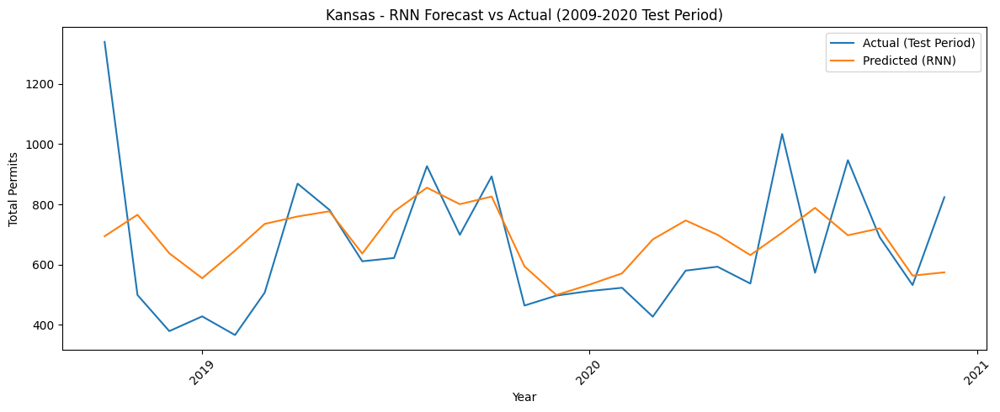


 RNN for Kentucky (2009-2020)


/usr/local/lib/python3.12/dist-packages/keras/src/layers/rnn/rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 304ms/step


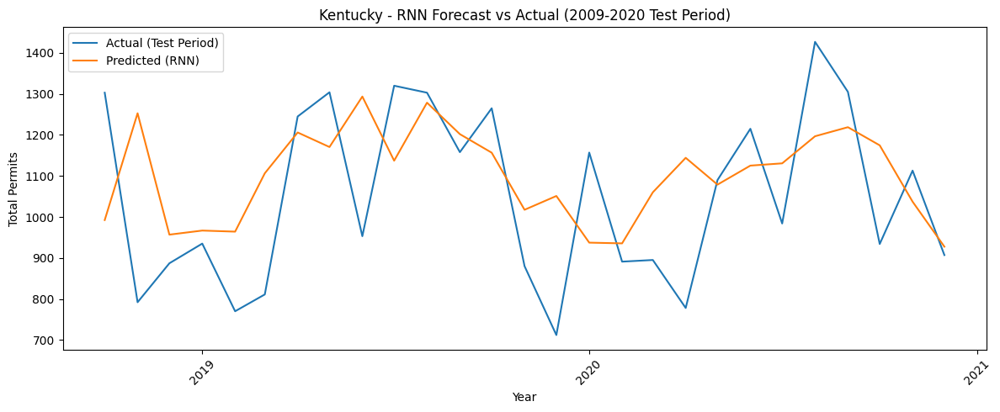


 RNN for Louisiana (2009-2020)


/usr/local/lib/python3.12/dist-packages/keras/src/layers/rnn/rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 434ms/step


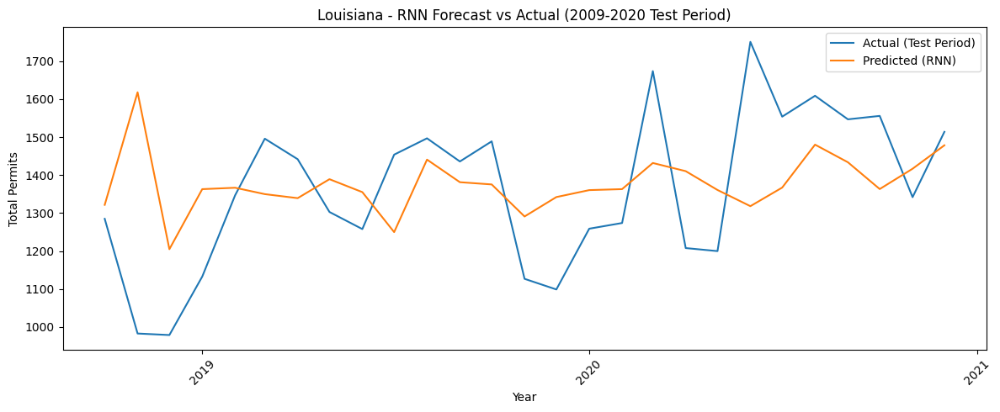


 RNN for Maine (2009-2020)


/usr/local/lib/python3.12/dist-packages/keras/src/layers/rnn/rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 331ms/step


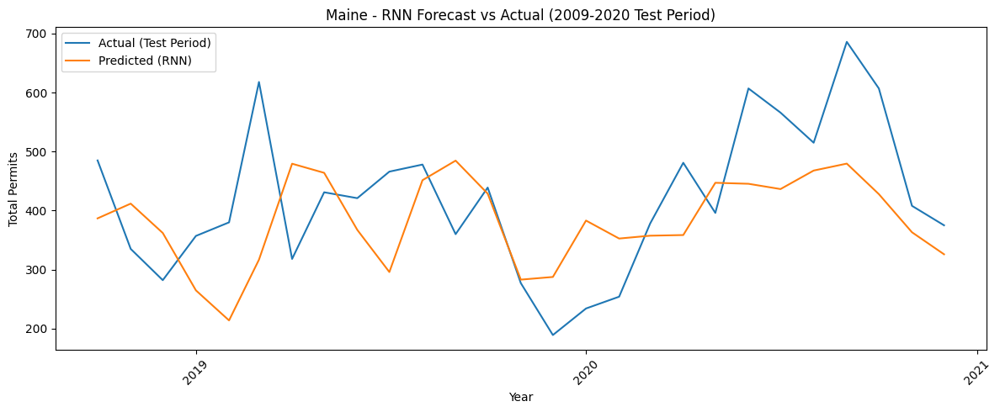


 RNN for Maryland (2009-2020)


/usr/local/lib/python3.12/dist-packages/keras/src/layers/rnn/rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 319ms/step


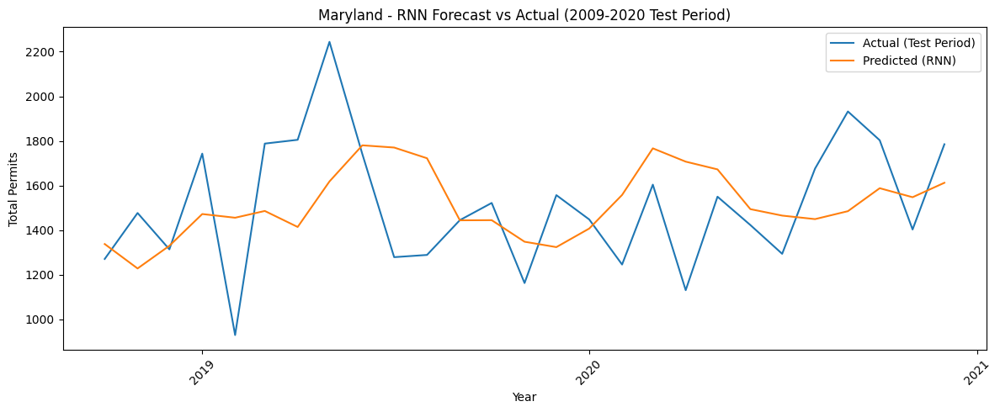


 RNN for Massachusetts (2009-2020)


/usr/local/lib/python3.12/dist-packages/keras/src/layers/rnn/rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 319ms/step


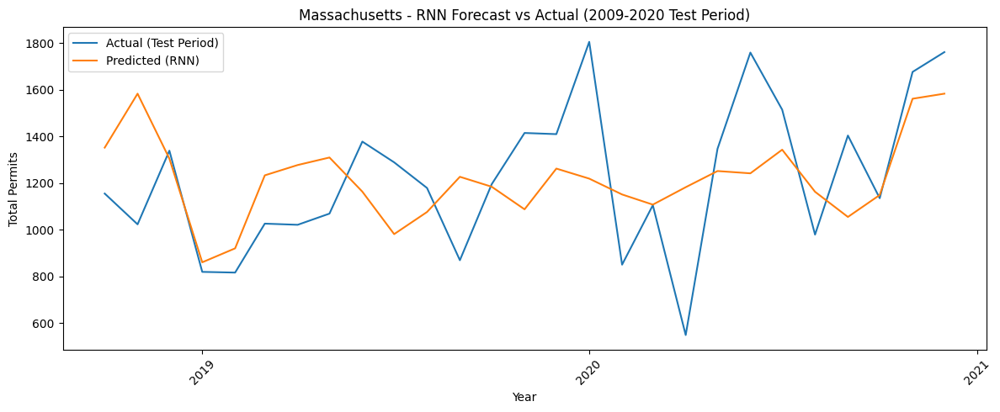


 RNN for Michigan (2009-2020)


/usr/local/lib/python3.12/dist-packages/keras/src/layers/rnn/rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 311ms/step


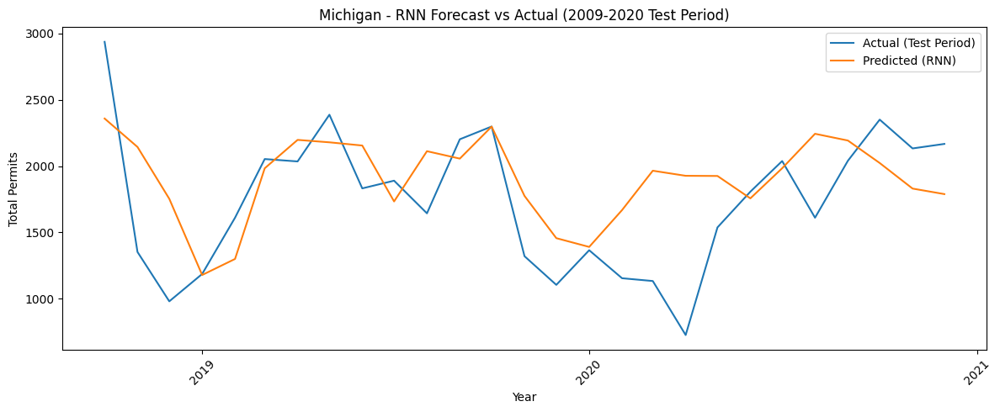


 RNN for Minnesota (2009-2020)


/usr/local/lib/python3.12/dist-packages/keras/src/layers/rnn/rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 318ms/step


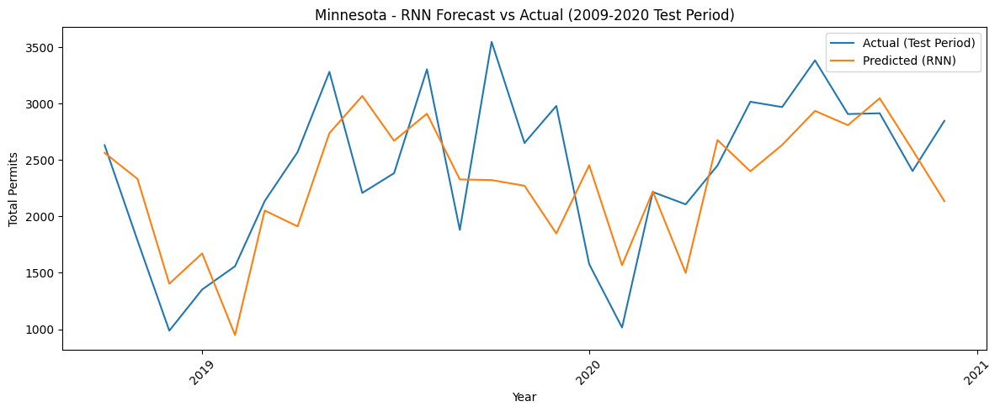


 RNN for Mississippi (2009-2020)


/usr/local/lib/python3.12/dist-packages/keras/src/layers/rnn/rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 311ms/step


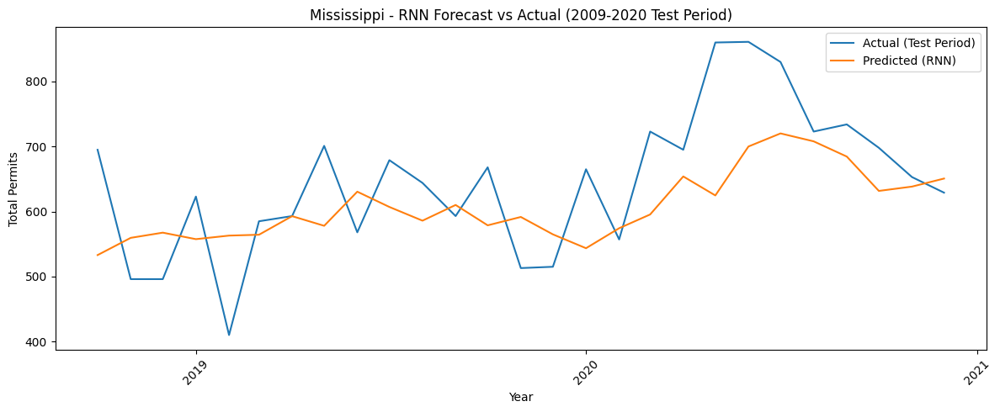


 RNN for Missouri (2009-2020)


/usr/local/lib/python3.12/dist-packages/keras/src/layers/rnn/rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 308ms/step


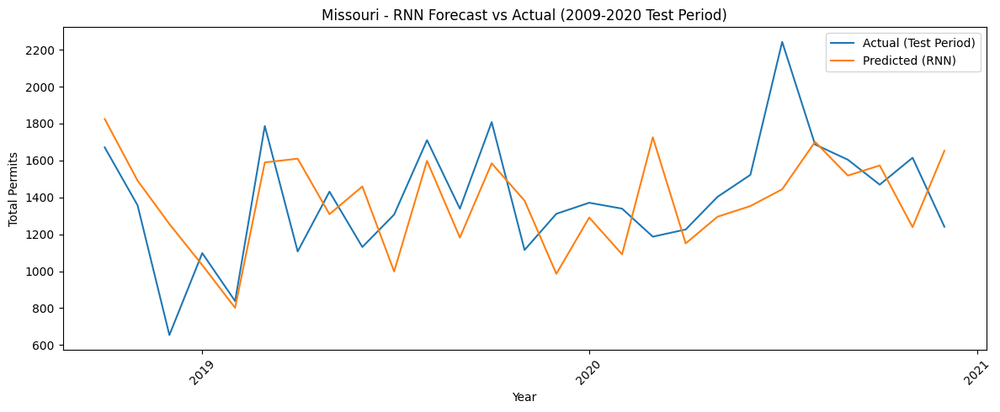


 RNN for Montana (2009-2020)


/usr/local/lib/python3.12/dist-packages/keras/src/layers/rnn/rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 314ms/step


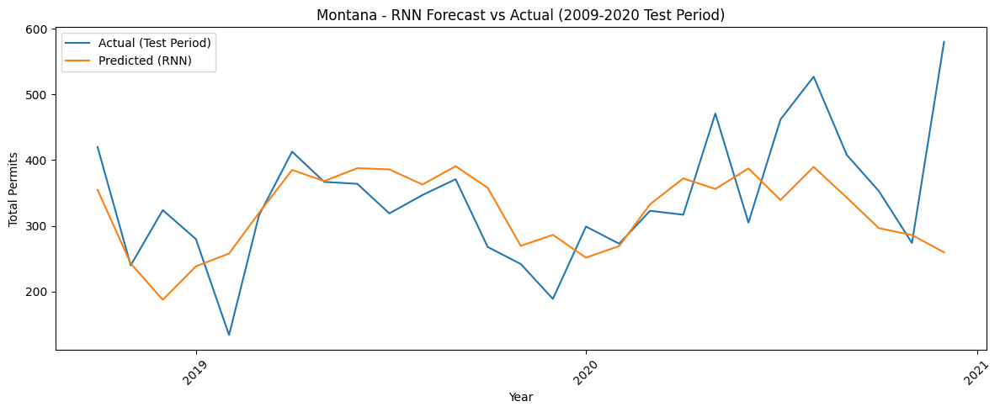


 RNN for Nebraska (2009-2020)


/usr/local/lib/python3.12/dist-packages/keras/src/layers/rnn/rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 312ms/step


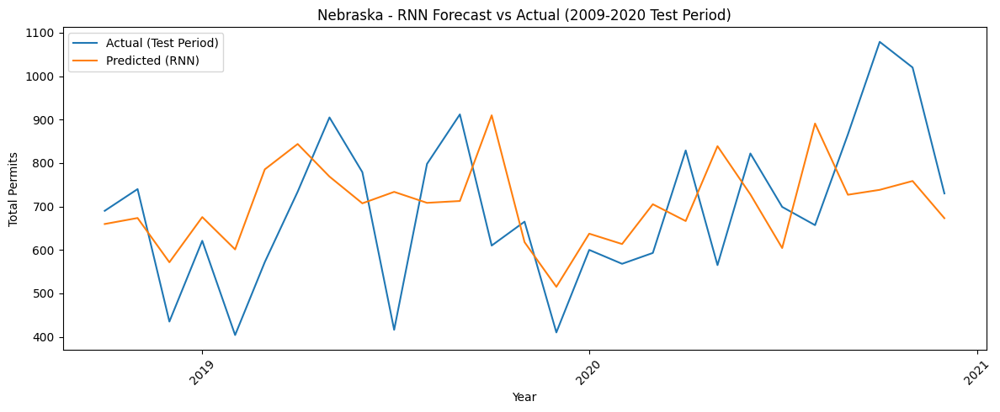


 RNN for Nevada (2009-2020)


/usr/local/lib/python3.12/dist-packages/keras/src/layers/rnn/rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 306ms/step


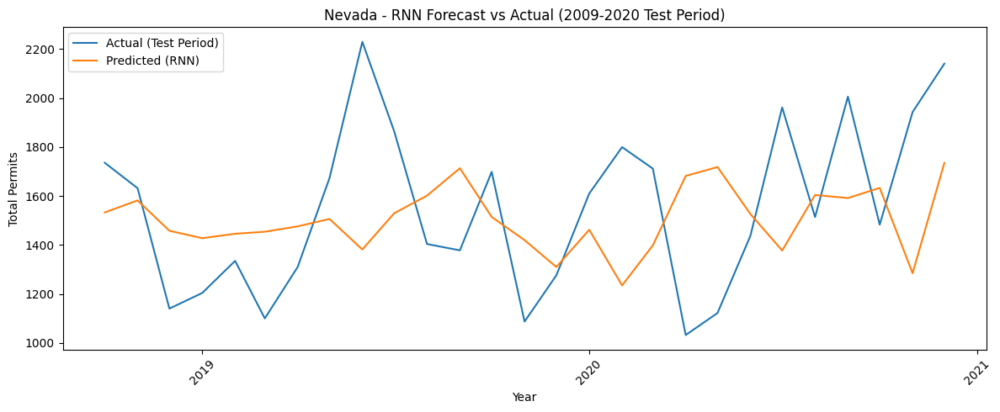


 RNN for New Hampshire (2009-2020)


/usr/local/lib/python3.12/dist-packages/keras/src/layers/rnn/rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 310ms/step


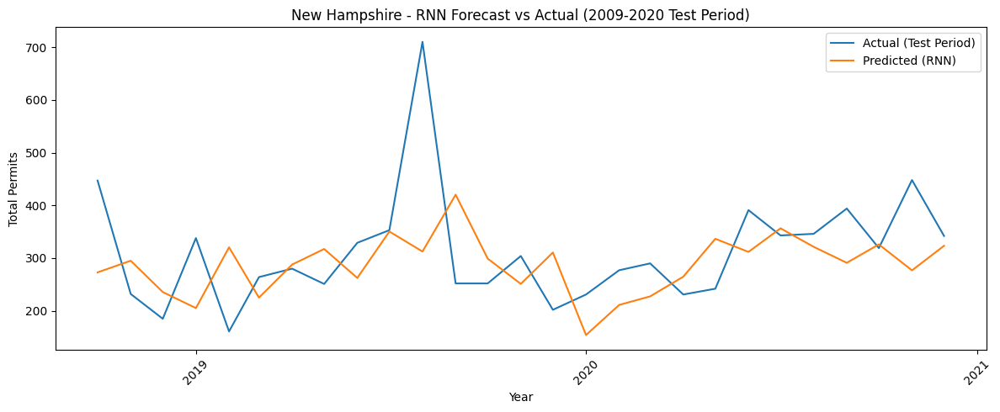


 RNN for New Jersey (2009-2020)


/usr/local/lib/python3.12/dist-packages/keras/src/layers/rnn/rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 298ms/step


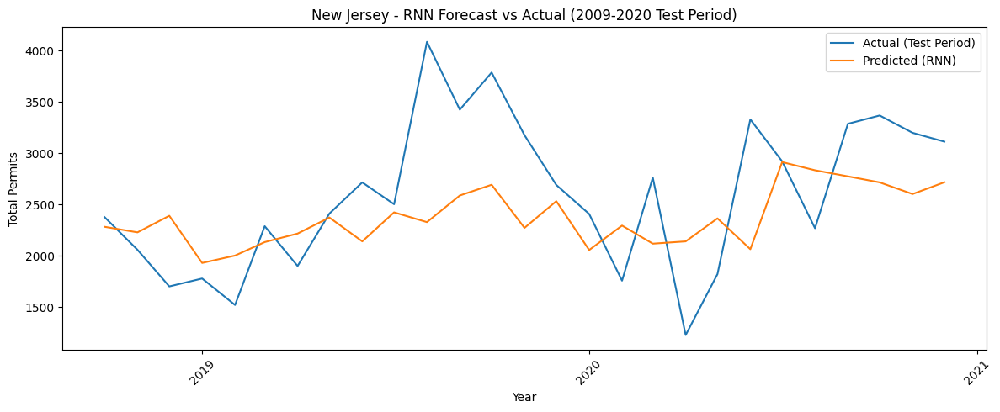


 RNN for New Mexico (2009-2020)


/usr/local/lib/python3.12/dist-packages/keras/src/layers/rnn/rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 312ms/step


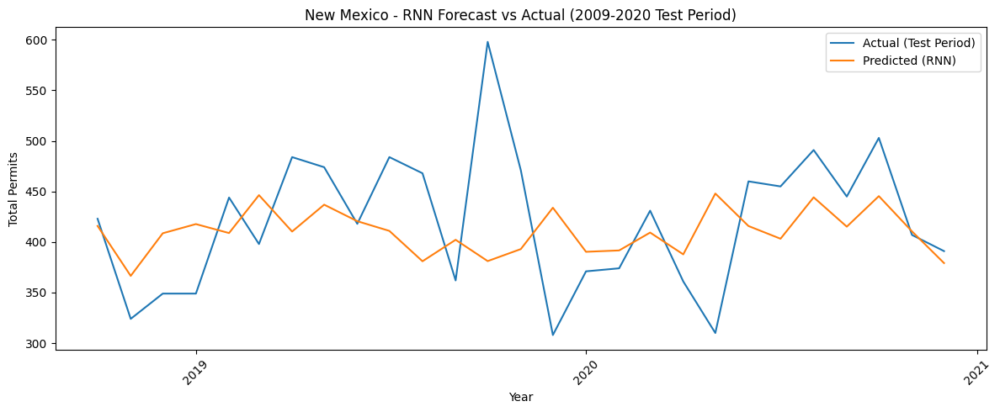


 RNN for New York (2009-2020)


/usr/local/lib/python3.12/dist-packages/keras/src/layers/rnn/rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 303ms/step


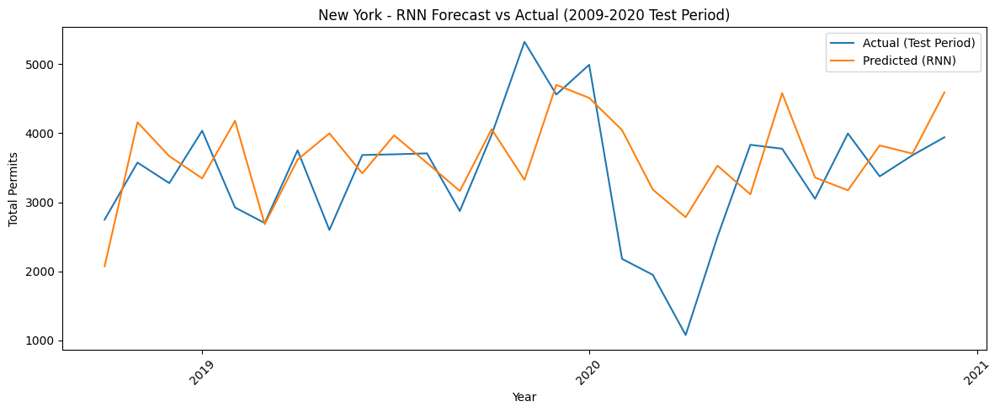


 RNN for North Carolina (2009-2020)


/usr/local/lib/python3.12/dist-packages/keras/src/layers/rnn/rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 310ms/step


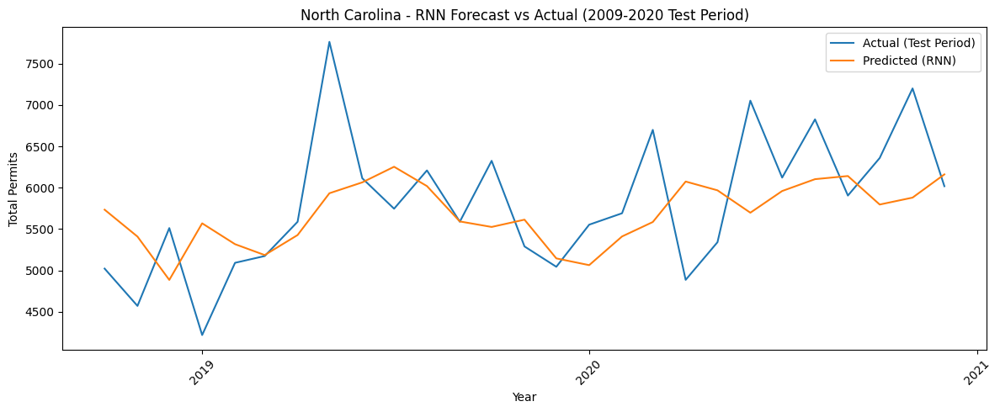


 RNN for North Dakota (2009-2020)


/usr/local/lib/python3.12/dist-packages/keras/src/layers/rnn/rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 313ms/step


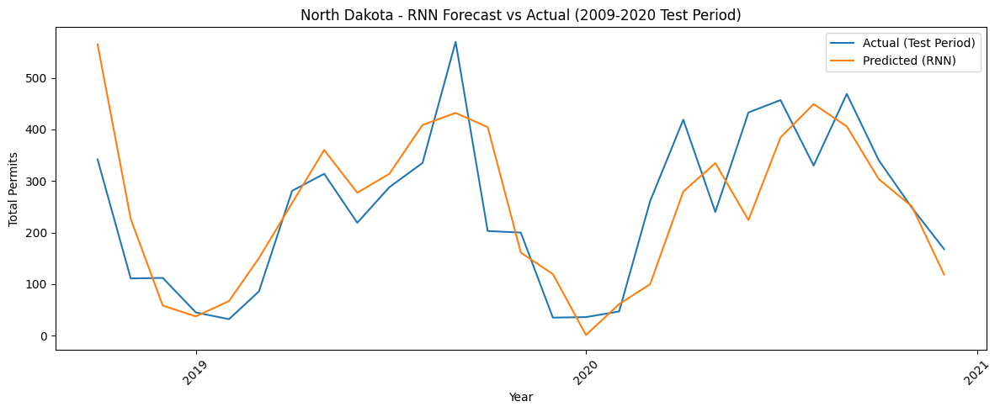


 RNN for Ohio (2009-2020)


/usr/local/lib/python3.12/dist-packages/keras/src/layers/rnn/rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 306ms/step


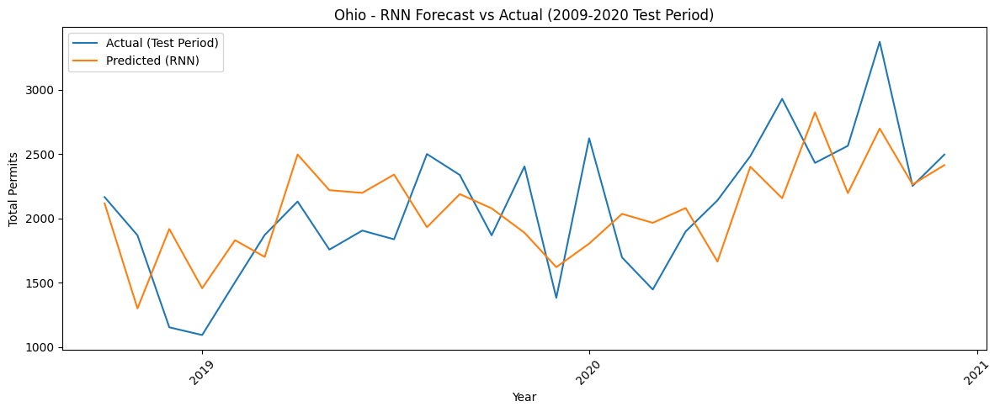


 RNN for Oklahoma (2009-2020)


/usr/local/lib/python3.12/dist-packages/keras/src/layers/rnn/rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 307ms/step


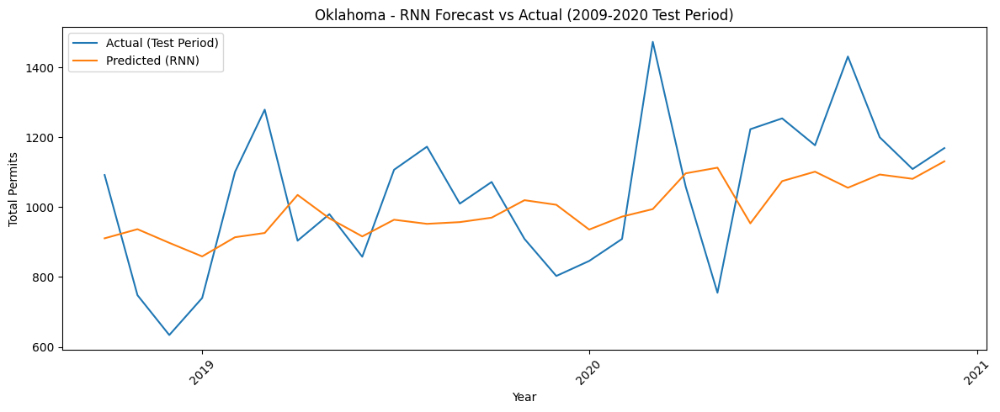


 RNN for Oregon (2009-2020)


/usr/local/lib/python3.12/dist-packages/keras/src/layers/rnn/rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 319ms/step


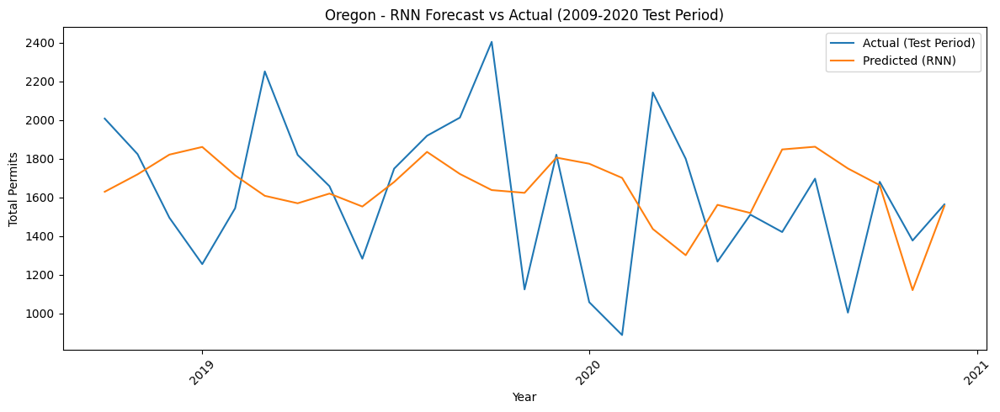


 RNN for Pennsylvania (2009-2020)


/usr/local/lib/python3.12/dist-packages/keras/src/layers/rnn/rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 460ms/step


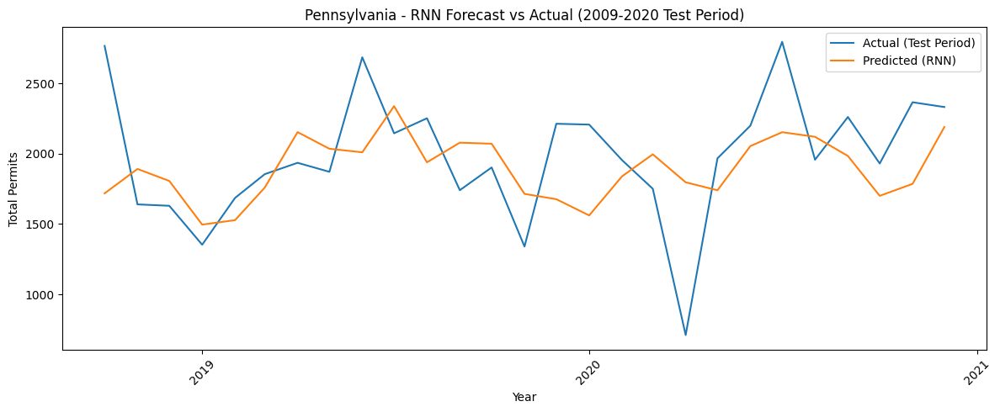


 RNN for Rhode Island (2009-2020)


/usr/local/lib/python3.12/dist-packages/keras/src/layers/rnn/rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 328ms/step


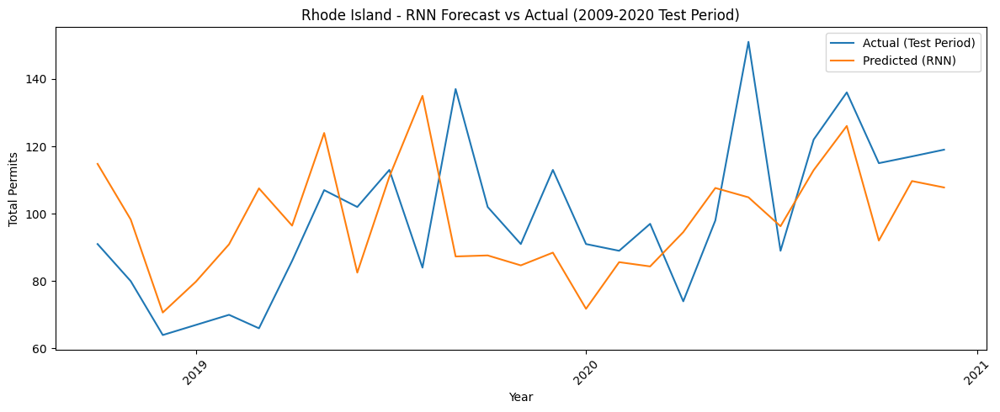


 RNN for South Carolina (2009-2020)


/usr/local/lib/python3.12/dist-packages/keras/src/layers/rnn/rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 303ms/step


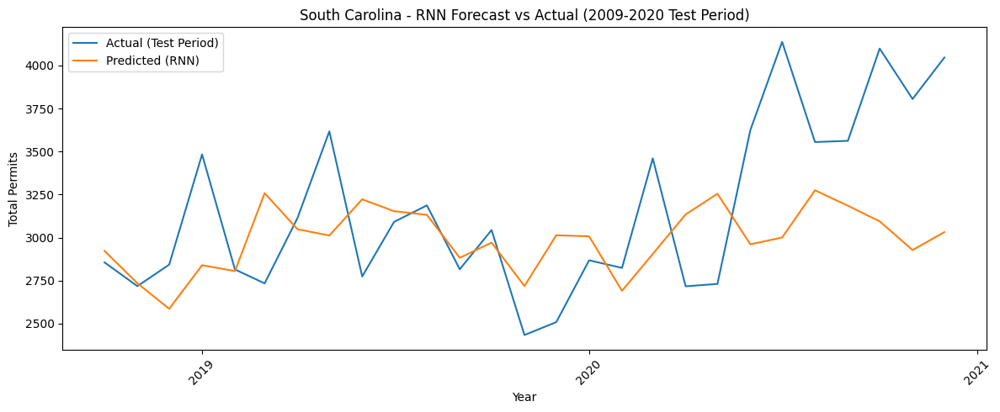


 RNN for South Dakota (2009-2020)


/usr/local/lib/python3.12/dist-packages/keras/src/layers/rnn/rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 310ms/step


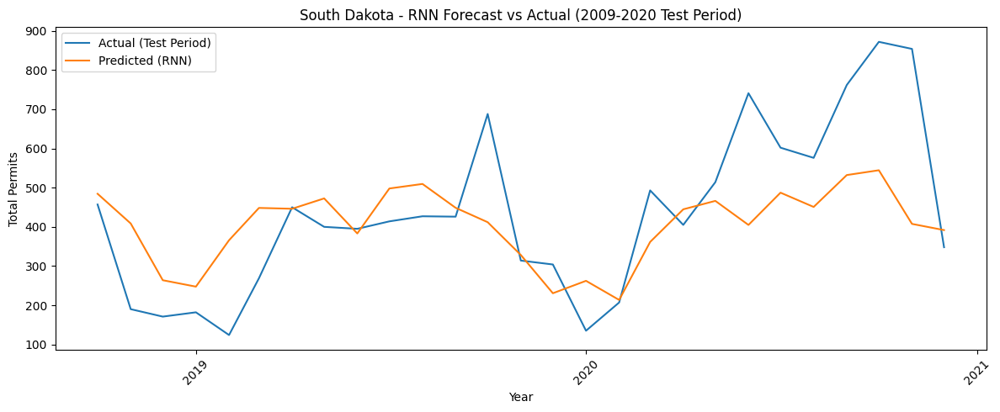


 RNN for Tennessee (2009-2020)


/usr/local/lib/python3.12/dist-packages/keras/src/layers/rnn/rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 311ms/step


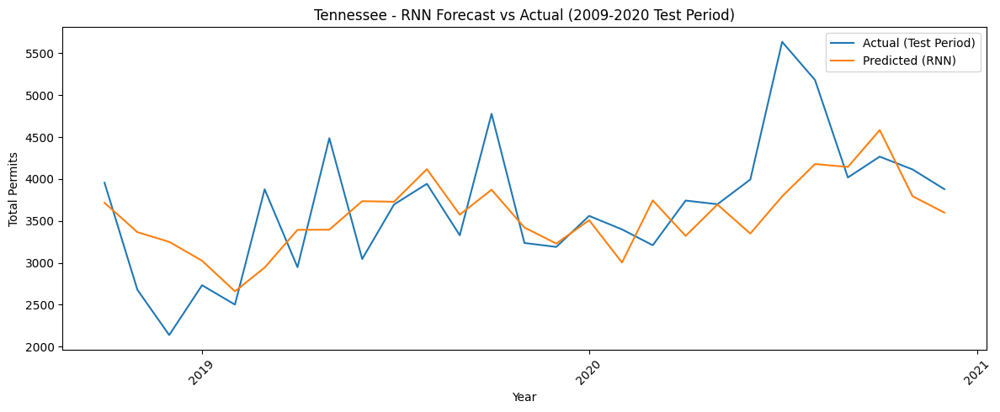


 RNN for Texas (2009-2020)


/usr/local/lib/python3.12/dist-packages/keras/src/layers/rnn/rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 304ms/step


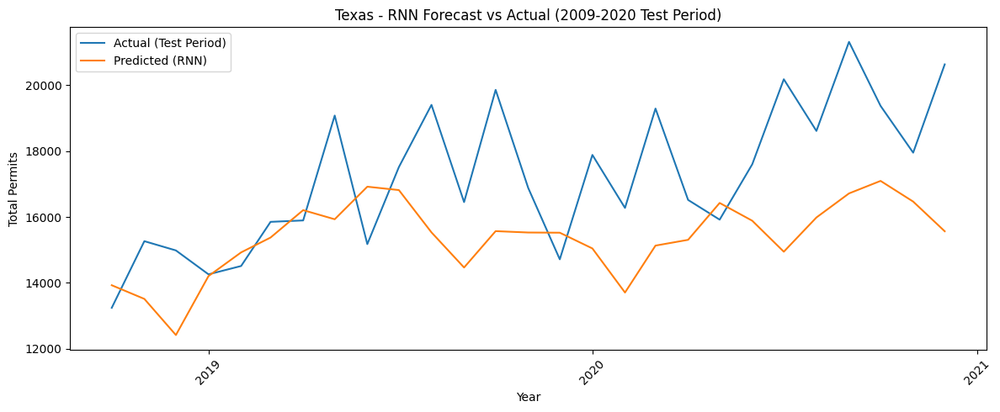


 RNN for Utah (2009-2020)


/usr/local/lib/python3.12/dist-packages/keras/src/layers/rnn/rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 310ms/step


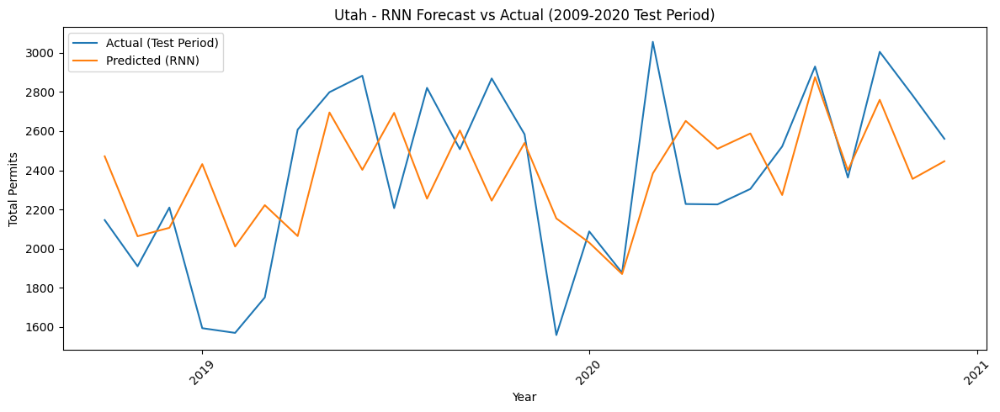


 RNN for Vermont (2009-2020)


/usr/local/lib/python3.12/dist-packages/keras/src/layers/rnn/rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 305ms/step


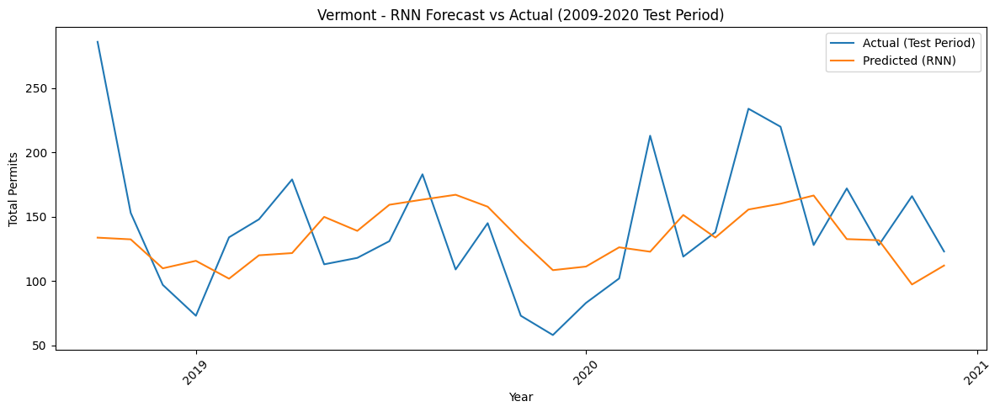


 RNN for Virginia (2009-2020)


/usr/local/lib/python3.12/dist-packages/keras/src/layers/rnn/rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 298ms/step


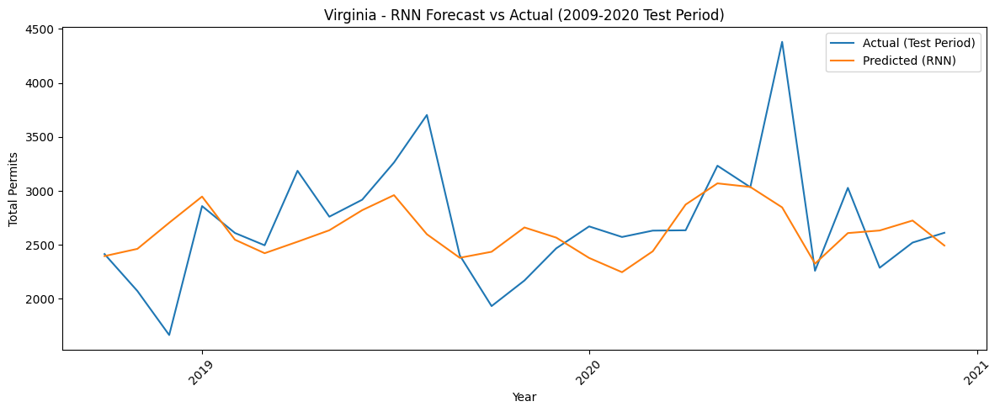


 RNN for Washington (2009-2020)


/usr/local/lib/python3.12/dist-packages/keras/src/layers/rnn/rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 306ms/step


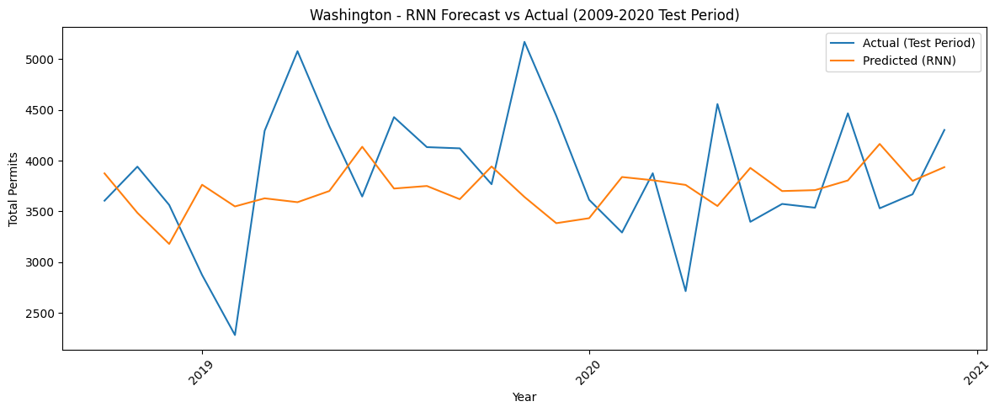


 RNN for West Virginia (2009-2020)


/usr/local/lib/python3.12/dist-packages/keras/src/layers/rnn/rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 305ms/step


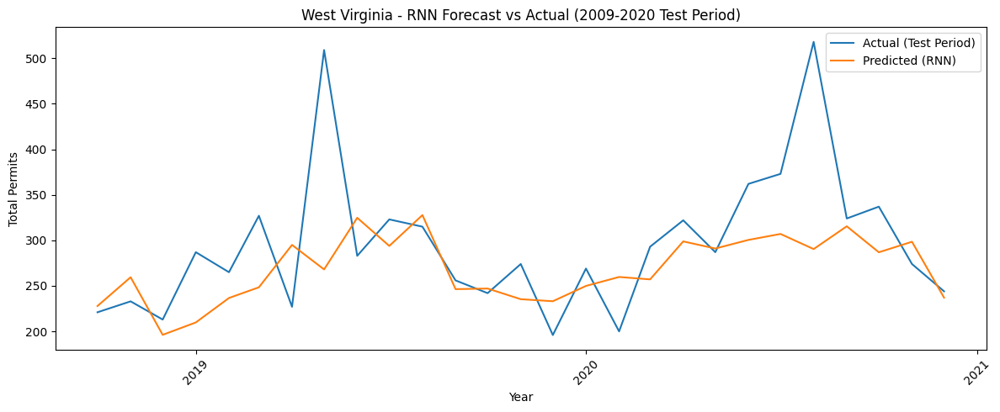


 RNN for Wisconsin (2009-2020)


/usr/local/lib/python3.12/dist-packages/keras/src/layers/rnn/rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 298ms/step


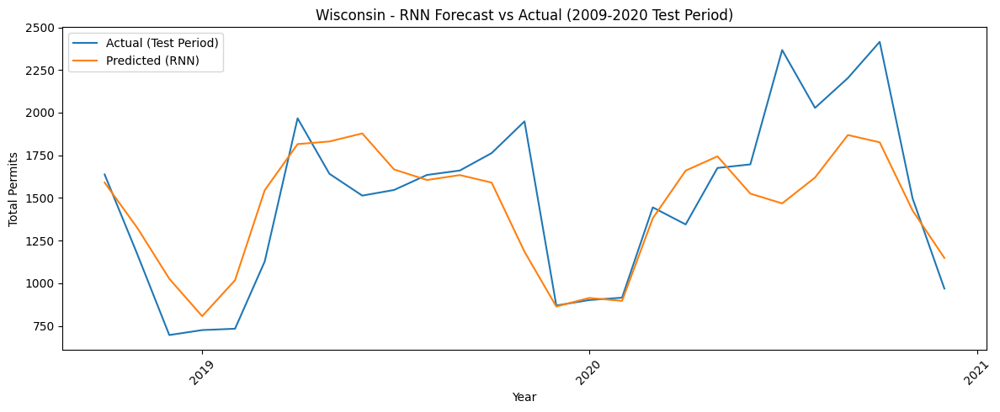


 RNN for Wyoming (2009-2020)


/usr/local/lib/python3.12/dist-packages/keras/src/layers/rnn/rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 310ms/step


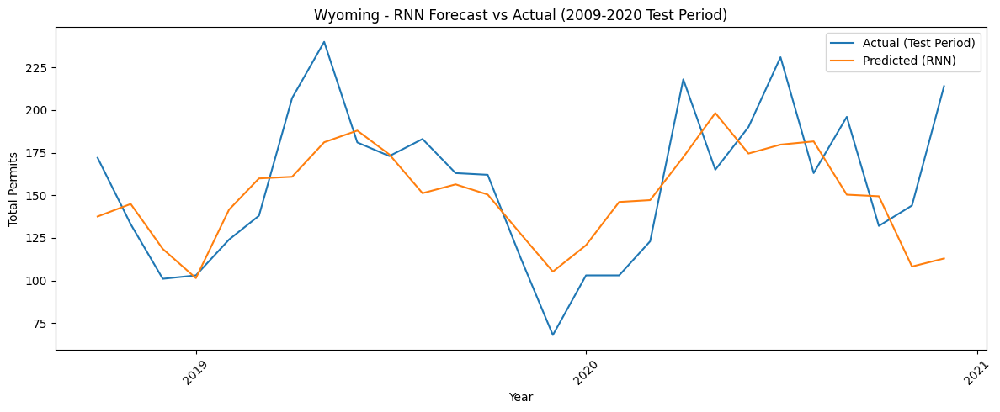

                   state  rmse_rnn_2008_2020
0                Alabama          237.199557
1                 Alaska           29.918528
2                Arizona          874.771377
3               Arkansas          389.905889
4             California         1760.670681
5               Colorado          686.401604
6            Connecticut          187.581032
7               Delaware          149.892384
8   District of Columbia          407.487062
9                Florida         2035.477801
10               Georgia          702.354627
11                Hawaii          162.243767
12                 Idaho          210.522571
13              Illinois          526.337901
14               Indiana          307.524051
15                  Iowa          273.591899
16                Kansas          208.363068
17              Kentucky          203.892156
18             Louisiana          205.837172
19                 Maine          122.945880
20              Maryland          300.085931
21        

In [11]:
# Filter data for date range 2009-01-01 to 2020-12-31
df_state_monthly_filtered = df_state_monthly[
    (df_state_monthly['Period.full'] >= '2009-01-01') &
    (df_state_monthly['Period.full'] <= '2020-12-31')
]

# Parameters
n_steps = 12
states = df_state_monthly_filtered['Name'].unique()
results_filtered = []

for state in states:
    print(f"\n RNN for {state} (2009-2020)")

    state_data = df_state_monthly_filtered[df_state_monthly_filtered['Name'] == state].sort_values('Period.full').copy()
    state_data['Period.full'] = pd.to_datetime(state_data['Period.full'])

    values = state_data['total_permits'].values.reshape(-1, 1)

    scaler = MinMaxScaler()
    scaled = scaler.fit_transform(values)

    X, y = create_sequences(scaled, n_steps)
    X = X.reshape((X.shape[0], X.shape[1], 1))

    split = int(len(X) * 0.8)
    X_train, X_test = X[:split], X[split:]
    y_train, y_test = y[:split], y[split:]

    model = tf.keras.Sequential([
        tf.keras.layers.SimpleRNN(64, activation='tanh', input_shape=(n_steps, 1)),
        tf.keras.layers.Dense(1)
    ])
    model.compile(optimizer='adam', loss='mse')

    model.fit(X_train, y_train, epochs=20, batch_size=16, verbose=0)

    y_pred = model.predict(X_test)
    y_pred_inv = scaler.inverse_transform(y_pred)
    y_test_inv = scaler.inverse_transform(y_test.reshape(-1, 1))

    rmse = np.sqrt(mean_squared_error(y_test_inv, y_pred_inv))
    results_filtered.append({'state': state, 'rmse_rnn_2008_2020': rmse})

    # Predict vs actual plot for test period with year labels
    test_dates = state_data['Period.full'].values[split + n_steps:]
    test_dates = pd.to_datetime(test_dates)

    plt.figure(figsize=(12, 5))
    plt.plot(test_dates, y_test_inv, label='Actual (Test Period)')
    plt.plot(test_dates, y_pred_inv, label='Predicted (RNN)')
    plt.title(f'{state} - RNN Forecast vs Actual (2009-2020 Test Period)')
    plt.xlabel('Year')
    plt.ylabel('Total Permits')
    plt.legend()
    plt.gca().xaxis.set_major_locator(mdates.YearLocator())
    plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%Y'))
    plt.xticks(rotation=45)
    plt.tight_layout()
    plt.show()

results_filtered_df = pd.DataFrame(results_filtered)
print(results_filtered_df)


In [12]:
# States not in red or green (middle performers)
excluded = list(top3_lowest['state']) + list(top3_highest['state'])

middle_states_df = results_df[~results_df['state'].isin(excluded)]

print("\nStates NOT in red or green:")
print(middle_states_df)


States NOT in red or green:
                   state    rmse_rnn
0                Alabama  231.718544
2                Arizona  845.702664
3               Arkansas  293.251253
5               Colorado  673.425561
6            Connecticut  165.650535
7               Delaware  148.688447
8   District of Columbia  394.961494
10               Georgia  958.648859
11                Hawaii  184.007952
12                 Idaho  215.742211
13              Illinois  534.689668
14               Indiana  346.243922
15                  Iowa  266.375171
16                Kansas  229.280874
17              Kentucky  235.870250
18             Louisiana  271.961612
19                 Maine   97.110681
20              Maryland  350.220384
21         Massachusetts  437.129254
22              Michigan  494.960153
23             Minnesota  603.983217
24           Mississippi  102.414930
25              Missouri  388.076105
26               Montana   89.501578
27              Nebraska  223.078248
28       

In [13]:
import pandas as pd
import numpy as np

# ---------------------------
# Ensure 'Period.full' is datetime
# ---------------------------
df_state_monthly['Period.full'] = pd.to_datetime(df_state_monthly['Period.full'])

# ---------------------------
# Filter data for the range 2009-01-01 to 2020-12-31
# ---------------------------
df_filtered = df_state_monthly[
    (df_state_monthly['Period.full'] >= '2009-01-01') &
    (df_state_monthly['Period.full'] <= '2020-12-31')
]

# ---------------------------
# Aggregate total permits per state per month
# ---------------------------
df_state_monthly_filtered = df_filtered.groupby(
    ['Name', 'Period.full'], as_index=False
)['total_permits'].sum()

# ---------------------------
# Confirm filtering and aggregation
# ---------------------------
print("Filtered and aggregated DataFrame preview:")
print(df_state_monthly_filtered.head())
print(f"Total states: {df_state_monthly_filtered['Name'].nunique()}")
print(f"Total rows: {len(df_state_monthly_filtered)}")

Filtered and aggregated DataFrame preview:
      Name Period.full  total_permits
0  Alabama  2009-01-01            871
1  Alabama  2009-02-01            649
2  Alabama  2009-03-01            895
3  Alabama  2009-04-01           1391
4  Alabama  2009-05-01            851
Total states: 51
Total rows: 7330


In [14]:
# ============================================================
# BLOCK 1 — Select exactly 5 Blue States (Fully Random)
# ============================================================

# Start from your filtered RMSE DataFrame
rmse_df = results_filtered_df.copy()

# Identify extreme states (exclude them)
top3_lowest = rmse_df.nsmallest(3, "rmse_rnn_2008_2020")
top3_highest = rmse_df.nlargest(3, "rmse_rnn_2008_2020")

excluded = set(top3_lowest["state"]) | set(top3_highest["state"])

# Blue states only = not in extremes
blue_states_df = rmse_df[~rmse_df["state"].isin(excluded)]

# Randomly select 5 states (truly random every run)
#selected_states = blue_states_df.sample(5)["state"].tolist()
selected_states = ["Alabama", "Arizona","Arkansas", "Colorado", "Delaware","Georgia","Iowa","New York","Ohio","Oklahoma"]


#print("Randomly Selected 5 'Blue' States:")
print(selected_states)

['Alabama', 'Arizona', 'Arkansas', 'Colorado', 'Delaware', 'Georgia', 'Iowa', 'New York', 'Ohio', 'Oklahoma']



RNN baseline for Alabama


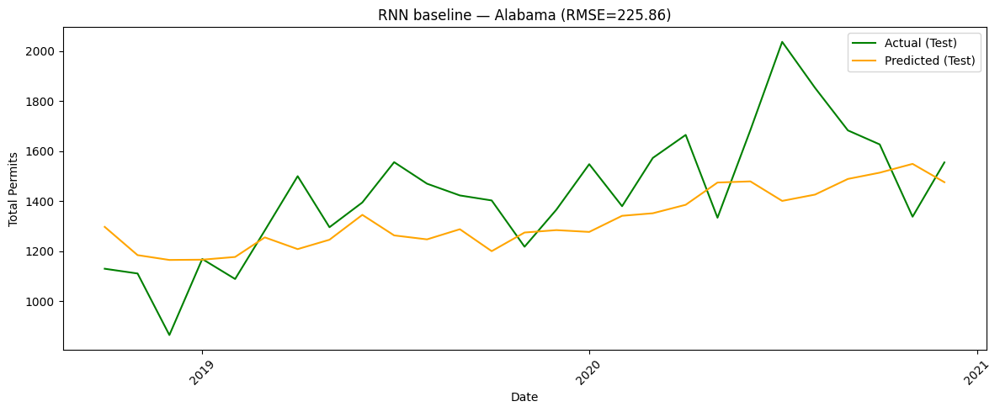


RNN baseline for Arizona


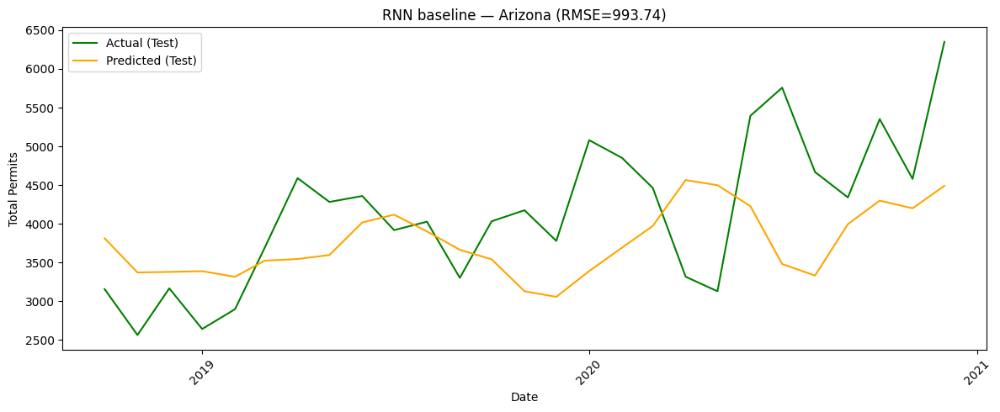


RNN baseline for Arkansas


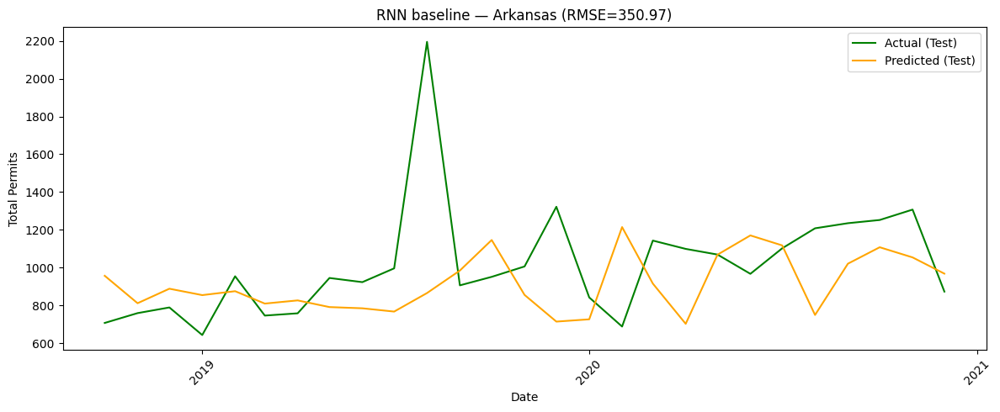


RNN baseline for Colorado


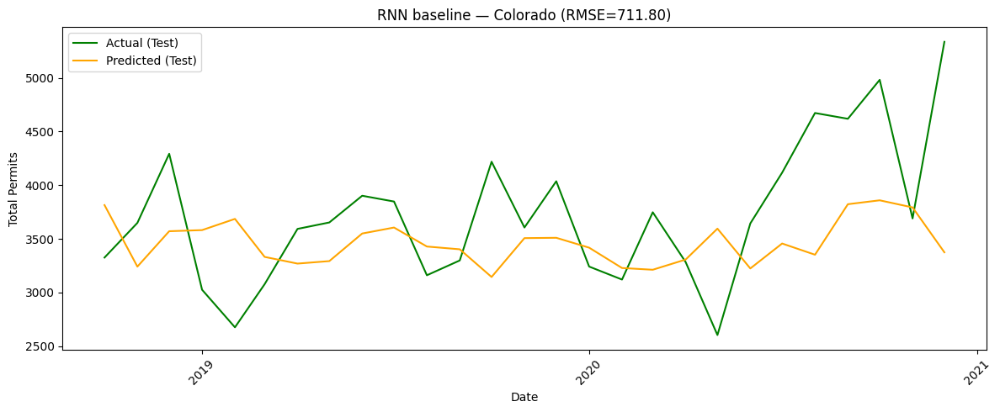


RNN baseline for Delaware


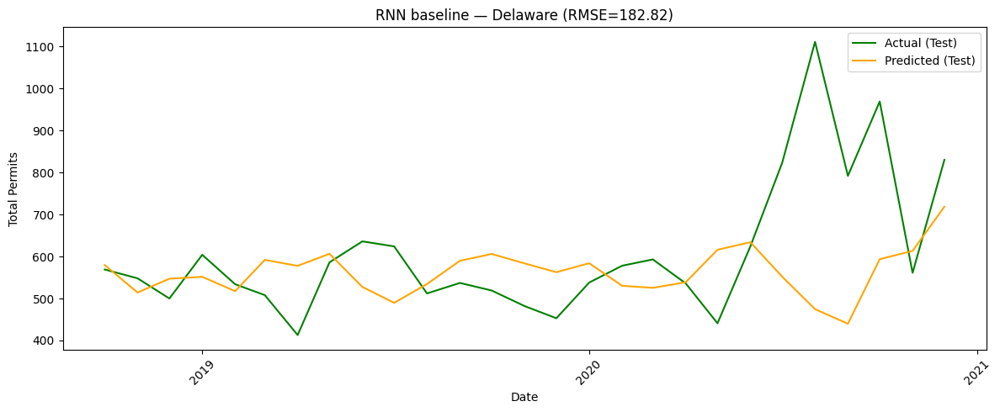


RNN baseline for Georgia


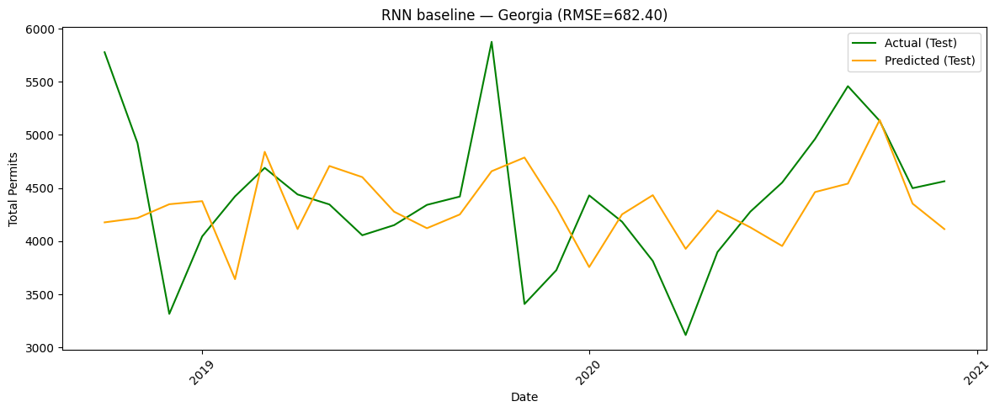


RNN baseline for Iowa


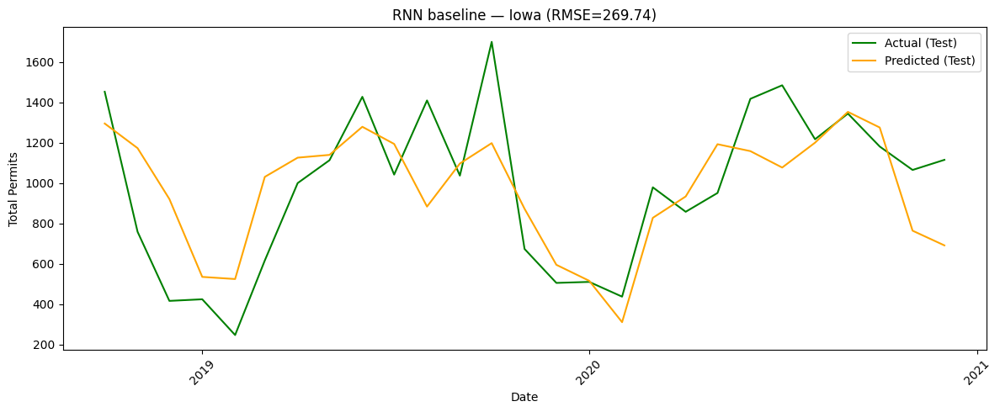


RNN baseline for New York


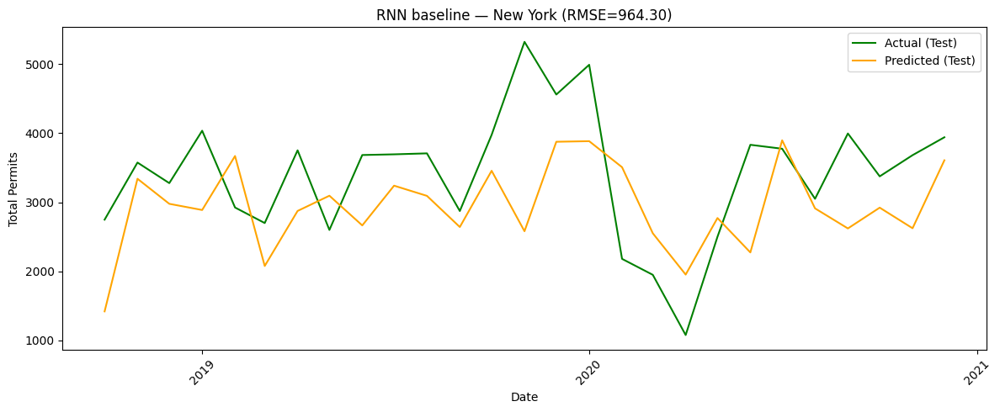


RNN baseline for Ohio


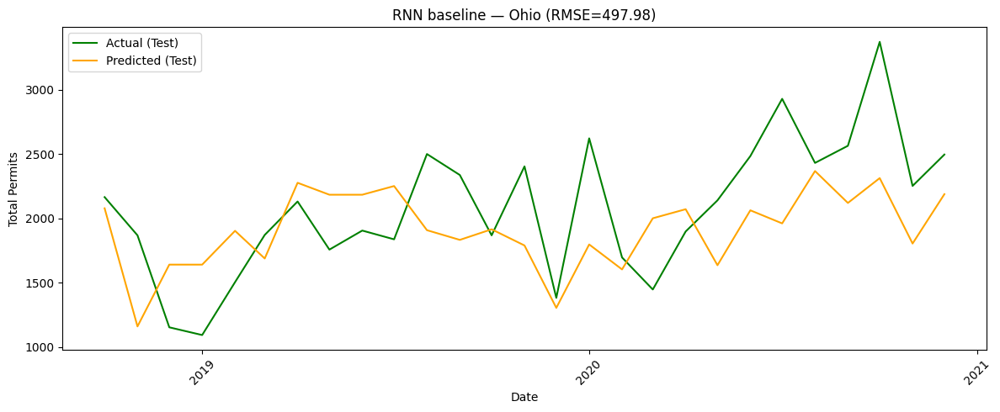


RNN baseline for Oklahoma


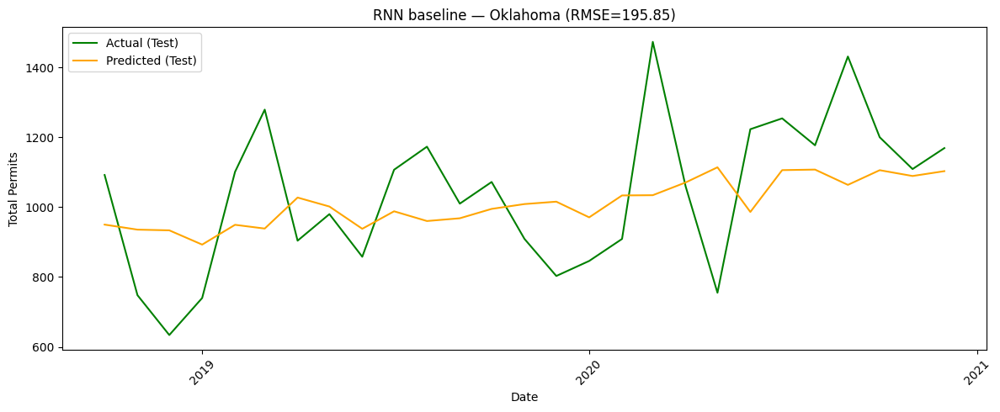

      state        rmse
0   Alabama  225.860317
1   Arizona  993.736013
2  Arkansas  350.966089
3  Colorado  711.795136
4  Delaware  182.817943
5   Georgia  682.399957
6      Iowa  269.736044
7  New York  964.301030
8      Ohio  497.980027
9  Oklahoma  195.850584


In [15]:

# ============================================================
# Baseline RNN
# ============================================================

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import mean_squared_error
import tensorflow as tf

n_steps = 12
rnn_baseline = []

# ----------------------------
# Function to create sequences
# ----------------------------
def create_sequences(data, n_steps):
    X, y = [], []
    for i in range(len(data) - n_steps):
        X.append(data[i:i+n_steps])
        y.append(data[i+n_steps])
    return np.array(X), np.array(y)

# ----------------------------
# Function to plot test vs predicted
# ----------------------------
def plot_test_pred(dates, y_test, y_pred, title="Test vs Predicted"):
    plt.figure(figsize=(12,5))

    plt.plot(dates, y_test, label="Actual (Test)", color='green')
    plt.plot(dates, y_pred, label="Predicted (Test)", color='orange')

    plt.title(title)
    plt.xlabel("Date")
    plt.ylabel("Total Permits")
    plt.legend()
    plt.gca().xaxis.set_major_locator(mdates.YearLocator())
    plt.gca().xaxis.set_major_formatter(mdates.DateFormatter("%Y"))
    plt.xticks(rotation=45)
    plt.tight_layout()
    plt.show()

# ----------------------------
# Loop over selected states
# ----------------------------
for state in selected_states:
    print(f"\nRNN baseline for {state}")

    s = df_state_monthly_filtered[df_state_monthly_filtered['Name'] == state].sort_values('Period.full')
    dates = pd.to_datetime(s['Period.full']).values
    series = s['total_permits'].values.astype(float)

    if len(series) < n_steps + 6:
        print(f"  Skipping {state} — not enough data ({len(series)} timesteps).")
        continue

    # Scale data
    scaler = MinMaxScaler()
    scaled = scaler.fit_transform(series.reshape(-1,1))

    # Create sequences
    X, y = create_sequences(scaled.flatten(), n_steps)
    X = X.reshape((X.shape[0], X.shape[1], 1))

    # Train/Test split (80/20)
    split = int(len(X) * 0.8)
    X_train, X_test = X[:split], X[split:]
    y_train, y_test = y[:split], y[split:]

    # Build RNN model
    model = tf.keras.Sequential([
        tf.keras.layers.Input(shape=(n_steps,1)),
        tf.keras.layers.SimpleRNN(64, activation='tanh'),
        tf.keras.layers.Dense(1)
    ])
    model.compile(optimizer='adam', loss='mse')
    model.fit(X_train, y_train, epochs=20, batch_size=16, verbose=0)

    # Predict on test
    y_pred = model.predict(X_test, verbose=0)
    y_pred_inv = scaler.inverse_transform(y_pred)
    y_test_inv = scaler.inverse_transform(y_test.reshape(-1,1))
    rmse = np.sqrt(mean_squared_error(y_test_inv, y_pred_inv))
    rnn_baseline.append({'state': state, 'rmse': float(rmse)})

    # Test period dates
    test_dates = dates[split + n_steps:]

    # Plot only test vs predicted
    plot_test_pred(test_dates, y_test_inv.flatten(), y_pred_inv.flatten(),
                   title=f"RNN baseline — {state} (RMSE={rmse:.2f})")

# ----------------------------
# Convert results to DataFrame
# ----------------------------
rnn_baseline_df = pd.DataFrame(rnn_baseline)
print(rnn_baseline_df)



GRU baseline for Alabama


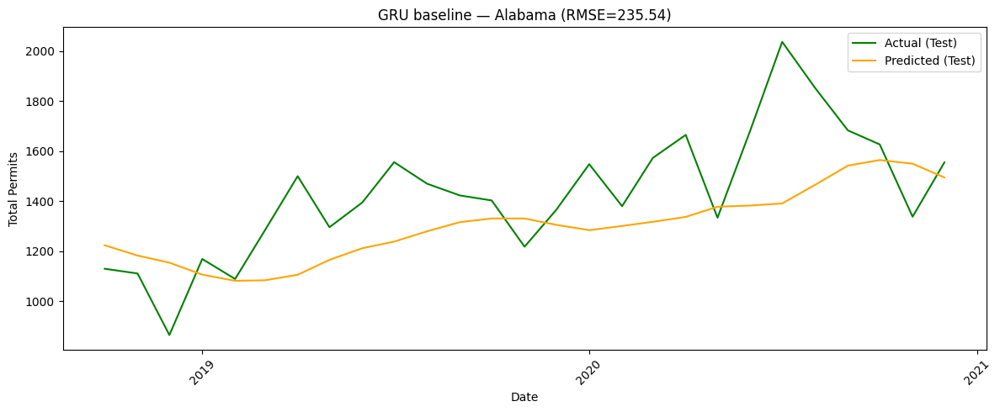


GRU baseline for Arizona


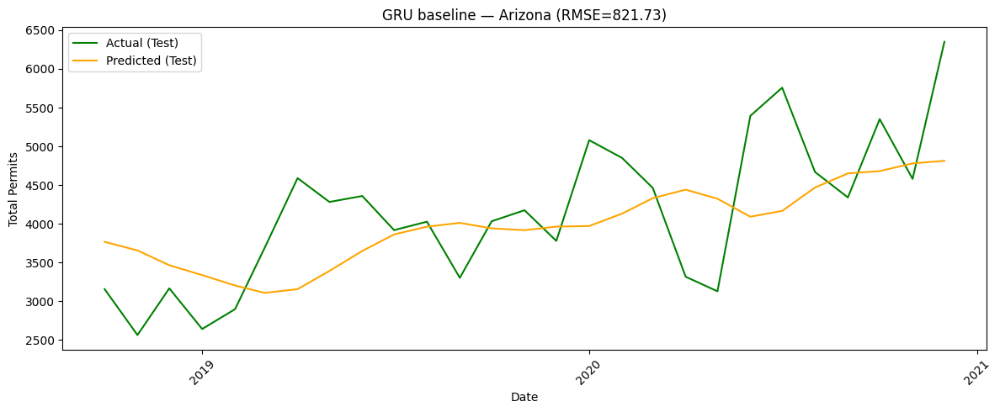


GRU baseline for Arkansas


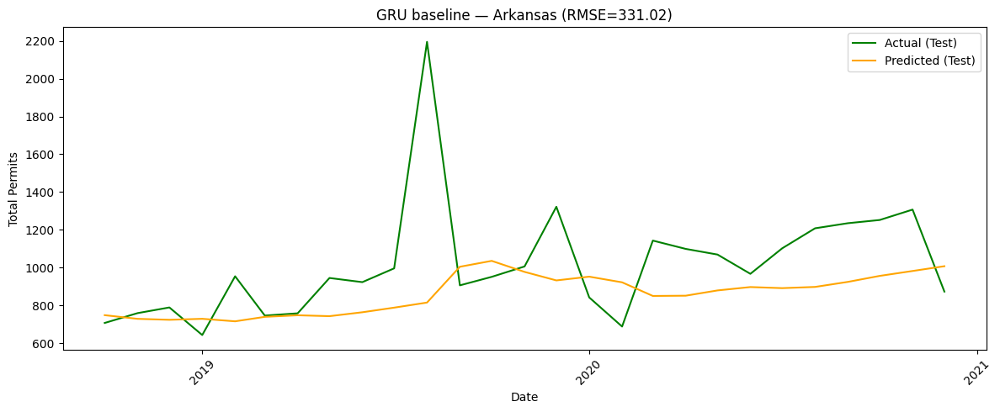


GRU baseline for Colorado


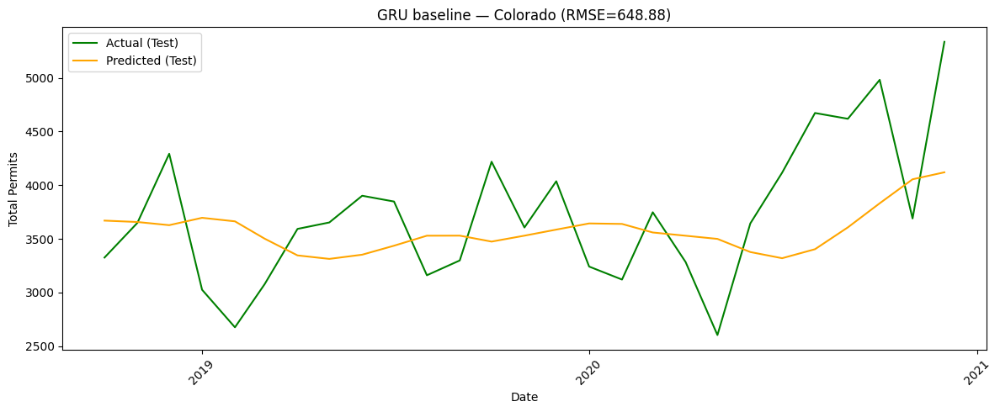


GRU baseline for Delaware


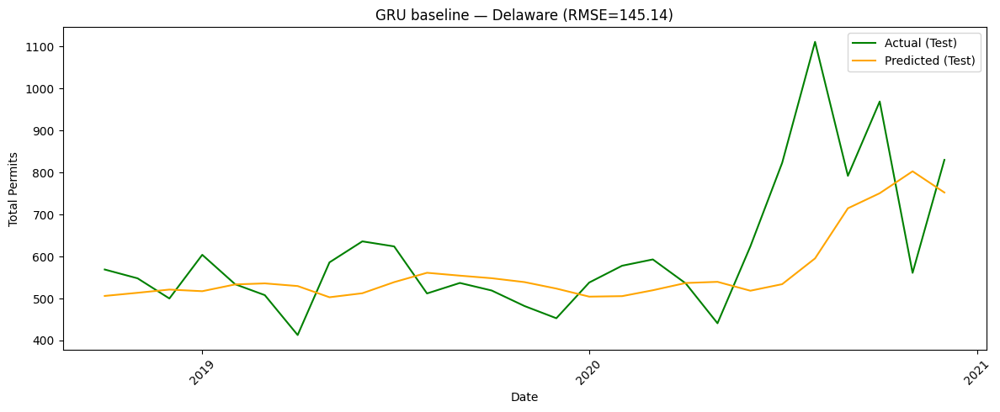


GRU baseline for Georgia


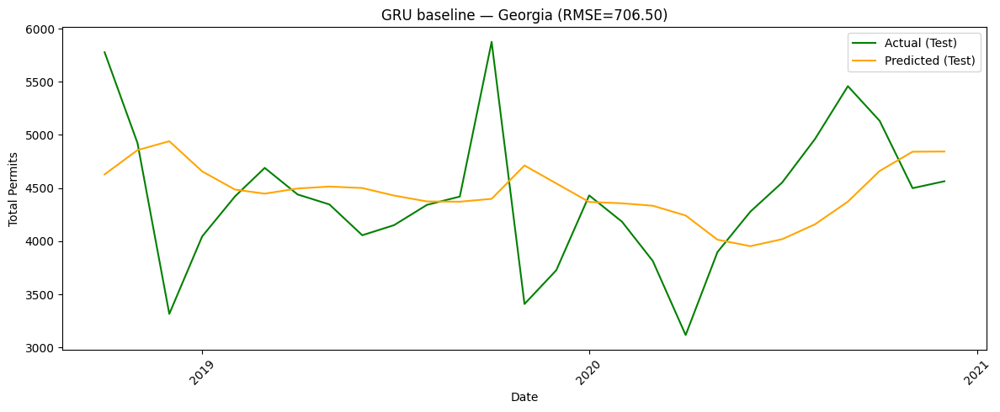


GRU baseline for Iowa


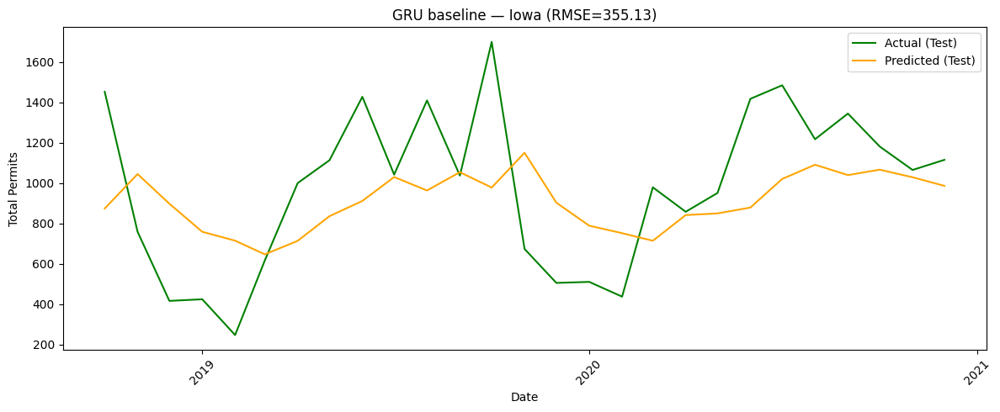


GRU baseline for New York


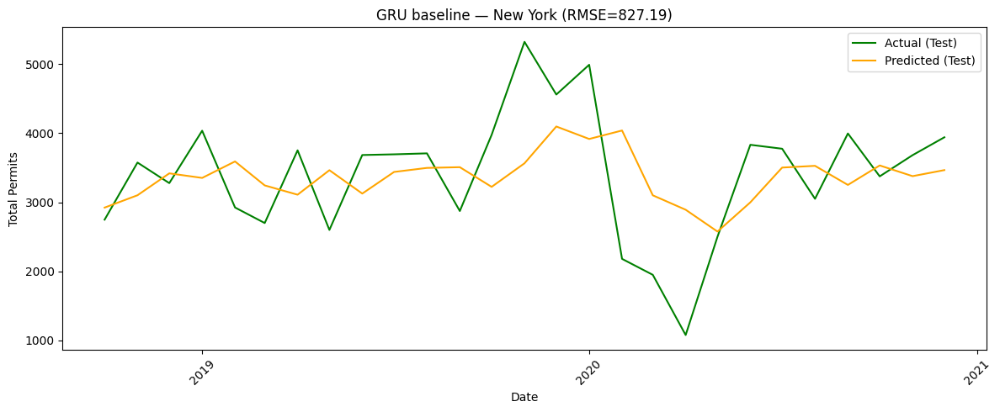


GRU baseline for Ohio


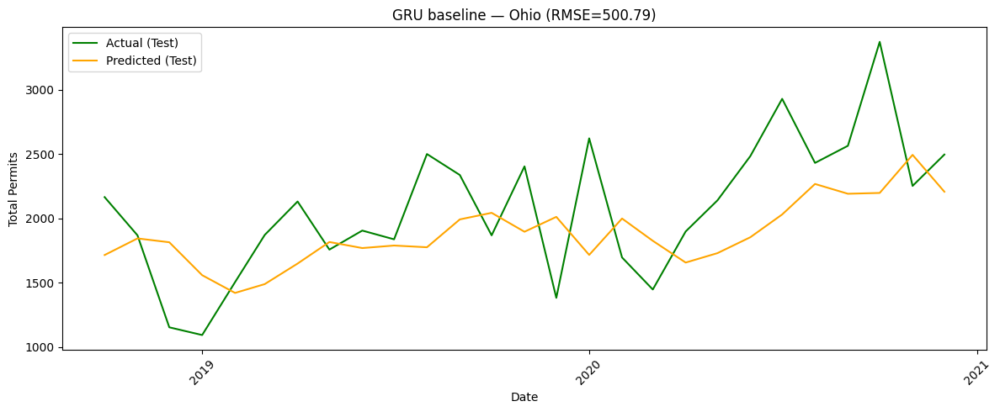


GRU baseline for Oklahoma


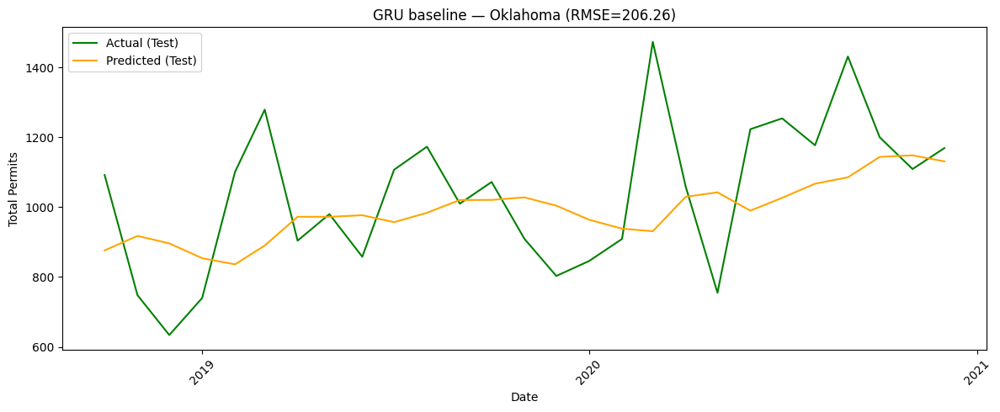

      state        rmse
0   Alabama  235.539565
1   Arizona  821.726961
2  Arkansas  331.022744
3  Colorado  648.882963
4  Delaware  145.136373
5   Georgia  706.497024
6      Iowa  355.129121
7  New York  827.187551
8      Ohio  500.794778
9  Oklahoma  206.263040


In [16]:
# ============================================================
# Baseline GRU
# ============================================================

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import mean_squared_error
import tensorflow as tf

n_steps = 12
gru_baseline = []

# ----------------------------
# Function to create sequences
# ----------------------------
def create_sequences(data, n_steps):
    X, y = [], []
    for i in range(len(data) - n_steps):
        X.append(data[i:i+n_steps])
        y.append(data[i+n_steps])
    return np.array(X), np.array(y)

# ----------------------------
# Function to plot test vs predicted
# ----------------------------
def plot_test_pred(dates, y_test, y_pred, title="Test vs Predicted"):
    plt.figure(figsize=(12,5))

    plt.plot(dates, y_test, label="Actual (Test)", color='green')
    plt.plot(dates, y_pred, label="Predicted (Test)", color='orange')

    plt.title(title)
    plt.xlabel("Date")
    plt.ylabel("Total Permits")
    plt.legend()
    plt.gca().xaxis.set_major_locator(mdates.YearLocator())
    plt.gca().xaxis.set_major_formatter(mdates.DateFormatter("%Y"))
    plt.xticks(rotation=45)
    plt.tight_layout()
    plt.show()

# ----------------------------
# Loop over selected states
# ----------------------------
for state in selected_states:
    print(f"\nGRU baseline for {state}")

    s = df_state_monthly_filtered[df_state_monthly_filtered['Name'] == state].sort_values('Period.full')
    dates = pd.to_datetime(s['Period.full']).values
    series = s['total_permits'].values.astype(float)

    if len(series) < n_steps + 6:
        print(f"  Skipping {state} — not enough data ({len(series)} timesteps).")
        continue

    # Scale data
    scaler = MinMaxScaler()
    scaled = scaler.fit_transform(series.reshape(-1,1))

    # Create sequences
    X, y = create_sequences(scaled.flatten(), n_steps)
    X = X.reshape((X.shape[0], X.shape[1], 1))

    # Train/Test split (80/20)
    split = int(len(X) * 0.8)
    X_train, X_test = X[:split], X[split:]
    y_train, y_test = y[:split], y[split:]

    # Build GRU model
    model = tf.keras.Sequential([
        tf.keras.layers.Input(shape=(n_steps,1)),
        tf.keras.layers.GRU(64, activation='tanh'),
        tf.keras.layers.Dense(1)
    ])
    model.compile(optimizer='adam', loss='mse')
    model.fit(X_train, y_train, epochs=20, batch_size=16, verbose=0)

    # Predict on test
    y_pred = model.predict(X_test, verbose=0)
    y_pred_inv = scaler.inverse_transform(y_pred)
    y_test_inv = scaler.inverse_transform(y_test.reshape(-1,1))
    rmse = np.sqrt(mean_squared_error(y_test_inv, y_pred_inv))
    gru_baseline.append({'state': state, 'rmse': float(rmse)})

    # Test period dates
    test_dates = dates[split + n_steps:]

    # Plot only test vs predicted
    plot_test_pred(test_dates, y_test_inv.flatten(), y_pred_inv.flatten(),
                   title=f"GRU baseline — {state} (RMSE={rmse:.2f})")

# ----------------------------
# Convert results to DataFrame
# ----------------------------
gru_baseline_df = pd.DataFrame(gru_baseline)
print(gru_baseline_df)



TCN baseline for Alabama


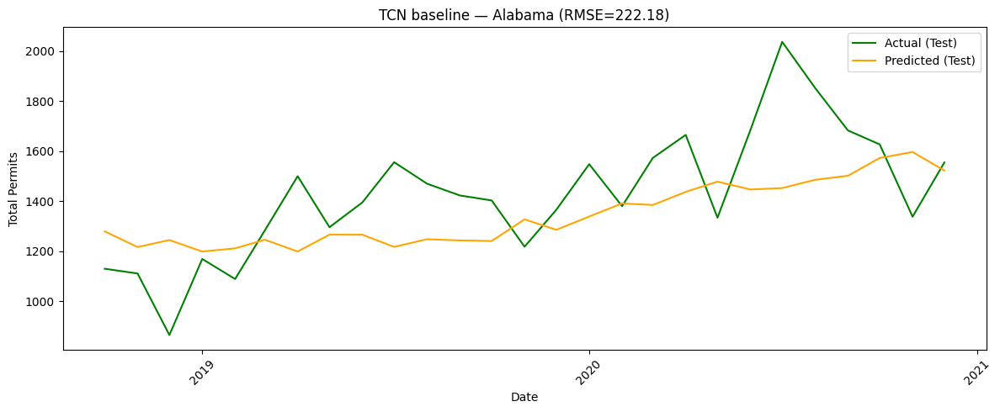


TCN baseline for Arizona


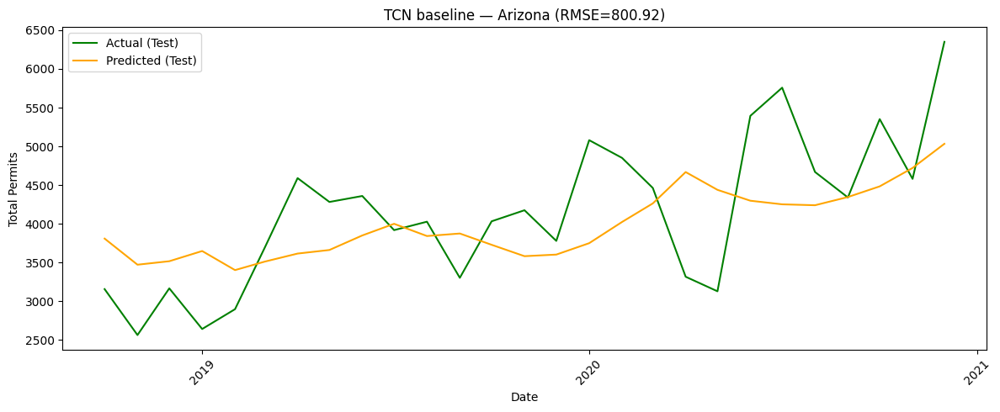


TCN baseline for Arkansas


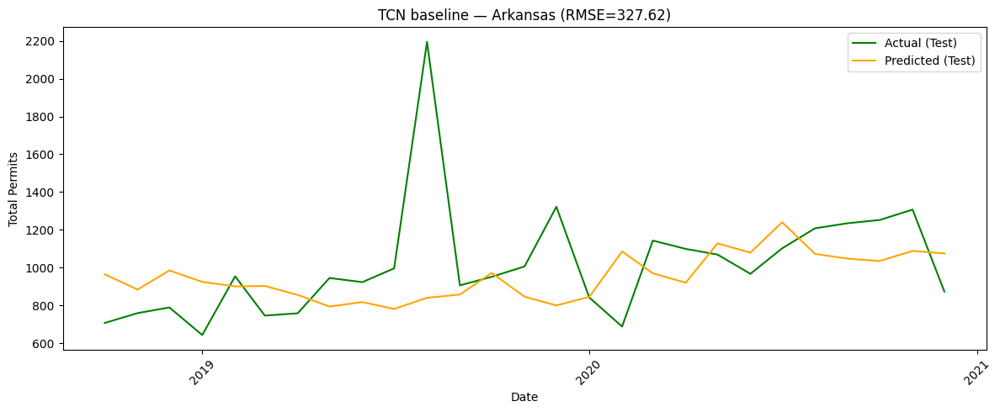


TCN baseline for Colorado


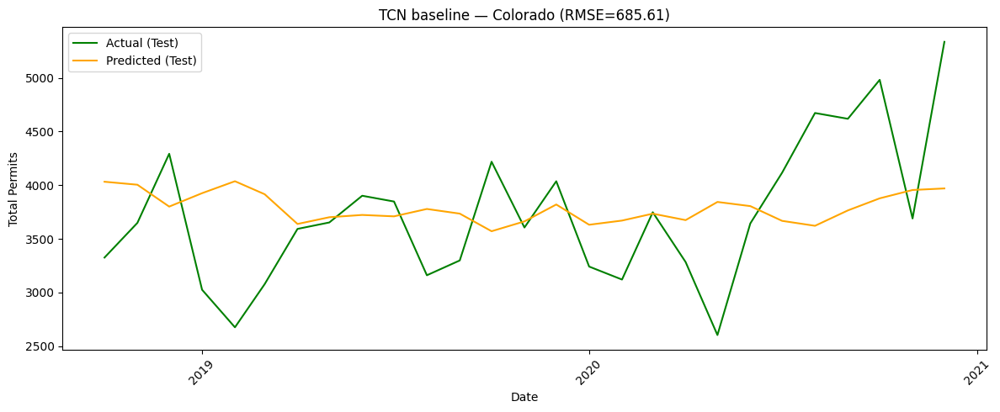


TCN baseline for Delaware


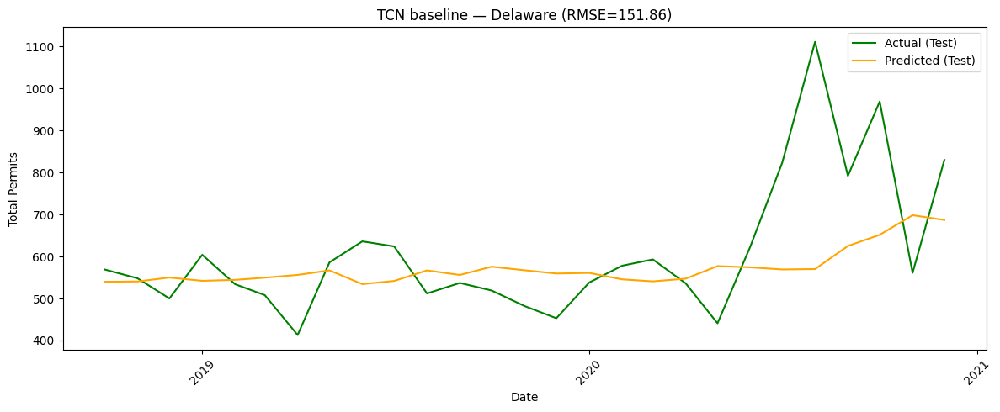


TCN baseline for Georgia


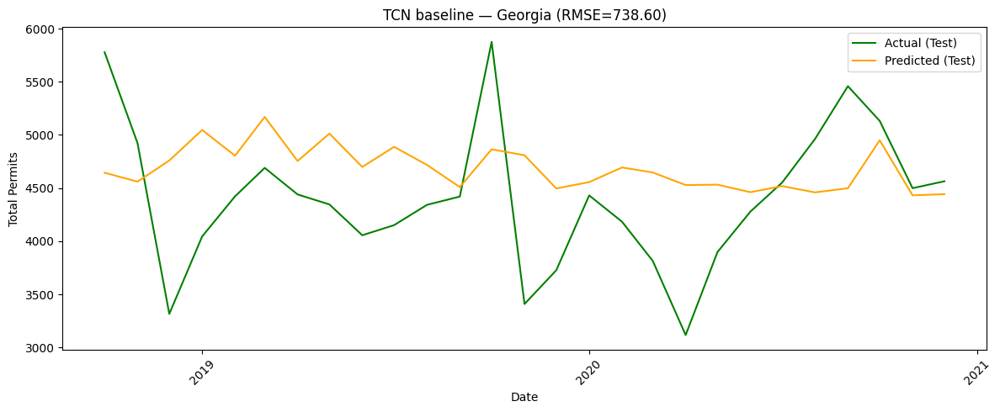


TCN baseline for Iowa


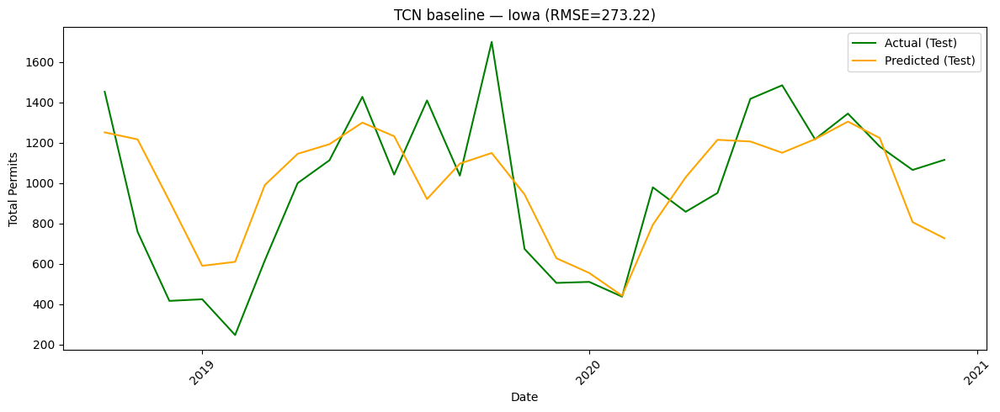


TCN baseline for New York


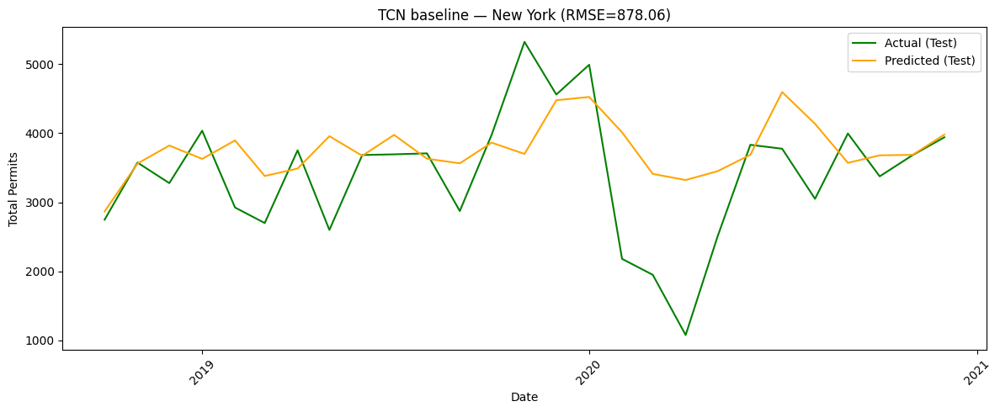


TCN baseline for Ohio


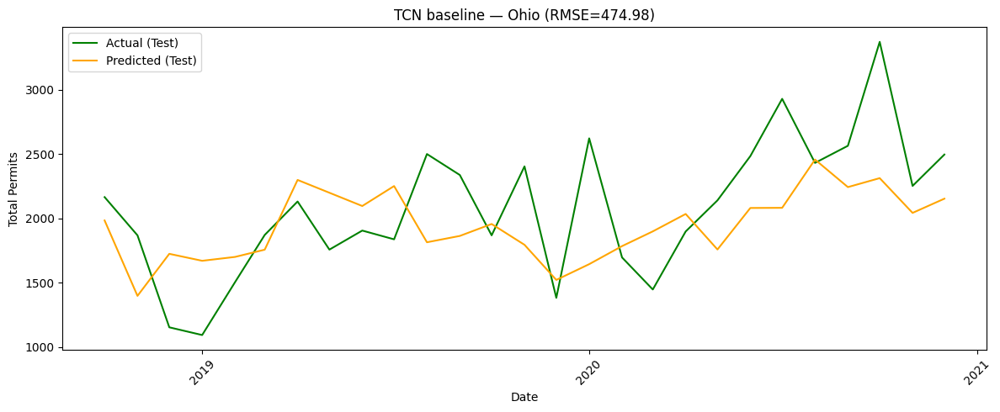


TCN baseline for Oklahoma


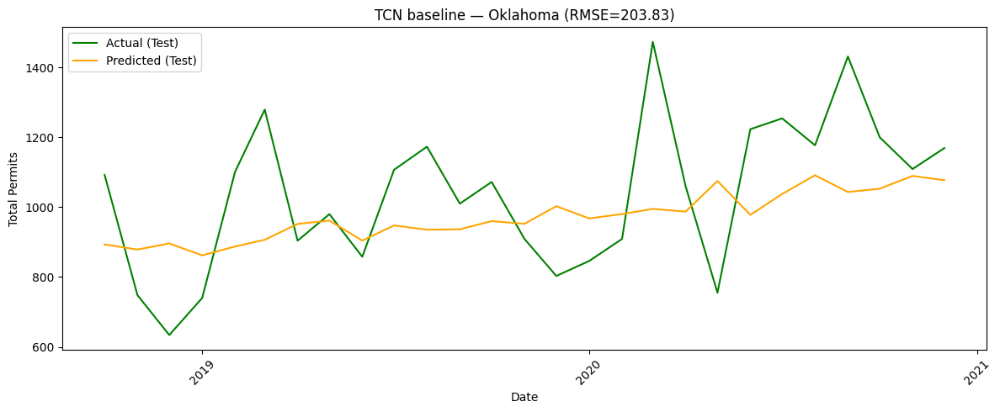

      state        rmse
0   Alabama  222.179490
1   Arizona  800.923547
2  Arkansas  327.619859
3  Colorado  685.612907
4  Delaware  151.861395
5   Georgia  738.599907
6      Iowa  273.215641
7  New York  878.062436
8      Ohio  474.983205
9  Oklahoma  203.827300


In [17]:
# ============================================================
# Baseline TCN
# ============================================================

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import mean_squared_error
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense
from tensorflow.keras.layers import Conv1D, Flatten

n_steps = 12
tcn_baseline = []

# ----------------------------
# Function to create sequences
# ----------------------------
def create_sequences(data, n_steps):
    X, y = [], []
    for i in range(len(data) - n_steps):
        X.append(data[i:i+n_steps])
        y.append(data[i+n_steps])
    return np.array(X), np.array(y)

# ----------------------------
# Function to plot test vs predicted
# ----------------------------
def plot_test_pred(dates, y_test, y_pred, title="Test vs Predicted"):
    plt.figure(figsize=(12,5))

    plt.plot(dates, y_test, label="Actual (Test)", color='green')
    plt.plot(dates, y_pred, label="Predicted (Test)", color='orange')

    plt.title(title)
    plt.xlabel("Date")
    plt.ylabel("Total Permits")
    plt.legend()
    plt.gca().xaxis.set_major_locator(mdates.YearLocator())
    plt.gca().xaxis.set_major_formatter(mdates.DateFormatter("%Y"))
    plt.xticks(rotation=45)
    plt.tight_layout()
    plt.show()

# ----------------------------
# Loop over selected states
# ----------------------------
for state in selected_states:
    print(f"\nTCN baseline for {state}")

    s = df_state_monthly_filtered[df_state_monthly_filtered['Name'] == state].sort_values('Period.full')
    dates = pd.to_datetime(s['Period.full']).values
    series = s['total_permits'].values.astype(float)

    if len(series) < n_steps + 6:
        print(f"  Skipping {state} — not enough data ({len(series)} timesteps).")
        continue

    # Scale data
    scaler = MinMaxScaler()
    scaled = scaler.fit_transform(series.reshape(-1,1))

    # Create sequences
    X, y = create_sequences(scaled.flatten(), n_steps)
    X = X.reshape((X.shape[0], X.shape[1], 1))

    # Train/Test split (80/20)
    split = int(len(X) * 0.8)
    X_train, X_test = X[:split], X[split:]
    y_train, y_test = y[:split], y[split:]

    # Build simple TCN-like 1D CNN
    model = Sequential([
        tf.keras.layers.Input(shape=(n_steps,1)),
        Conv1D(filters=64, kernel_size=3, activation='relu', padding='causal'),
        Flatten(),
        Dense(1)
    ])
    model.compile(optimizer='adam', loss='mse')
    model.fit(X_train, y_train, epochs=20, batch_size=16, verbose=0)

    # Predict on test
    y_pred = model.predict(X_test, verbose=0)
    y_pred_inv = scaler.inverse_transform(y_pred)
    y_test_inv = scaler.inverse_transform(y_test.reshape(-1,1))
    rmse = np.sqrt(mean_squared_error(y_test_inv, y_pred_inv))
    tcn_baseline.append({'state': state, 'rmse': float(rmse)})

    # Test period dates
    test_dates = dates[split + n_steps:]

    # Plot only test vs predicted
    plot_test_pred(test_dates, y_test_inv.flatten(), y_pred_inv.flatten(),
                   title=f"TCN baseline — {state} (RMSE={rmse:.2f})")

# ----------------------------
# Convert results to DataFrame
# ----------------------------
tcn_baseline_df = pd.DataFrame(tcn_baseline)
print(tcn_baseline_df)


SARIMA baseline for Alabama


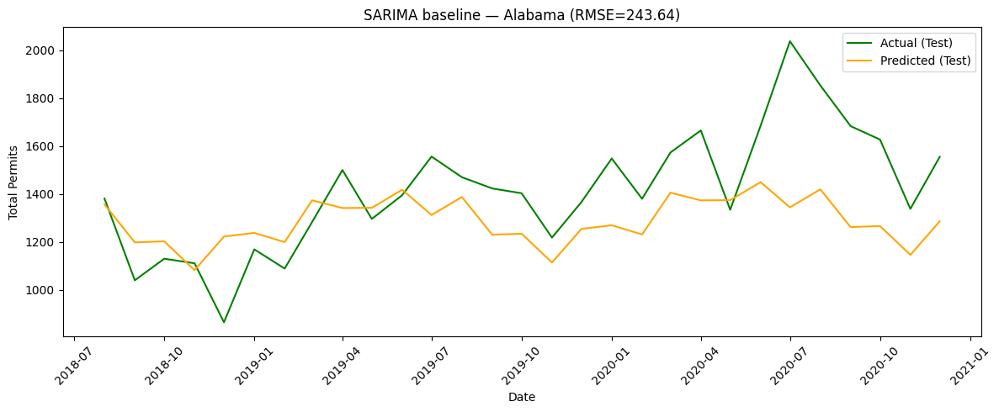


SARIMA baseline for Arizona


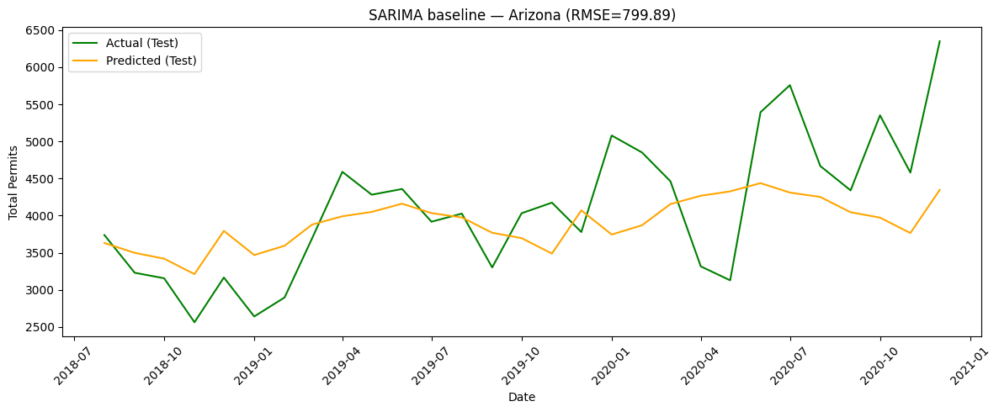


SARIMA baseline for Arkansas


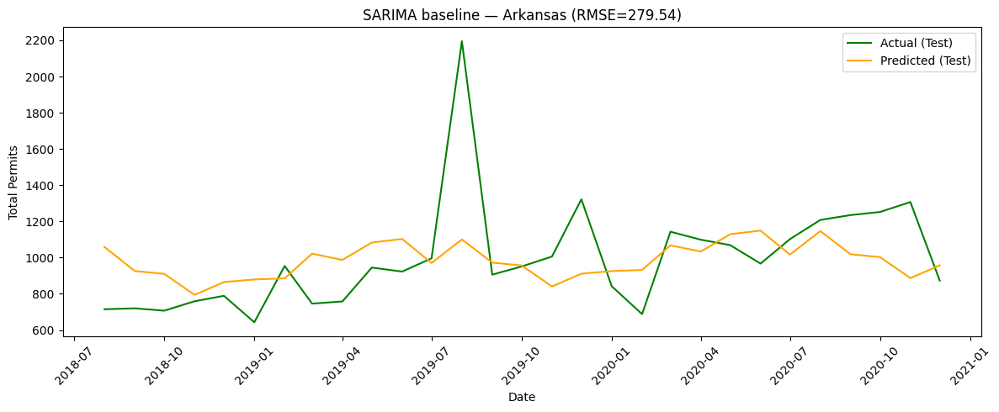


SARIMA baseline for Colorado


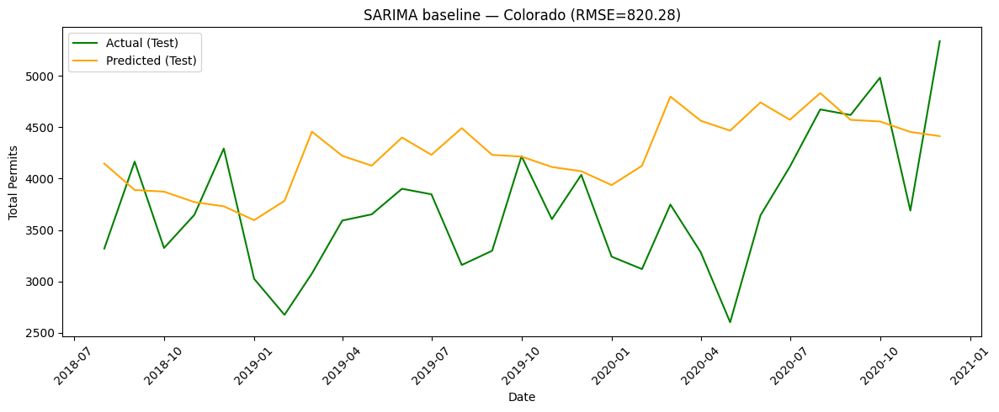


SARIMA baseline for Delaware


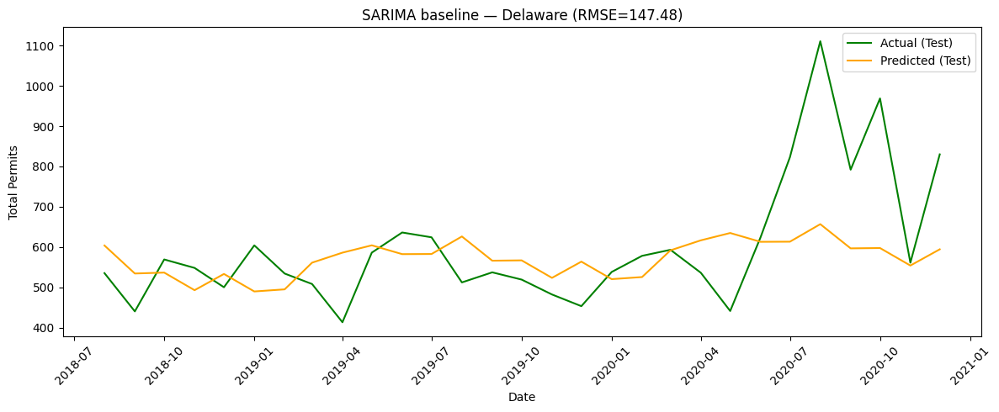


SARIMA baseline for Georgia


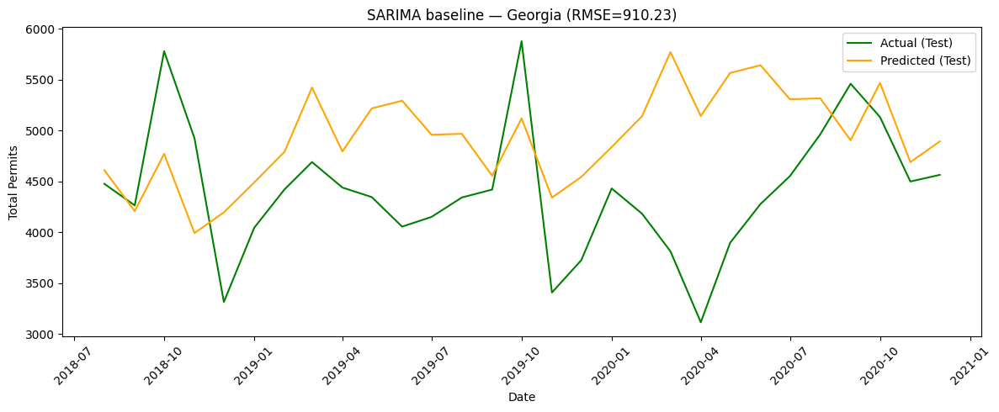


SARIMA baseline for Iowa


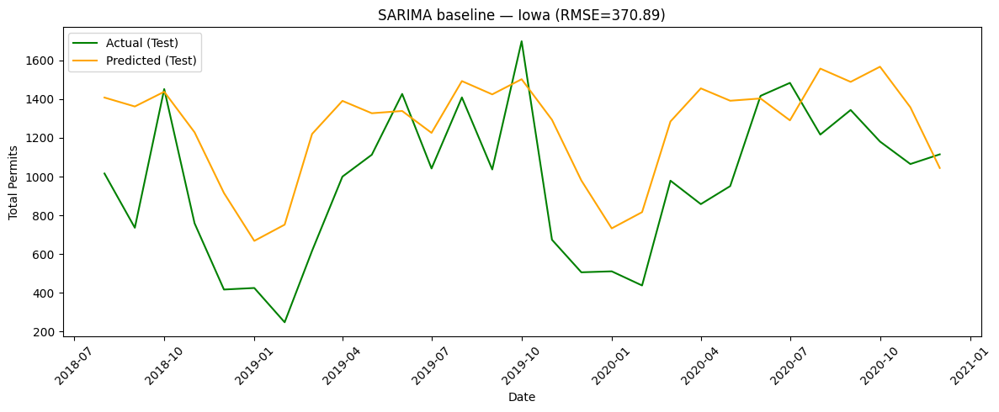


SARIMA baseline for New York


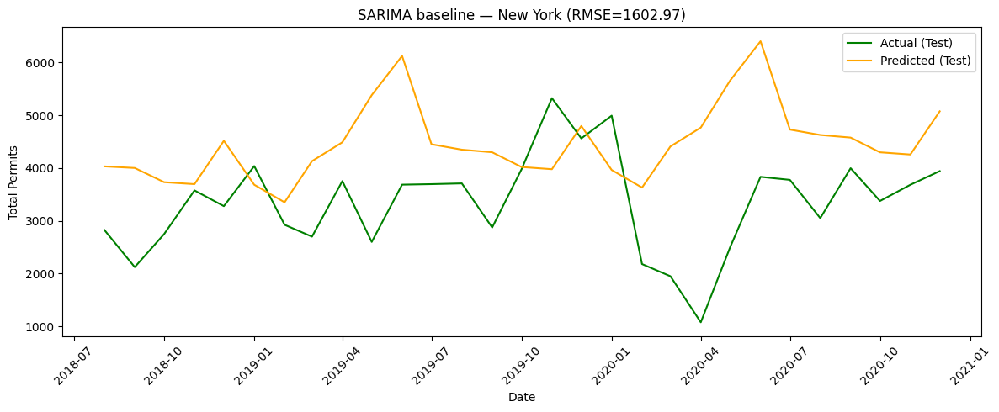


SARIMA baseline for Ohio


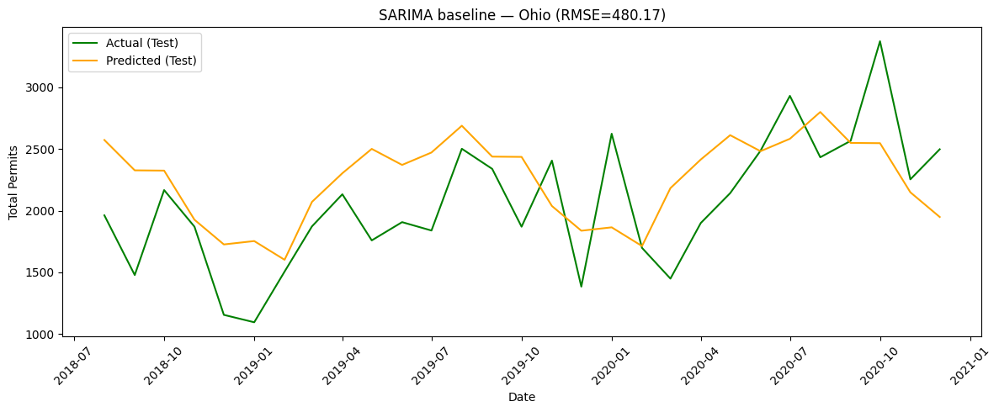


SARIMA baseline for Oklahoma


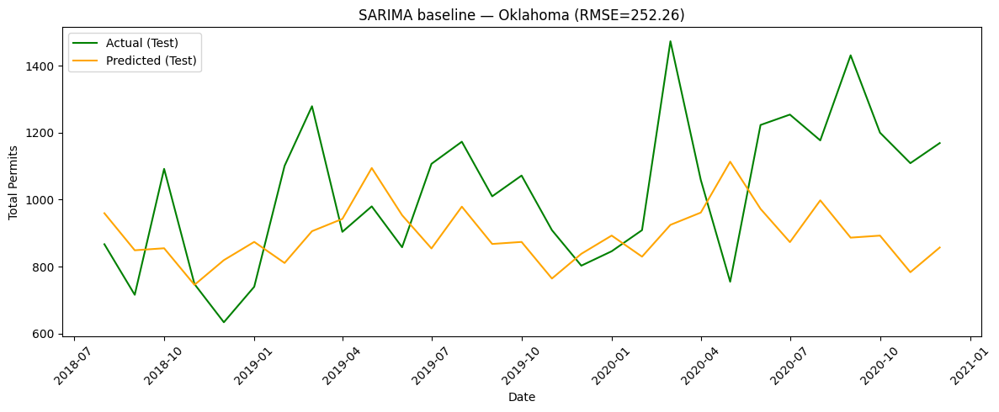

      state         rmse
0   Alabama   243.641014
1   Arizona   799.889839
2  Arkansas   279.538708
3  Colorado   820.284276
4  Delaware   147.484681
5   Georgia   910.230592
6      Iowa   370.887786
7  New York  1602.966987
8      Ohio   480.172265
9  Oklahoma   252.260852


In [18]:
# ============================================================
# Baseline SARIMA
# ============================================================

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.metrics import mean_squared_error

sarima_baseline = []

use_pmdarima = True
try:
    import pmdarima as pm
except Exception:
    use_pmdarima = False
    import statsmodels.api as sm

# ----------------------------
# Function to plot test vs predicted
# ----------------------------
def plot_test_pred_sarima(dates, y_test, y_pred, title="SARIMA Test vs Predicted"):
    plt.figure(figsize=(12,5))
    plt.plot(dates, y_test, label="Actual (Test)", color='green')
    plt.plot(dates, y_pred, label="Predicted (Test)", color='orange')
    plt.title(title)
    plt.xlabel("Date")
    plt.ylabel("Total Permits")
    plt.legend()
    plt.xticks(rotation=45)
    plt.tight_layout()
    plt.show()

# ----------------------------
# Loop over selected states
# ----------------------------
for state in selected_states:
    print(f"\nSARIMA baseline for {state}")

    s = df_state_monthly_filtered[df_state_monthly_filtered['Name'] == state].sort_values('Period.full')
    dates = pd.to_datetime(s['Period.full']).values
    series = s['total_permits'].values.astype(float)

    if len(series) < 36:
        print(f"  Skipping {state} — need >=36 timesteps for SARIMA, found {len(series)}")
        continue

    # Train/test split 80/20
    train_size = int(len(series) * 0.8)
    y_train, y_test = series[:train_size], series[train_size:]
    test_dates = dates[train_size:]

    if use_pmdarima:
        stepwise = pm.auto_arima(y_train, start_p=0, start_q=0, max_p=3, max_q=3,
                                 seasonal=True, m=12, start_P=0, start_Q=0, max_P=2, max_Q=2,
                                 d=None, D=None, trace=False, error_action='ignore',
                                 suppress_warnings=True, stepwise=True)
        preds = stepwise.predict(n_periods=len(y_test))
        order_selected = stepwise.order
        seasonal_selected = stepwise.seasonal_order
        print(f"  Selected SARIMA order {order_selected} seasonal {seasonal_selected}")
    else:
        model = sm.tsa.SARIMAX(y_train, order=(1,1,1), seasonal_order=(0,1,1,12),
                               enforce_stationarity=False, enforce_invertibility=False)
        res = model.fit(disp=False)
        preds = res.predict(start=len(y_train), end=len(y_train)+len(y_test)-1)

    rmse = np.sqrt(mean_squared_error(y_test, preds))
    sarima_baseline.append({'state': state, 'rmse': float(rmse)})

    # Plot only test vs predicted
    plot_test_pred_sarima(test_dates, y_test, preds,
                          title=f"SARIMA baseline — {state} (RMSE={rmse:.2f})")

# ----------------------------
# Convert results to DataFrame
# ----------------------------
sarima_baseline_df = pd.DataFrame(sarima_baseline)
print(sarima_baseline_df)



In [19]:
# ============================================================
# Compare RMSE across models (excluding LSTM) with combined Best column
# ============================================================

import pandas as pd

# Merge all RMSEs into a single DataFrame, excluding LSTM
comparison_df = rnn_baseline_df.rename(columns={'rmse': 'RNN'}).merge(
    gru_baseline_df.rename(columns={'rmse': 'GRU'}), on='state'
).merge(
    tcn_baseline_df.rename(columns={'rmse': 'TCN'}), on='state'
).merge(
    sarima_baseline_df.rename(columns={'rmse': 'SARIMA'}), on='state'
)

# Find best model and RMSE
best_model_series = comparison_df[['RNN','GRU','TCN','SARIMA']].idxmin(axis=1)
best_rmse_series = comparison_df[['RNN','GRU','TCN','SARIMA']].min(axis=1)

# Create combined column
comparison_df['Best'] = best_rmse_series.round(2).astype(str) + " (" + best_model_series + ")"

# Optional: reorder columns for clarity
cols = ['state', 'RNN', 'GRU', 'TCN', 'SARIMA', 'Best']
comparison_df = comparison_df[cols]

print("RMSE comparison across models (excluding LSTM) with Best combined:")
print(comparison_df)

# Overall best model across states (average RMSE, excluding LSTM)
avg_rmse = comparison_df[['RNN','GRU','TCN','SARIMA']].mean()
overall_best_model = avg_rmse.idxmin()
print(f"\nOverall best model across selected states (by average RMSE, excluding LSTM): {overall_best_model}")



RMSE comparison across models (excluding LSTM) with Best combined:
      state         RNN         GRU         TCN       SARIMA             Best
0   Alabama  225.860317  235.539565  222.179490   243.641014     222.18 (TCN)
1   Arizona  993.736013  821.726961  800.923547   799.889839  799.89 (SARIMA)
2  Arkansas  350.966089  331.022744  327.619859   279.538708  279.54 (SARIMA)
3  Colorado  711.795136  648.882963  685.612907   820.284276     648.88 (GRU)
4  Delaware  182.817943  145.136373  151.861395   147.484681     145.14 (GRU)
5   Georgia  682.399957  706.497024  738.599907   910.230592      682.4 (RNN)
6      Iowa  269.736044  355.129121  273.215641   370.887786     269.74 (RNN)
7  New York  964.301030  827.187551  878.062436  1602.966987     827.19 (GRU)
8      Ohio  497.980027  500.794778  474.983205   480.172265     474.98 (TCN)
9  Oklahoma  195.850584  206.263040  203.827300   252.260852     195.85 (RNN)

Overall best model across selected states (by average RMSE, excluding LSTM

In [20]:
# ============================================================
# TCN HPO for Best Model
# ============================================================

!pip install keras-tuner --upgrade

import numpy as np
import pandas as pd
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv1D, Dense, Flatten
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import mean_squared_error
import keras_tuner as kt

# Number of timesteps
n_steps = 12

# ----------------------------
# Function to create sequences
# ----------------------------
def create_sequences(data, n_steps):
    X, y = [], []
    for i in range(len(data) - n_steps):
        X.append(data[i:i+n_steps])
        y.append(data[i+n_steps])
    return np.array(X), np.array(y)

# ----------------------------
# Hypermodel definition
# ----------------------------
def build_tcn_model(hp):
    model = Sequential()
    model.add(tf.keras.layers.Input(shape=(n_steps,1)))
    filters = hp.Int('filters', min_value=32, max_value=128, step=32)
    kernel_size = hp.Int('kernel_size', min_value=2, max_value=5, step=1)
    model.add(Conv1D(filters=filters, kernel_size=kernel_size, activation='relu', padding='causal'))
    model.add(Flatten())
    model.add(Dense(1))
    learning_rate = hp.Choice('learning_rate', [1e-2, 1e-3, 1e-4])
    model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=learning_rate), loss='mse')
    return model

# ----------------------------
# Loop over selected states
# ----------------------------
tcn_hpo_results = []

for state in selected_states:
    print(f"\nHPO TCN for {state}")

    s = df_state_monthly_filtered[df_state_monthly_filtered['Name'] == state].sort_values('Period.full')
    series = s['total_permits'].values.astype(float)

    if len(series) < n_steps + 6:
        print(f"  Skipping {state} — not enough data ({len(series)} timesteps).")
        continue

    # Scale data
    scaler = MinMaxScaler()
    scaled = scaler.fit_transform(series.reshape(-1,1))

    # Create sequences
    X, y = create_sequences(scaled.flatten(), n_steps)
    X = X.reshape((X.shape[0], X.shape[1], 1))

    # Train/Test split
    split = int(len(X) * 0.8)
    X_train, X_test = X[:split], X[split:]
    y_train, y_test = y[:split], y[split:]

    # ----------------------------
    # Keras Tuner
    # ----------------------------
    tuner = kt.RandomSearch(
        build_tcn_model,
        objective='val_loss',
        max_trials=10,
        executions_per_trial=1,
        overwrite=True,
        directory='tcn_hpo',
        project_name=f'tcn_{state}'
    )

    tuner.search(X_train, y_train, epochs=20, batch_size=16, validation_split=0.2, verbose=0)

    best_model = tuner.get_best_models(num_models=1)[0]

    # Predict on test
    y_pred = best_model.predict(X_test, verbose=0)
    y_pred_inv = scaler.inverse_transform(y_pred)
    y_test_inv = scaler.inverse_transform(y_test.reshape(-1,1))
    rmse = np.sqrt(mean_squared_error(y_test_inv, y_pred_inv))

    tcn_hpo_results.append({'state': state, 'rmse': float(rmse)})

# ----------------------------
# Convert to DataFrame
# ----------------------------
tcn_hpo_df = pd.DataFrame(tcn_hpo_results)
print("\nTCN after HPO results:")
print(tcn_hpo_df)



HPO TCN for Alabama


/usr/local/lib/python3.12/dist-packages/keras/src/saving/saving_lib.py:802: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 10 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))



HPO TCN for Arizona


/usr/local/lib/python3.12/dist-packages/keras/src/saving/saving_lib.py:802: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 10 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))



HPO TCN for Arkansas


/usr/local/lib/python3.12/dist-packages/keras/src/saving/saving_lib.py:802: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 10 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))



HPO TCN for Colorado


/usr/local/lib/python3.12/dist-packages/keras/src/saving/saving_lib.py:802: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 10 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))



HPO TCN for Delaware


KeyboardInterrupt: 

In [ ]:
# ============================================================
# TCN HPO for Best Model (excluding certain states)                 TO BE WORKED ON
# ============================================================

!pip install -q keras-tuner # Install keras-tuner quietly

import numpy as np
import pandas as pd
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv1D, Dense, Flatten
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import mean_squared_error
import keras_tuner as kt

# Number of timesteps
n_steps = 12

# States to exclude
exclude_states = ['Rhode Island', 'Alaska', 'Wyoming', 'Texas', 'California', 'Florida']

# Re-define selected_states here to ensure it's available
# This assumes df_state_monthly_filtered exists from previous cells.
# If not, it would also need to be re-run.
# For consistency with the previous cell where selected_states was defined,
# I'll directly copy the example list that was assigned to selected_states.

all_unique_states = df_state_monthly_filtered['Name'].unique().tolist()
hpo_states = [s for s in all_unique_states if s not in exclude_states]

# ----------------------------
# Function to create sequences
# ----------------------------
def create_sequences(data, n_steps):
    X, y = [], []
    for i in range(len(data) - n_steps):
        X.append(data[i:i+n_steps])
        y.append(data[i+n_steps])
    return np.array(X), np.array(y)

# ----------------------------
# Hypermodel definition
# ----------------------------
def build_tcn_model(hp):
    model = Sequential()
    model.add(tf.keras.layers.Input(shape=(n_steps,1)))
    filters = hp.Int('filters', min_value=32, max_value=128, step=32)
    kernel_size = hp.Int('kernel_size', min_value=2, max_value=5, step=1)
    model.add(Conv1D(filters=filters, kernel_size=kernel_size, activation='relu', padding='causal'))
    model.add(Flatten())
    model.add(Dense(1))
    learning_rate = hp.Choice('learning_rate', [1e-2, 1e-3, 1e-4])
    model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=learning_rate), loss='mse')
    return model

# ----------------------------
# Loop over states for HPO
# ----------------------------
tcn_hpo_results = []

for state in hpo_states:
    print(f"\nHPO TCN for {state}")

    # Ensure df_state_monthly_filtered is available. Assuming it was created in a prior cell.
    # If not, the data loading and filtering logic would need to be added here.
    s = df_state_monthly_filtered[df_state_monthly_filtered['Name'] == state].sort_values('Period.full')
    series = s['total_permits'].values.astype(float)

    if len(series) < n_steps + 6:
        print(f"  Skipping {state} — not enough data ({len(series)} timesteps).")
        continue

    # Scale data
    scaler = MinMaxScaler()
    scaled = scaler.fit_transform(series.reshape(-1,1))

    # Create sequences
    X, y = create_sequences(scaled.flatten(), n_steps)
    X = X.reshape((X.shape[0], X.shape[1], 1))

    # Train/Test split
    split = int(len(X) * 0.8)
    X_train, X_test = X[:split], X[split:]
    y_train, y_test = y[:split], y[split:]

    # ----------------------------
    # Keras Tuner
    # ----------------------------
    tuner = kt.RandomSearch(
        build_tcn_model,
        objective='val_loss',
        max_trials=10,
        executions_per_trial=1,
        overwrite=True,
        directory='tcn_hpo',
        project_name=f'tcn_{state}'
    )

    tuner.search(X_train, y_train, epochs=20, batch_size=16, validation_split=0.2, verbose=0)

    best_model = tuner.get_best_models(num_models=1)[0]

    # Predict on test
    y_pred = best_model.predict(X_test, verbose=0)
    y_pred_inv = scaler.inverse_transform(y_pred)
    y_test_inv = scaler.inverse_transform(y_test.reshape(-1,1))
    rmse = np.sqrt(mean_squared_error(y_test_inv, y_pred_inv))

    tcn_hpo_results.append({'state': state, 'rmse': float(rmse)})

# ----------------------------
# Convert to DataFrame
# ----------------------------
tcn_hpo_df = pd.DataFrame(tcn_hpo_results)
print("\nTCN after HPO results (excluding excluded states):")
print(tcn_hpo_df)


HPO TCN for Alabama


/usr/local/lib/python3.12/dist-packages/keras/src/saving/saving_lib.py:802: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 10 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))



HPO TCN for Arizona


/usr/local/lib/python3.12/dist-packages/keras/src/saving/saving_lib.py:802: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 10 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))



HPO TCN for Arkansas


/usr/local/lib/python3.12/dist-packages/keras/src/saving/saving_lib.py:802: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 10 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))



HPO TCN for Colorado


/usr/local/lib/python3.12/dist-packages/keras/src/saving/saving_lib.py:802: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 10 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))



HPO TCN for Connecticut


/usr/local/lib/python3.12/dist-packages/keras/src/saving/saving_lib.py:802: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 10 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))



HPO TCN for Delaware


/usr/local/lib/python3.12/dist-packages/keras/src/saving/saving_lib.py:802: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 10 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))



HPO TCN for District of Columbia


/usr/local/lib/python3.12/dist-packages/keras/src/saving/saving_lib.py:802: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 10 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))



HPO TCN for Georgia


/usr/local/lib/python3.12/dist-packages/keras/src/saving/saving_lib.py:802: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 10 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))



HPO TCN for Hawaii


/usr/local/lib/python3.12/dist-packages/keras/src/saving/saving_lib.py:802: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 10 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))



HPO TCN for Idaho


/usr/local/lib/python3.12/dist-packages/keras/src/saving/saving_lib.py:802: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 10 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))



HPO TCN for Illinois


/usr/local/lib/python3.12/dist-packages/keras/src/saving/saving_lib.py:802: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 10 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))



HPO TCN for Indiana


/usr/local/lib/python3.12/dist-packages/keras/src/saving/saving_lib.py:802: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 10 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))



HPO TCN for Iowa


/usr/local/lib/python3.12/dist-packages/keras/src/saving/saving_lib.py:802: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 10 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))



HPO TCN for Kansas


/usr/local/lib/python3.12/dist-packages/keras/src/saving/saving_lib.py:802: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 10 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))



HPO TCN for Kentucky


/usr/local/lib/python3.12/dist-packages/keras/src/saving/saving_lib.py:802: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 10 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))



HPO TCN for Louisiana


/usr/local/lib/python3.12/dist-packages/keras/src/saving/saving_lib.py:802: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 10 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))



HPO TCN for Maine


/usr/local/lib/python3.12/dist-packages/keras/src/saving/saving_lib.py:802: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 10 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))



HPO TCN for Maryland


/usr/local/lib/python3.12/dist-packages/keras/src/saving/saving_lib.py:802: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 10 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))



HPO TCN for Massachusetts


/usr/local/lib/python3.12/dist-packages/keras/src/saving/saving_lib.py:802: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 10 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))



HPO TCN for Michigan


/usr/local/lib/python3.12/dist-packages/keras/src/saving/saving_lib.py:802: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 10 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))



HPO TCN for Minnesota


/usr/local/lib/python3.12/dist-packages/keras/src/saving/saving_lib.py:802: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 10 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))



HPO TCN for Mississippi


/usr/local/lib/python3.12/dist-packages/keras/src/saving/saving_lib.py:802: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 10 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))



HPO TCN for Missouri


/usr/local/lib/python3.12/dist-packages/keras/src/saving/saving_lib.py:802: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 10 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))



HPO TCN for Montana


/usr/local/lib/python3.12/dist-packages/keras/src/saving/saving_lib.py:802: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 10 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))



HPO TCN for Nebraska


/usr/local/lib/python3.12/dist-packages/keras/src/saving/saving_lib.py:802: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 10 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))



HPO TCN for Nevada


/usr/local/lib/python3.12/dist-packages/keras/src/saving/saving_lib.py:802: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 10 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))



HPO TCN for New Hampshire


/usr/local/lib/python3.12/dist-packages/keras/src/saving/saving_lib.py:802: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 10 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))



HPO TCN for New Jersey


/usr/local/lib/python3.12/dist-packages/keras/src/saving/saving_lib.py:802: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 10 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))



HPO TCN for New Mexico


/usr/local/lib/python3.12/dist-packages/keras/src/saving/saving_lib.py:802: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 10 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))



HPO TCN for New York


/usr/local/lib/python3.12/dist-packages/keras/src/saving/saving_lib.py:802: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 10 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))



HPO TCN for North Carolina


/usr/local/lib/python3.12/dist-packages/keras/src/saving/saving_lib.py:802: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 10 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))



HPO TCN for North Dakota


/usr/local/lib/python3.12/dist-packages/keras/src/saving/saving_lib.py:802: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 10 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))



HPO TCN for Ohio


##**Permit Types**

###**RNN**

In [ ]:
import pandas as pd
import numpy as np
import tensorflow as tf
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import mean_squared_error

# Filter data strictly between 2009-01-01 and 2020-12-31
df_state_monthly_filtered = df_state_monthly[
    (df_state_monthly['Period.full'] >= pd.Timestamp('2009-01-01')) &
    (df_state_monthly['Period.full'] <= pd.Timestamp('2020-12-31'))
].copy()

n_steps = 12
epochs = 20
batch_size = 16

permit_types = [
    'Number of Permits.1 unit',
    'Number of Permits.2 units',
    'Number of Permits.3-4 units',
    'Number of Permits.5+ units'
]

selected_states = ['Alabama', 'Arizona', 'Arkansas', 'Ohio', 'Iowa', 'Colorado', 'Delaware', 'Georgia', 'New York', 'Oklahoma']

def create_sequences(data, n_steps=n_steps):
    X, y = [], []
    for i in range(len(data) - n_steps):
        X.append(data[i:i + n_steps])
        y.append(data[i + n_steps])
    return np.array(X), np.array(y)

results_rnn = []

for state in selected_states:
    print(f"\n🏗️ RNN Training for {state} (2009-2020) by permit type")
    state_data = df_state_monthly_filtered[df_state_monthly_filtered['Name'] == state].sort_values('Period.full')
    state_data['Period.full'] = pd.to_datetime(state_data['Period.full'])

    for permit in permit_types:
        values = state_data[permit].values.reshape(-1, 1)

        if len(values) < (n_steps + 1):
            print(f"Skipping {state} - {permit} due to insufficient data ({len(values)} rows).")
            continue

        scaler = MinMaxScaler()
        scaled = scaler.fit_transform(values)

        X, y = create_sequences(scaled, n_steps)
        X = X.reshape((X.shape[0], X.shape[1], 1))

        split = int(len(X) * 0.8)
        if split == 0:
            print(f"Not enough samples to split for {state} - {permit}, skipping.")
            continue

        X_train, X_test = X[:split], X[split:]
        y_train, y_test = y[:split], y[split:]

        model = tf.keras.Sequential([
            tf.keras.layers.SimpleRNN(64, activation='tanh', input_shape=(n_steps, 1)),
            tf.keras.layers.Dense(1)
        ])
        model.compile(optimizer='adam', loss='mse')

        model.fit(X_train, y_train, epochs=epochs, batch_size=batch_size, verbose=0)

        y_pred = model.predict(X_test)
        y_pred_inv = scaler.inverse_transform(y_pred)
        y_test_inv = scaler.inverse_transform(y_test.reshape(-1, 1))

        rmse = np.sqrt(mean_squared_error(y_test_inv, y_pred_inv))

        results_rnn.append({
            'state': state,
            'permit_type': permit,
            'rmse_rnn_2009_2020': rmse
        })

results_rnn_df = pd.DataFrame(results_rnn)  # Distinct DataFrame for RNN
print("RNN Results DataFrame:")
print(results_rnn_df)


###**TCN**

In [ ]:
import pandas as pd
import numpy as np
import tensorflow as tf
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import mean_squared_error
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
from tensorflow.keras.layers import Conv1D, Dense, Input, Lambda
from tensorflow.keras.models import Model

# Filter data strictly between 2009-01-01 and 2020-12-31
df_state_monthly_filtered = df_state_monthly[
    (df_state_monthly['Period.full'] >= pd.Timestamp('2009-01-01')) &
    (df_state_monthly['Period.full'] <= pd.Timestamp('2020-12-31'))
].copy()

n_steps = 12
epochs = 20
batch_size = 16

permit_types = [
    'Number of Permits.1 unit',
    'Number of Permits.2 units',
    'Number of Permits.3-4 units',
    'Number of Permits.5+ units'
]

selected_states = ['Alabama', 'Arizona', 'Arkansas', 'Ohio', 'Iowa', 'Colorado', 'Delaware', 'Georgia', 'New York', 'Oklahoma']

def create_sequences(data, n_steps=n_steps):
    X, y = [], []
    for i in range(len(data) - n_steps):
        X.append(data[i:i + n_steps])
        y.append(data[i + n_steps])
    return np.array(X), np.array(y)

def build_tcn_model(input_shape):
    # Temporal Convolutional Network architecture
    inputs = Input(shape=input_shape)

    # Dilated causal convolution block 1
    x = Conv1D(filters=64, kernel_size=2, dilation_rate=1, padding='causal', activation='relu')(inputs)

    # Dilated causal convolution block 2
    x = Conv1D(filters=64, kernel_size=2, dilation_rate=2, padding='causal', activation='relu')(x)

    # Dilated causal convolution block 3
    x = Conv1D(filters=64, kernel_size=2, dilation_rate=4, padding='causal', activation='relu')(x)

    # Select the last time step features for output
    def slice_last(x):
        return x[:, -1, :]

    x = Lambda(slice_last)(x)
    outputs = Dense(1)(x)

    model = Model(inputs=inputs, outputs=outputs)
    model.compile(optimizer='adam', loss='mse')
    return model

results_tcn = []

for state in selected_states:
    print(f"\n🏗️ TCN Training for {state} (2009-2020) by permit type")
    state_data = df_state_monthly_filtered[df_state_monthly_filtered['Name'] == state].sort_values('Period.full')
    state_data['Period.full'] = pd.to_datetime(state_data['Period.full'])

    for permit in permit_types:
        values = state_data[permit].values.reshape(-1, 1)

        if len(values) < (n_steps + 1):
            print(f"Skipping {state} - {permit} due to insufficient data ({len(values)} rows).")
            continue

        scaler = MinMaxScaler()
        scaled = scaler.fit_transform(values)

        X, y = create_sequences(scaled, n_steps)
        X = X.reshape((X.shape[0], X.shape[1], 1))

        split = int(len(X) * 0.8)
        if split == 0:
            print(f"Not enough samples to split for {state} - {permit}, skipping.")
            continue

        X_train, X_test = X[:split], X[split:]
        y_train, y_test = y[:split], y[split:]

        model = build_tcn_model(input_shape=(n_steps, 1))

        model.fit(X_train, y_train, epochs=epochs, batch_size=batch_size, verbose=0)

        y_pred = model.predict(X_test)
        y_pred_inv = scaler.inverse_transform(y_pred)
        y_test_inv = scaler.inverse_transform(y_test.reshape(-1, 1))

        rmse = np.sqrt(mean_squared_error(y_test_inv, y_pred_inv))

        # Append RMSE correctly here
        results_tcn.append({
            'state': state,
            'permit_type': permit,
            'rmse_tcn_2009_2020': rmse
        })

# Convert to DataFrame ensuring the RMSE column exists
results_tcn_df = pd.DataFrame(results_tcn)
print("TCN results DataFrame columns:", results_tcn_df.columns)


###**GRU**

In [ ]:
import pandas as pd
import numpy as np
import tensorflow as tf
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import mean_squared_error

# Filter data strictly between 2009-01-01 and 2020-12-31
df_state_monthly_filtered = df_state_monthly[
    (df_state_monthly['Period.full'] >= pd.Timestamp('2009-01-01')) &
    (df_state_monthly['Period.full'] <= pd.Timestamp('2020-12-31'))
].copy()

n_steps = 12
epochs = 20
batch_size = 16

permit_types = [
    'Number of Permits.1 unit',
    'Number of Permits.2 units',
    'Number of Permits.3-4 units',
    'Number of Permits.5+ units'
]

selected_states = ['Alabama', 'Arizona', 'Arkansas', 'Ohio', 'Iowa', 'Colorado', 'Delaware', 'Georgia', 'New York', 'Oklahoma']

def create_sequences(data, n_steps=n_steps):
    X, y = [], []
    for i in range(len(data) - n_steps):
        X.append(data[i:i + n_steps])
        y.append(data[i + n_steps])
    return np.array(X), np.array(y)

results_gru = []

for state in selected_states:
    print(f"\n🏗️ GRU Training for {state} (2009-2020) by permit type")
    state_data = df_state_monthly_filtered[df_state_monthly_filtered['Name'] == state].sort_values('Period.full')
    state_data['Period.full'] = pd.to_datetime(state_data['Period.full'])

    for permit in permit_types:
        values = state_data[permit].values.reshape(-1,1)

        if len(values) < (n_steps + 1):
            print(f"Skipping {state} - {permit} due to insufficient data ({len(values)} rows).")
            continue

        scaler = MinMaxScaler()
        scaled = scaler.fit_transform(values)

        X, y = create_sequences(scaled, n_steps)
        X = X.reshape((X.shape[0], X.shape[1], 1))

        split = int(len(X) * 0.8)
        if split == 0:
            print(f"Not enough samples to split for {state} - {permit}, skipping.")
            continue

        X_train, X_test = X[:split], X[split:]
        y_train, y_test = y[:split], y[split:]

        model = tf.keras.Sequential([
            tf.keras.layers.GRU(64, activation='tanh', input_shape=(n_steps,1)),
            tf.keras.layers.Dense(1)
        ])
        model.compile(optimizer='adam', loss='mse')

        model.fit(X_train, y_train, epochs=epochs, batch_size=batch_size, verbose=0)

        y_pred = model.predict(X_test)
        y_pred_inv = scaler.inverse_transform(y_pred)
        y_test_inv = scaler.inverse_transform(y_test.reshape(-1,1))

        rmse = np.sqrt(mean_squared_error(y_test_inv, y_pred_inv))

        results_gru.append({
            'state': state,
            'permit_type': permit,
            'rmse_gru_2009_2020': rmse
        })

results_gru_df = pd.DataFrame(results_gru)
print(results_gru_df)


###**Selecting the Best Model**

In [ ]:
import pandas as pd

# Merge your model results DataFrames on 'state' and 'permit_type'
merged_results = pd.merge(results_rnn_df, results_tcn_df, on=['state', 'permit_type'], how='outer')
merged_results = pd.merge(merged_results, results_gru_df, on=['state', 'permit_type'], how='outer')

# Calculate average RMSE by permit type for each model
avg_rmse = merged_results.groupby('permit_type').agg({
    'rmse_rnn_2009_2020': 'mean',
    'rmse_tcn_2009_2020': 'mean',
    'rmse_gru_2009_2020': 'mean'
}).rename(columns={
    'rmse_rnn_2009_2020': 'Avg RMSE - RNN',
    'rmse_tcn_2009_2020': 'Avg RMSE - TCN',
    'rmse_gru_2009_2020': 'Avg RMSE - GRU'
})

# Determine best and second best models by average RMSE per permit type
def best_and_second_best(row):
    models = {
        'RNN': row['Avg RMSE - RNN'],
        'TCN': row['Avg RMSE - TCN'],
        'GRU': row['Avg RMSE - GRU']
    }
    sorted_models = sorted(models.items(), key=lambda x: x[1])
    best = sorted_models[0][0]
    second_best = sorted_models[1][0] if len(sorted_models) > 1 else None
    return pd.Series([best, second_best])

best_models_df = avg_rmse.apply(best_and_second_best, axis=1)
best_models_df.columns = ['Best Model by Avg RMSE', 'Second Best Model by Avg RMSE']

# Combine average RMSE with best model info
summary_df = pd.concat([avg_rmse.reset_index(), best_models_df.reset_index(drop=True)], axis=1)

print("Model Performance Summary by Permit Type:")
print(summary_df.to_string(index=False))


###**HPO - Best Model**

In [ ]:
import pandas as pd
import numpy as np
import tensorflow as tf
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import mean_squared_error
!pip install -q keras-tuner # Install keras-tuner quietly
from keras_tuner.tuners import RandomSearch

# --- Start: Data Loading and Preprocessing (copied from previous cells) ---
from google.colab import files
import io

# Assuming 'construction_permits.csv' is available from previous uploads.
# If not, this block will print a message and files.upload() might require user interaction.
try:
    df = pd.read_csv("construction_permits.csv")
except FileNotFoundError:
    print("construction_permits.csv not found. Please ensure it's uploaded.")
    # Optionally, you can add `uploaded = files.upload()` here, but it's interactive.
    # For now, we assume it's available or the user will upload manually if needed.
    # If the file is not found, the script will likely error later if `df` is not assigned.
    raise # Re-raise if file not found

# Remove the dot from the month abbreviation and convert to datetime
df['Period.full'] = df['Period.full'].str.replace('.', '', regex=False)
df['Period.full'] = pd.to_datetime(df['Period.full'], format='%b%y', errors='coerce')

# Group by state and full period to get monthly totals
df_state_monthly = (
    df.groupby(['Name', 'Period.full'])[['Number of Permits.1 unit',
                                         'Number of Permits.2 units',
                                         'Number of Permits.3-4 units',
                                         'Number of Permits.5+ units']].sum()
    .reset_index()
)
# Calculate total permits
df_state_monthly['total_permits'] = df_state_monthly[
    ['Number of Permits.1 unit', 'Number of Permits.2 units',
     'Number of Permits.3-4 units', 'Number of Permits.5+ units']
].sum(axis=1)

# Filter data for date range 2009-01-01 to 2020-12-31
df_state_monthly_filtered = df_state_monthly[
    (df_state_monthly['Period.full'] >= pd.Timestamp('2009-01-01')) &
    (df_state_monthly['Period.full'] <= pd.Timestamp('2020-12-31'))
].copy()
# --- End: Data Loading and Preprocessing ---


n_steps = 12
epochs = 30
batch_size = 16

# Example single permit type - change as needed
permit_type = 'Number of Permits.1 unit'

# Prepare combined data from all states for the selected permit type
# Use unique states from the filtered data for consistency
all_states = df_state_monthly_filtered['Name'].unique()

def prepare_combined_sequences(df_filtered, permit_type, states):
    combined_values = []
    for state in states:
        state_data = df_filtered[df_filtered['Name'] == state].sort_values('Period.full')
        # Ensure that 'permit_type' column exists and has numeric data
        if permit_type not in state_data.columns:
            print(f"Warning: Permit type '{permit_type}' not found in state data for {state}. Skipping.")
            continue
        vals = state_data[permit_type].values.reshape(-1, 1)
        if len(vals) == 0:
            print(f"Warning: No data for permit type '{permit_type}' for {state}. Skipping.")
            continue
        combined_values.append(vals)
    if not combined_values: # Handle case where no data was appended
        raise ValueError(f"No data available for permit type '{permit_type}' across selected states.")
    combined_values = np.vstack(combined_values)
    return combined_values

combined_vals = prepare_combined_sequences(df_state_monthly_filtered, permit_type, all_states)

scaler = MinMaxScaler()
scaled = scaler.fit_transform(combined_vals)

def create_sequences(data, n_steps=12):
    X, y = [], []
    for i in range(len(data) - n_steps):
        X.append(data[i:i + n_steps])
        y.append(data[i + n_steps])
    return np.array(X), np.array(y)

X, y = create_sequences(scaled, n_steps)
X = X.reshape((X.shape[0], X.shape[1], 1))

split = int(len(X) * 0.8)
X_train, X_val = X[:split], X[split:]
y_train, y_val = y[:split], y[split:]

# Define GRU model builder for tuner
def build_model(hp):
    model = tf.keras.Sequential()
    model.add(tf.keras.layers.GRU(
        units=hp.Choice('units', [32, 64, 128], default=64),
        activation='tanh',
        input_shape=(n_steps,1)
    ))
    model.add(tf.keras.layers.Dropout(hp.Float('dropout', 0.0, 0.5, step=0.1, default=0.0)))
    model.add(tf.keras.layers.Dense(1))
    model.compile(
        optimizer=tf.keras.optimizers.Adam(
            hp.Float('learning_rate', 1e-4, 1e-2, sampling='log', default=1e-3)
        ),
        loss='mse'
    )
    return model

tuner = RandomSearch(
    build_model,
    objective='val_loss',
    max_trials=10,
    executions_per_trial=1,
    directory='gru_tuning',
    project_name='single_permit_type'
)

tuner.search(X_train, y_train, epochs=epochs, batch_size=batch_size,
             validation_data=(X_val, y_val), verbose=1)

best_hp = tuner.get_best_hyperparameters(1)[0]
print("Best hyperparameters for", permit_type)
print(f"Units: {best_hp.get('units')}")
print(f"Dropout: {best_hp.get('dropout')}")
print(f"Learning rate: {best_hp.get('learning_rate')}")

# Optionally train final model on full train+val data for reporting
final_model = tuner.hypermodel.build(best_hp)
final_model.fit(np.concatenate([X_train, X_val]), np.concatenate([y_train, y_val]),
                epochs=epochs, batch_size=batch_size, verbose=1)

# You can evaluate or predict as needed